<a href="https://colab.research.google.com/github/AlwyAbdullah/flask_nlp/blob/main/Document_Similarity%20Text%20Summarization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install gensim

In [2]:
pip install nltk

In [3]:
pip install sastrawi

     |████████████████████████████████| 209 kB 8.5 MB/s 


In [4]:
pip install pyLDAvis

     |████████████████████████████████| 1.7 MB 8.6 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
  Created wheel for pyLDAvis: filename=pyLDAvis-3.3.1-py2.py3-none-any.whl size=136898 sha256=52ec390259739304385bb052a781ac7fcdb09867a09fd3ae9248cb846aab7401
  Stored in directory: /root/.cache/pip/wheels/c9/21/f6/17bcf2667e8a68532ba2fbf6d5c72fdf4c7f7d9abfa4852d2f
Successfully built pyLDAvis


In [5]:
import re
import numpy as np
import pandas as pd
from pprint import pprint

#gensim 
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
from gensim.summarization import summarize

#Spacy for lemmatization
import spacy

# Plotting
import pyLDAvis
import pyLDAvis.gensim_models
import matplotlib.pyplot as plt
%matplotlib inline

import librosa # untuk mengukur panjang dari video atau audio file (Berupa second)

/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable
/usr/local/lib/python3.7/dist-packages/numba/core/types/__init__.py:108: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by itself. In the likely event your code does not need to work on Python 2 you can use the builtin `int` for which `np.compat.long` is itself an alias. Doing this will not modify any behaviour and is safe. When replacing `np.long`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  long_ = _make_sig

In [6]:
text1 = """dari rumah Allah semoga kita tetap sehat selalu amin ciri forum group discussion ini merupakan satu dari rangkaian kegiatan jurusan untuk mengevaluasi kurikulum D3 Manajemen Informatika yang selama ini sudah digunakan diskusi dengan dunia usaha serta dunia industri dilakukan untuk mengetahui kompetensi apa yang saat ini dibutuhkan khususnya di bidang Informatika dan juga mengevaluasi Apakah mata kuliah yang diajarkan itu masih relevan dengan kebutuhan industri saat ini maka dari itu kita perlu menggali lebih dalam nih kira-kira saat ini teknologi apa atau kompetensi apa yang kira-kira sangat dibutuhkan sebelum memulai acara fgd pada siang hari ini terlebih dahulu saya persilakan ketua jurusan teknologi informasi Yaitu Bapak Rudi Arianto untuk memberikan sambutan sekaligus membuka acara dialog dan diskusi pada siang hari ini silakan Pak Rudi mohon maaf jika Pak Rudi berhalangan mungkin bisa Pak Rossa selaku sekretaris jurusan Monggo Pak Rossa Andri cek cek cek satu dua tiga Selamat siang assalamualaikum warahmatullah wabarakatuh salam sejahtera. yang kami hormati pak Gunawan lagu tim kerjasama dari pihak jurusan kami dengan industri yang terhormat Pak Rudi Haryanto selaku ketua jurusan dan juga Pak Imam Pak Hendra selaku ketua program studi kemudian ada ya ya dari info nikah yang kebetulan hadir secara offline di kampus kami kami ucapkan terima kasih sekali atas kehadirannya dan juga mohon kerjasama dari bapak-bapak sekalian terkait dengan evaluasi dari kurikulum yang kami bangun kit sedikit arahan Jadi kenapa Kami sekarang itu sedang giat-giatnya memperbaiki kurikulum itu karena dilatarbelakangi oleh arahan dari Dirjen vokasi yang baru yaitu Pak Wikan yang beliau berharap bahwa kampus vokasi itu seharusnya bekerja sama penuh dengan pihak industri dalam hal kurikulum kemudian dalam hal magang magang nya juga magang industri wilayah dan magangnya diharapkan juga magang yang benar-benar magang bukan magang yang hanya sebagai prasyarat dimana pada konsep yang ditawarkan yaitu magangnya. minimal 6 bulan 3 sampai 6 bulan nah kemudian juga dari kurikulum sebelumnya kami kurikulum itu selalu kami evaluasi tiap tahun kemudian terakhir kurikulum kami itu kami bangun tahun 2017 tapi seperti yang Bapak ketahui bahwa di dunia itu ilmu perkembangan ilmu teknologi berkembang sangat cepat sekali kami evaluasi tiap tahun dan juga untuk yang saat ini Kami Perlu merombak total kurikulum kami karena perlu kami sesuaikan juga yang pertama dengan nomenklatur teratur yang diharapkan oleh kementerian dan juga disesuaikan dengan kantor tersebut yaitu sistem informasi Jadi kami nanti mohon masukan bapak-bapak sekalian terkait dengan program studi terutama program studi kami yang di Diploma 3 terkait nama sistem informasi tersebut jadi yang apa yang perlu apa yang lagi dibutuhkan oleh dunia industri terutama untuk yang sistem informasi nanti akan dipandu oleh ibu-ibu dan bapak-bapak panitia terkait dengan perancangan kurikulum kami sebelumnya dan juga harapan-harapan dari kami seperti apa itu nanti akan disampaikan kemudian juga kami perlu masukan dari bapak-bapak sekalian terkait seperti yang tadi saya sampaikan bahwa sistem informasi di industri itu seperti apa sekarang ini. dalam perkembangannya Seperti apa itu beberapa hari yang lalu kami juga mengundang beberapa industri yang lain dan kami banyak sekali mendapat masukan yang sangat bermanfaat kami kira untuk perkembangan kurikulum kami ke depan dan Kami yakin juga untuk hari ini kami akan mendapat masukan yang sangat banyak sekali dari Pak Gunawan dan juga dari Pak ada terkait kurikulum untuk ke depan saya kira kami dari jurusan teknologi informasi ini sudah bekerjasama juga untuk magang industri dengan Pak ada di info nikah mungkin juga nanti kami juga bisa untuk kami berharap dapat ini dapat bekerja sama juga dengan Pak Gunawan terkait magang industri yang bisa dilakukan oleh mahasiswa kami di industri Bapak demikian mungkin dari saya mohon maaf juga kalau waktunya tadi Agak terlambat kami harus tadi sempat diskusi dulu terlebih dahulu dengan Pak Sali sebagai Direktur dari info nikah sehingga tapi kami dapat masukkan juga yang banyak dari Pak Sali sini tadi untuk berikutnya tidak berlama-lama Monggo saya kembalikan kepada Ibu millions lagu MC dan juga nanti Mohon bantuan Bapak Ibu panitia untuk dapat memandu acara ini agar dapat berlangsung dengan baik dan mendapatkan manfaat bagi semua pihak demikian dari saya kurang lebihnya mohon maaf Selamat siang Assalamualaikum Warahmatullahi Terima kasih Pak Andi atas sambutan sekaligus membuka acara siang ini acara selanjutnya adalah acara inti yaitu dialog dan. terbuka untuk evaluasi evaluasi kurikulum yang akan dibawakan oleh bumi di Eka waktu dan tempat dipersilahkan assalamualaikum warahmatullah barakatuh Selamat siang semoga sehat semuanya Terima kasih Bapak dan Ibu tim kurikulum dan ucapan terima kasih kepada narasumber Bapak go Freddy Gunawan ya pak ya dari kata data dan perwakilan dari PT Info nikah atas kehadirannya dalam acara forum group discussion evaluasi kurikulum dengan dunia industri dunia usaha dan dunia industri untuk D3 Kaprodi Mi sebelumnya Perkenalkan nama saya selaku perwakilan tim evaluasi kurikulum D3 Mi akan mendampingi dan mengawal kegiatan fgd waktu untuk presentasi tentang profil d3mi jurusan teknologi informasi dalam diskusi dan dialog hari ini nanti kalau misalnya ada pertanyaan atau misalnya saya kita menginginkan atau bapak-bapak sekalian menginginkan dialog langsung saja ya Pak jadi misalnya contoh untuk profil kurikulum profil lulusan nanti Misalnya di dunia industri saat ini tuh sekarang. berkembang profesi apa sih yang sangat profesi it yang sangat dibutuhkan oleh dunia industri untuk kurikulum D3 Manajemen Informatika pasti secara mendasar pasti mereka berkaitan atau proses pembentukan karakter untuk setiap mahasiswa ada isu strategis yang berkaitan dengan dunia untuk profil lulusan D3 Mi itu ada 4 saat ini yang pertama ini secara garis besar kebetulan profil lulusan ini dulu dibentuk berdasarkan kajian dari aptikom masukan dari beberapa aktif kemudian analisis word Kemudian dari industri juga yang dibutuhkan yaitu administrator database atau informasi seminar kompetensi lulusan yaitu tentang mampu melakukan operasi database kemudian baik pusat maupun terdistribusi mampu mendeteksi dan mengantisipasi gangguan terhadap database menyimpan dan mengorganisasikan data dengan menggunakan perangkat lunak khususnya dbms Kemudian yang kedua Information System engineering itu berupa program web desktop dan mobile kemudian mengimplementasikan mampu mengimplementasikan pemrograman terstruktur menggunakan library Jadi kalau untuk programmer itu masih sebatas dengan menggunakan library membuat sebuah program artinya dengan menggunakan bahasa pemrograman tertentu melakukan integrasi back end dan front end kemudian programmer penulisan itu dapat mampu menulis sebuah program perangkat lunak yang. yaitu profil lulusannya yaitu it technical support ini berkaitan dengan jaringan terbatas untuk melakukan recovery data merawat sistem operasi melakukan restore backup data dan sistem operasi serta mengimplementasikan jaringan komputer dan yang terakhir adalah multimedia developer ini berkaitan dengan mampu menggabungkan desain untuk penelitian untuk penelitian menganalisis mengevaluasi desain dan memodifikasi aplikasi untuk bapak-bapak narasumber untuk memberikan masukan profil lulusan saat ini yang dibutuhkan oleh industri atau dulu silakan Pak brainly secara garis besar cukup sesuai ya mungkin ada beberapa yang perlu di-update gitu misalnya untuk data engineering itu apakah masuk di bagian administrator database untuk saat ini kami untuk kelulusannya belum belum fokus untuk data ya Pak masih masih masih berkaitan dengan database aja penggunaan database penggunaan data yang menganalisis data analisis data kemudian sekarang mulai cukup banyak juga mungkin bisa mulai. kenal kan ada pulsa kayak kita ngomongnya ikhtiar sama siapa gitu Jadi cukup cukup penting karena dia sakit apa perbedaan antara data yang digunakan untuk kepentingan operasional sama data yang biasa kita pakai untuk analisa katanya ada ada acara khusus untuk melakukan itu jadi di bawahnya ada Teteh Jadi kalian nanti Ibu sampai bagian yang menganalisa data itu tapi itu ada yang bikin datanya itu kemudian untuk database yang diperkenalkan di sini Apakah relasional atau sudah sampai Nokia Bu barangkali perlu diperkenalkan sedikit karena nanti kita akan punya Kalau nggak salah jatuh juga 7 paradigma tetap b RT PMS itu salah satunya ada 6 yang lain 66 nyanyi kita nggak lagi pakai SQL itu kita ngomongnya gitu tapi nanti ini cukup diperkenalkan saja bagi rakyat nanti yang penting masih tanya tuh setelah dapat konsepnya aja bisa belajar sendiri enggak enggak enggak yang benar-benar kaget di luar kan salah satu kayak gitu terus untuk Information System engineering ini saya kira sudah sudah sesuai ya mungkin pernah sampai ke ini nggak kayak test driven development. belum belum belum menurut saya yang perlu diberikan juga kalau Manis hati-hati kurikulumnya Emang kalau kita yang semester awal-awal kayaknya cukup cepat nanti ya waktu di agak semester akhir itu ya itu perlu dikasih tentang best practice di engineering jadi misalnya kayak di TV itu kayak gini kita bikin satu aplikasi Sorry bukan aplikasi kita bikin satu program kecil untuk mengetes Apakah pembangkitan udah bener atau nggak jadi biasa dari bentuk program ini kalau misalnya melakukan satu itu kita bikin program untuk chatting itu kemudian kita terus ada juga selain Dede bisa dateng nah ini saya lihat kalau di kurikulum yang ada ini sudah sampai ya Bu ya Iya itu itu sudah sudah mumpuni Saya kira cuman kita perlu kasih lagi kayak bagaimana sih interaksi antar kelas ini jadi ada ada beberapa petani yang biasa dipakai di dunia kerja ada PC Peter ada macam-macam gitu mungkin sepintas serahkan ke mahasiswanya untuk yang it technical support ini tadi fokus ke jaringan ya Bu ya kalau saya Lihat sepintas ini fokus di Permata ya Bu ya kayak. komputernya transfernya secara fisika tadi kita terus kita yang mengelola gitu ya belum sampai kelopak kami belum Oke mungkin untuk yang untuk yang ini jangan dihilangkan karena kayak konsep-konsep kayak load balancer macam-macam gitu ya Itu masih tetap dibutuhkan pakan kalau misalnya kita pindah ke klub terutama yang ini ya yang kayak Tuliskan macam-macam ya ada yang kayak pangsit service Nah itu bener-bener kayak kita ngomongnya serverless ya itu benar-benar kaya sudah Pokoknya kita kasih pancen udah ada gitu tapi ada banyak yang kita masih butuh jaringan hidup kita komunikasi antar bisa punya berapa Terus Masnya Bagaimana gitu Nah itu masih diperlukan mungkin yang baru ditambahin adalah yang dulu tadi bu jadi kayak teknologi Cloud native mungkin nanti saya bisa kasih link-nya ya bu ya terus untuk multimedia developer untuk ini saya kurang kurang bisa kasih masukan karena saya nggak nggak nggak banyak Nggak banyak teman yang main di sini dia bisa menambahkan mungkin ini profil lulusan tahun 2000. 17 jadi belum berubah secara drastis untuk kelulusannya seperti itu yang dulu mungkin kita belum mengenal COC 2017 mungkin teknologi Cloud masih masih anak bikin MPASI bayi mungkin masih meraba-raba kalau sekarang kan pastinya semua sudah semua ya makasih waktunya bapak ibu semua salam kenal Pak Rendi an ya Halo selamat siang pak ya menarik tadi apa yang disampaikan Pak Pendi pak sebenarnya kalau ngomong teknikal akan sama ya apa yang disampaikan Pak Rendi tadi juga akan jadi tetapi juga dari bisnis saja yang mungkin berbeda Jadi kalau di kami kami ini pembuat aplikasi nota dinas elektronik Pak jadi ada di telepon PLN government Kementerian kita buat itu sampai digital Signature itu yang pertama yang kedua kami juga vendor dari tablu dan teller Mbak kita bicara administrator di be gitu ya tadi Bapak sudah menyampaikan tentang data sama kebutuhan kita juga ada di disana kemudian kita lagi merancang beberapa Stand Up yang mungkin di nomor 2 Pak ini korelasinya saya tidak akan mengulang apa yang disampaikan Pak Febby sudah cukup lengkap dan detil positioning-nya Dika sama dengan kita hanya saja saya sebagai lebih ke arah sistem integrator. wah wah and kompetensi lulusan ini kalau di tempat kita itu ada banyak posisi yang bisa di bisa ditempati contoh Pak kita butuh yang namanya bales-bales ini tentunya akan lebih baik Kalau memiliki background itu karena dia mau menjual solusi di tempat kami juga ada namanya pritil pritil sini lebih banyak membuat proposal solusi kita entar solusinya itu berkaitan dengan produk kita big data analysis in kemudian aplikasi nota dinas elektronik itu apalagi semuanya berjalan itu jadi dia harus punya kemampuan membuat proposal minimal Tetapi dia tidak sampai bisa coding gitu ya jadi artinya di dunia itu banyak apa namanya stringstream yang bisa Dimas bikin status selebriti itu satu divisi sendiri pada kita butuh butuh orang itu di situ kemudian programmer baik maupun mobile itu kemudian ada juga orang yang it technical support disini kami kalau di lebih besar Pak kita ditantang Bagaimana Rp50000 user seperti Kami di PLN itu untuk bisa Pondok Aren aktif sistem nggak boleh berkedip kalau ditelepon kita menggunakan sistem always on sehingga di Siti di sini tuh konsepnya Bukannya diarsi gitu Bagaimana always on itu artinya hanya bisa kedip 1% setahun bisa dibayangkan aja konsepnya Bagaimana BK playstore-nya data recovery nya kemudian Bagaimana dua Data Center ini bisa on dan on jadi semuanya jalan itu mungkin dia. support Kemudian untuk semua perancangan berbasis mobile programming tentunya yuk juga sangat sangat dibutuhkan mungkin Ini arahnya ke nomor 4 ya Saya nggak tahu multimedia ini termasuk di UI UX atau tidak itu sangat sangat cepat sekali perkembangannya dan semua ini itu bisa mengisi ruang yang berbeda di tempat kami artinya kami butuh orang yang paham database kami butuh orang yang bisa memprogram kita butuh orang yang bisa menjaga Framework agar pembuatnya tidak lari-lari sama Ya Pak Pendi ya temboknya harus disatukan ada yang jagain ini begini paling penting Mbak jangan sampai banyak programmer tambal sulam primernya beda-beda waduh kita menyebutnya jadi pusing gitu ya ini pendekatan-pendekatan ini mungkin yang lebih bisa di spesifikasi dari kompetensi lulusan ini kira-kira itu Bu yang bisa kita buka daripada pembukaan ini Terima kasih Pak Apakah ada perbedaan antara lulusan D3 sama D4 itu di dunia industri Kalau di tempat kita ini kayak nggak ada bedanya sih beberapa teman itu ada yang sudah sampai S3 ada yang naksir satu ada yang D3 juga ada makanan yang di kalau kalau di kita masalah pendidikan ini nggak dijadiin filtering jadi kita lebih lihat hasil kerjasama kemampuan. tadi yang disampaikan Pak tadi sebentar ya kalau nggak salah ini ya solution architect ya yang ada ada ada ada ada pekerjaan yang seperti itu juga tapi saya lupa menyampaikan benar ada yang pagi ada yang ngerjain soal Mungkin dia nggak banyak coding Tapi dia bisa tahu kontak dia seperti apa Terus mungkin bisa kasih pic bikin apa namanya proposal itu ada juga harus banget ya mungkin untuk apakah di dunia industri itu kira-kira butuh yang namanya sertifikasi sertifikasi tergantung Saya kira buka di beberapa part yang masih baru mulai atau mungkin belum terlalu mentingin masalah kayak itu atau sebagainya gitu itu belum perlu cuman kalau mungkin ranaya ke BUMN atau keburu samsatnya apa namanya stabiliser kemungkinan perlu menambahkan ini mungkin kalau ini kan orientasinya membuat produk ya Pak Rendi system integrator Pak jadi bibing orientation orientasinya ke tender jadi itu kan pasti ada kualifikasi lulusan gitu kan 5 tahun s1 gitu Pak biasanya kalau D3 di tender Pak itu paling hanya quality assurance. dokumentator itu dilempar-lempar itu sehingga read-nya dari sisi Bappenas maupun tidak terlalu besar kemudian yang berikutnya adalah masalah sertifikasi kalau kita tenda itu biasanya setiap produk harus menyertakan sertifikasi atas kompetensi penggunaan produk itu jadi memang ini area yang berbeda dan saling melengkapi ini dari produk kami lebih ke arah Jadi tergantung dari industri mana bergerak model bisnis kemudian ini kalau di dunia kata-kata kalau misalnya ada lulusan fresh graduate itu apakah langsung di misalnya fresh graduate sistem formasi apakah langsung di masukkan ke dalam misalnya tender atau dalam perusahaan di bagian apa ataukah di training terlebih dahulu Biasanya kalau untuk di industri kalau untuk dikata sendiri kebetulan ada alumni polinema Bu kata mereka biasanya kita terima printer itu internet jalur yang cukup kuda-kuda jalur yang cukup baik untuk masuk ke satu perusahaan Jadi kalau misalnya kita bisa item di satu perusahaan melamar Iya itu bakal lebih gampang itu karena. orang-orang di sana sudah sudah kenal dengan kita sudah tahu kemampuan kita seperti apa gitu nah kebetulan ada yang ada 2 alumni polinema in kerja di tempat kita mereka waktu itu dapat ini sih pakai junior junior kita akan 1/2 izin untuk mendampingi mereka gitu disitu kita nggak ada training khusus Mungkin ada satu atau dua hari gitu ya kayak kita kenal ini kita seperti ini nanti cara modelnya kayak gini ya Terus cara atasinya seperti apa kayak gitu gitu terus Setelah itu mereka Langsung terjun ke ojek gitu jadi langsung kita kasih atas seperti ini nih tolong kerjain nanti kalau ada masalah silakan kalau kita lagi kayak gitu Kayaknya kebetulan yang kemarin di alumninya itu bagus juga kerjaannya salah satunya Akhirnya sudah sudah tetap di tempat biasanya itu gini Pak perkembangan teknologi sekarang Cepat sekali ya Ada nggak sih kualifikasi lulusan itu misalnya diwajibkan harus bisa Inbox atau atau dasarnya atau seperti apa biasanya kalau di industri minimal standar minimal dasar standar minimal nya minimal logika jalan jadi dia bisa ngerti kayak pakai for itu seperti apa terus pakai itu seperti apa itu minimal banget Terus ngerti cara pakai chip karena kebanyakan industri. kita sudah kalau untuk kontrol itu pakai Cinta kita cinta kita cinta apa gitu Itu itu baru banget yang menunjang adalah kalau dia tahu disimpen terus dia tahu Dede di atau frame-frame yang umum dipakai yang terakhir ini saya kira agak susah kalau misalnya kita mau masukin semua ke kampus ya tapi tergantung kitanya kalau misalnya di perusahaan ini pakai riak ya secara logis anak yang bisa pakai Rian itu lebih mudah diterima di sana atau misalnya ini pulsanya pakai ini nih pakai sensor flow misalnya kaya anak-anak yang bisa itu kemungkinan besar akan bisa lebih diterima tapi kalau misalnya nggak Kalau nggak ada pilihan lain ya si anaknya masih bisa keterima juga kita akan ditraining pelan-pelan kayak gitu ya Pak ya kalau mengajak pemrograman web ya paling pasti tahu kan yang namanya html PHP kemudian koneksi udah tapi seperti itu ya Jadi mau mau nembak yang disiplin di web itu mau pakai Ji mau pakai laravel mau pakai dot net atau seperti apa itu nilai plus ya atau sebenarnya kita nggak bisa bilang dari plus juga itu tergantung pulsanya jadi Gini misalnya tulisannya pakai laravel terus kita bisanya gitu misalnya tentu saja akan lebih besar peluang buat orang yang tahu laravel untuk diterima bukan berarti yang cuman bisa aja itu nggak nggak keterima juga Karena yang bisa Jadi kalau dia paham konsep-konsepnya sama juga dia perlu menyesuaikan. kalau untuk web Saya kira kalau PHP sekarang orang cenderung Rafel Rafel kalau untuk yang mobal masih cukup beragam ya antara yang native atau pakai perempuan itu ternyata yang pakai rambut semacam kayak react native atau apa lagi ini tergantung ke perusahaannya seperti kemarin ada masukan juga yang namanya quality assurance ya untuk tester itu ada nggak dari kebutuhan untuk lulusan namanya keren kok quality assurance juga biasanya ini ada ada beberapa tahapan ya untuk untuk ada yang tanggung jawab developer nya jadi kayak kita harus bikin unit test cuman kalau sudah integration test katanya ini databasenya harus masuk itu kan berarti kita tembak programnya kan pakai CCTV itu apa tuh Terus ada yang lihat apa ya saya pakai lem khusus Kalau kemarin kalau nggak salah kita pakai WhatsApp Kalau nggak salah mungkin Coba saya bikin macam-macam Bu rambutnya ada ada yang saya Pak yang kita pakai ini salah satu doang itu ada beberapa itu yang pakai dulu pernah ada sayang itu itu macam-macam untuk untuk dibutuhkan juga. terakhir ya Pak ya bisa ini kami ini nantinya akan mau ke lulusan sistem informasi ini kira-kira Pak Rendi pernah pengalaman nggak untuk lulusan Masnya punya bawahan atau rekan atau bahkan Pak Rendi sendiri tentang informasi gimana enaknya dia lulusan yang paling enak untuk si kerja di industri itu yang seperti apa kalau kalau ini saya kira yang paling penting adalah ini Bu kemampuannya jadi kemauan untuk terus belajar karena ini yang namanya teknologi itu kan berubah terus jadi kalau kalau pun saat ini misalnya kita memakai teknologi yang ada gitu ya ketempatnya pasti akan muncul teknologi yang baru ada masalah baru ada solusi baru juga kalau kita nggak nggak bisa impro maka cepat atau lambat kita bakal ketinggalan yang paling penting adalah harus terus mau belajar kayak gitu terus dia bisa memberitakan tugas pertama di dialog yang kedua dia bisa merasakan tugas misalnya kalau misalnya kita dikasih 10 tahun pekerjaan nih kita harus bisa tahu mana yang benar-benar harus dibuat mana yang Oke ini kali dibuat bisa jadinya tambah mana Yang ini tidak terlalu penting ini kita bisa tunda dulu berikutnya itu baru juga gitu Jadi kita itu terus tahu teknologi-teknologi yang tepat ini bisa jadi pengalaman Bu Jadi kalau misalnya yang agak menakutkan itu gini kalau sekarang banyak anak-anak itu yang. terdorong sama tren sekarang ternyata pakai pakai ini semua dihantam pakai termasuk aplikasi aplikasi ini ini nggak bisa kayak gitu karena kayak aku ikut aplikasi mainan kita tetap butuh apa namanya itu kesesuaian gitu ya jadi datanya harus konsisten dalam kasus itu barangkali lebih cocok itu yang banyak rantingnya mungkin yang lain itu kita bisa pilih kita harus tahu teknologi yang cocok untuk satu masalah itu terus yang keempat mungkin perlu juga mau komunikasikan ide atau solusi komunikasikan dalam artian dia bisa mengutarakan ide atau solusinya dia juga bisa menerima atau mempertanyakan itu yang dikasih oleh orang lain gitu jadi kayak gitu Saya kira itu jadi lebih banyak ya kalau misalnya secara konsep dasar udah dapat cukup banyak di mana ya Bu ya kita bisa bikin kita lebih berkembang lagi menarik skill paling mungkin poin yang paling besar yang untuk sebuah lulusan diterima di sebuah industri seperti itu ya yang bisa meningkatkan tapi yang paling penting tetap fundamental Bu Jadi kalau saya Saya punya pendapat itu kayak gini Kayak kalau kita punya fundamental itu akan mengantarkan kita masuk industri kuat berarti kita bisa masuk tapi kalau kita mau naik itu kita baru ada tadi begitu. istri Pak kita ini biasanya cari orang itu sederhana Kalau saya itu yang dicari anak yang bisa guling-guling itu kan sebenernya apa Bunda mental fundamentalnya ada tapi dia mau berjuang tidak akan berhenti sampai menemukan hasil itu kan lebih kita butuhkan mungkin sama ya Pak media ada beberapa dari kita cari ada anak itu memang kadang tidak jadi universitas yang terkenal itu kemudian dia terus aja ketemu ketemu ketemu ketemu lagi di tempat kami itu lebih perform Akhirnya saya juga sama Pak punya satu persen dia yang mengerjakan coresystem kita di nota dinas elektronik itu di kelas Kementerian BUMN dengan Rp55000 ini anak polinema sekarang dia udah S1 mau kita sekolah kan juga S2 ini mengalahkan anak lulusan IPS dan titik B di tempat kita karena kekuatan mulutnya itu ditambah sopir nggak mau berhenti sampai dia menjadi adab makan yang cukup banyak sekali yang harus kita sudah hampir 1 jam sendiri ya kita menulisnya Oke kalau untuk capaian pembelajaran. mungkin bisa ditambahkan di pom pom nya yang kami kirim ya Pak ya kemudian nah ini secara garis besar mungkin kalau di perkuliahan untuk si bisa informasi ada yang namanya soft skill itu kecakapan pembentukan karakter dan kecakapan hidup lainnya nanti ilmu-ilmu sosial critical thinking thinking ya tadi itu bisa dimasukkan ke dalam ini rumpun ilmu yang percakapan tentang karakter dan kecakapan hidup kemudian matematika Matematika itu dasar kita dalam apa yang menerapkan atau menerapkan algoritma matematika kemudian algoritma dan pemrograman itu ada berorientasi objek web sama mobile Kemudian untuk komputer arsitektur ada jaringan komputer sama arsitektur komputer rekayasa perangkat lunak ini berkaitan dengan database dbms perancangan basis data dan yang terakhir adalah sistem informasi manajemen berkaitan dengan Ilmu Manajemen pengantar manajemen perilaku organisasi Proses bisnis analisis dan perancangan sistem serta sistem informasi manajemen untuk rumpun dari manajemen D3 Manajemen Informatika atau sistem informasi seperti itu mungkin ini secara global di sini ini mungkin kalau ingin menuju ke informasi ini adalah mata kuliah susu mataku. atau struktur kurikulum D3 Mi secara garis besar ada mata kuliah wajib mata kuliah Dasar mata kuliah Prodi serta mata kuliah keahlian Nah kalau yang tadi disusun berdasarkan referensi dari mata kuliah dasar seperti basis data kemudian pemrograman objek terus kemudian kita juga ada di RP juga ada kemudian ya yang agak sedikit yang tidak ada contohnya seperti komputasi multimedia kemudian ini jaringan pada CRV juga tidak ada sama sekali bahkan ini ilmu Bisnis Manajemen nya itu cuma masuk ke Ibu kira-kira kalau yang saya usulkan mungkin bisa ini sudah ada kemarin kalau misalnya Pak Lukman bisa di-share Pak bantu share sama dengan yang paling itu tadi cuman di apa namanya di situ yang beda Sydney. Nah di sini ada di mana ini Pak Lukman ada bisa membantu ini yang membantu menjelaskan kemarin ini sudah saya susun Pak dari beberapa masukan juga dari temen-temen yang baik yang di apa namanya yang di kampus Kemudian beberapa temen juga yang di industri itu apa namanya saya kemarin membuat ini ada beberapa perubahan utamanya yang di apa namanya yang di urin urin itu Jadi kalau untuk mata kuliah wajib kemudian semua mata kuliah dasar dari tadi kayaknya selaras dengan yang dikatakan Pak tadi tadi ya Tadi apa namanya yang ini apa namanya yang jelas yang di mata kuliah wajib tidak ada perubahan Ya kemungkinan nanti yang perlu di. benahi adalah yang di penulisan ilmiah yaitu nanti termasuk yang tadi disampaikan Pak Sulis mungkin ya bisa objek ya nanti bisa berupa apa namanya pembuatan proposal dan sebagainya itu mungkin bisa masuk nanti ke sana karena ini sangat praktis sekali ya di D3 jadi seperti itu Maksudnya kemudian di mata kuliah dasar ini ada beberapa yang saya usulkan yang pertama adalah siang sistem operasi sistem operasi yang dulu itu isinya adalah sangat dasar sekali pak ya jadi tentang Kernel kemudian tentang apa itu namanya penjadwalan dan sebagainya nanti kira mungkin lebih praktis aja ya kalau dasarnya mungkin disampaikan selesaikan 123 pertemuan selanjutnya nanti langsung apa namanya best practice nya dari seperti yang disampaikan tadi Pak Fredi ya contohnya apa namanya manajemen usernya terus kemudian setting apanya mungkin di termasuk salah satunya nanti di jaringan yang di mikrotik sebaiknya nanti arahnya nanti kesana kemudian ada konsep ya ini isinya adalah pengetahuan tentang teknologi informasi kemudian Matematika diskrit itu nanti untuk membantu apa namanya proses dicoding yang ada rumput dan sebagainya pemograman dasar nah ini nanti Ini yang menguatkan temen-temen di apa namanya ya apa namanya latihan program ya nanti ini bersanding dengan algoritma tadi kemudian basis data berikutnya yang di sini ini saya bisa Pak yang untuk apa namanya yang untuk web dari yang pertama memang harapan kami desain web yaitu nanti bisa mateng anak-anak ya itu hanya di sana. desain saja baik itu html-nya atau mungkin atau mungkin yang lain lah gitu ya Nah itu kemudian yang ada perubahan lagi itu ini ya di mata kuliah dasar jaringan komputer memang harus tetap di siapa namanya diajarkan Pak karena sampai akhir pun juga masih butuh itu nanti kalau memerlukan koneksi ke jaringan ini karena urusan ini mau ke jurusan ya Mi nanti mau berubah ke sistem informasi ini perlu mengetahui temen-temen ya sistem informasi itu sebenarnya seperti apa ya aku lupa karena kan di situ nanti banyak-banyak slimenya itu ada bisnis ada informasi sistem informasi manajemen dan sebagainya secara global dibahas sistem informasi kemudian di mata kuliah Prodi sama mata kuliah keahlian ini adalah mata kuliah mata kuliah ah yang mungkin bisa isinya itu nanti dinamis Pak sesuai dengan apa namanya Sesuai dengan perkembangan zaman cuman kita perlu kelompokkan ini yang pertama pengembangan perangkat lunak Kalau kemarin itu langsung berbasis objek hadits ini apa namanya kalau menurut saya pribadi itu ya Ini harus dikenalkan kedua-duanya karena akan memungkinkan juga masih masih ada yang membutuhkan itu apa namanya RPL yang masih bukan object-oriented itu mereka juga harus kenal termasuk objek kemudian nah ini nanti yang sama tembok itu nanti ada sendiri jadi setelah mereka kenal dasarnya kemudian kita nanti diarahkan ke sana yang kalau kemarin nggak ada ini pak yang yang isinya native dan kini belum ada. saya bisa sendiri ya kemudian ada basis data lanjut lagi nanti bisa ini diarahkan ke yang rendah nya selalu tato yang apalah tadi itu ya yang apa namanya ya mungkin kita sama kemudian ada pembatasan pemrograman berbasis objek sendiri kemudian nah ini nanti yang sistem informasi manajemen ini tergantung ya kita mau mengarahkan ke mana sih informasinya nanti biar mereka tahu kalau dirinya sedang formasi Manajemen itu kayak apa atau mungkin bisa diganti dengan yang lain yang penuh formasi manufaktur atau apa Monggo kemudian analisis dan desain yang kemarin itu adanya berorientasi objek tapi harapan saya mereka juga harus kenal yang nggak-nggak berorientasi objek juga mereka harus kenal juga seperti itu kemudian ada yang namanya manajemen proyek proyek ini isinya adalah bagaimana kalau mereka mendapatkan sebuah proyek perangkat lunak tahu bagaimana caranya apa namanya harganya berapa penyusunan proposal nya itu bagaimana negosiasinya bagaimana seperti itu kemudian data yang sudah jelas dari sini baru ada yang namanya pemrograman mobil yang berisi hal ini akan dipecah jadi 2 jadi ada mobil yang basic kemudian nanti ada pemrograman mobil 2 ya nanti ini isinya Ya mungkin bisa ini ya bisa diubah yang yang yang kedua ini bisa pakai apa istilahnya kalau yang sekarang itu saya lupa istilahnya ada tingkatannya yang kemudian pemrograman jaringan ini jaringan ini. program-program yang dia itu tanahnya misalkan main socket dan sebagainya Nah itu temen-temen perlu dikenalkan Siapa tahu memang project-nya itu bisa membuat kaya apa ya anti-virus sendiri atau mungkin membuat apa namanya kayak kayak kayak gini nah itu mungkin ada Ini arahnya ke sana ya kemudian ada jaringan manajemen yang dikatakan ke sama Pak Edi tadi ya anak-anak harus bisa tetap nyetting ya macam-macam Itu tadi kayak gitu itu adanya di manajemen jaringan mata kuliah keahlian ini adalah mata kuliah yang bisa sekali nanti isinya Sesuai dengan perkembangan zaman saat ini ini karena sekarang itu dibutuhkan kain flanel ya ini kita perlu mengenal kan ke sana komputasi multimedia Bisnis Manajemen jaringan komputer kemudian keamanan sistem jaringan sistem terdistribusi yang kemarin itu ada ini Pak ya karena karena menurut informasinya temen-temen yang ada di industri itu banyak yang makai ini beberapa perubahan yang terjadi dari kurikulum yang dari 2017 Kalau nggak salah ya dengan hasil diskusi kami saya Pak Eko tapi belum ada beberapa perubahan apakah namanya yang ini ini Apakah sudah sesuai atau mungkin perlu ditambahi terima kasih assalamualaikum warahmatullah wabarakatuh. Terima kasih Pak Lukman ada satu harus ingat kalau yang di kata-kata untuk biasanya Intan atau magang industri itu kira-kira berapa lama atau bisa kan kalau dari industri itu mintanya beliau Kalau bisa yang namanya magang industri itu sekitar 3 sampai 6 bulan ya kemarin atau kalau yang di Qatar itu seperti gimana kalau misalnya untuk ikan atau untuk makan sendiri kira-kira segitu aja 3-6 bulan kemarin kalau nggak salah yang temannya dari polinema itu juga sekitar segitu sih 3 tempat atau ya cukup cukup lama juga gitu kita juga ya karena waktu itu Emang biasanya setelah setelah setelah sekian lama itu mereka akan terbiasa dengan bekerja kita kalau mau lanjut langsung ke namanya telah Intan kemudian lanjut ke apa namanya itu sangat memungkinkan mereka punya macam Ya sudah kalau 1 bulan aja mungkin mereka hanya pengenalan saja gitu ya pak ya. bisa menambahkan kalau untuk magang kalau makan sudah jalan ya Pak ya ada beberapa yang langsung kami libatkan dalam Project itu jadi bisa jadi satu tahun 2 semester jadi seperti kami yang mengajak hati-hati ini untuk masuk ke rezeki tadi analitik menggunakan Tablo itu mereka mulai minta ajarin Bagaimana menjadi data analyst terus kemudian mempresentasikan dalam visual tampilan ini butuh waktu yang lebih panjang itu sehingga 1 tahun mungkin proses industri kemudian yang terakhir kami Bekali mereka dengan stratifikasi atas keahlian dari kami mau memastikan juga sertifikat ini langsung bisa dimatikan dulu segitu udah nggak ada sebuah proses yang agak panjang dalam belajar bersama kita dimakan industri ini boleh komen di atas ini mata kuliah ini mungkin nanti nanti kita saling melengkapi ini materi ini karena kita dulu kuliah juga sama dengan banyak materi jadi ini informasi saja kami ini punya kita bikin aplikasi nota dinas elektronik itu kita butuh orang-orang web mobile UI UX dan orang yang bahasa kamu itu menangani primbon jadi saat menang. ya harus tahu banyak juga tentang sistem keamanan database apa tadi sudah disampaikan Pak Rendi gitu ya jadi nggak bisa kita pakai misalnya gitu ya itu harus ada orang senior yang menjaga itu semua ini kalian khusus jadi kalau saya melihat mata kuliah ini mungkin saat kita bicara tentang apa namanya jaringan komputer jaringan komputer ini harus kita sedikit pisahkan Karena gini programmer yang tidak tahu OSI layer itu codingannya akan berbeda dengan mereka yang paham karena apa Saya melihat banyak programmer ini kuning-kuningan nya kurang Oke karena dia tidak sampai memahami jaringan kompetensi dasar tetapi jaringan komputer di sini juga harus diartikan harus dipilih sedemikian rupa Ini kan ada sekitar 5 bulan mungkin ya 4-5 bulan efektif itu ini yang harus kita kastem jaringan komputer itu seperti apa gitu Jadi kita tidak menghabiskan waktu untuk mengenalkan OSI layer aja gitu tapi bagaimana jaringan komputer ini mungkin disemprot ada security nya di situ gitu tingkatan security yang lebih harus kita itu Saran saya ini untuk di jaringan komputer jadi artinya di dasar ini harus dapat semua memang jaringan komputer tapi sedikit sekitar Aston sesuai dengan kebutuhan yang sekarang kalau ada jaringan komputer pada praktikum jaringan komputer kalau sudah praktikum berarti kita menggunakan tools menggunakan apa namanya teknologi yang update lah kemudian saya di sini ada yang namanya manajemen proyek manajemen proyek ini ada beberapa. kalau di dunia kerja kita satu dia bisa jadi dokumentator dokumentator itu dia mendokumentasikan jadi istilahnya bibinya Apa yang dilakukan para programmer dia harus bisa menuliskan dengan bahasa teknis itu menjadi satu keahlian khusus Kalau di tempat kita jadi dia menulis dokumen dari Project untuk kalian yang kedua adalah dia sebagai Project Manager Project Manager ini keahliannya berbeda yaitu bagaimana dia bisa melaksanakan Project tepat waktu tepat biaya ini berbeda lagi orientasi manajemen proyek dan manajemen proyek itu ada dua di sini pak Oleh karena itu kalau kita paham di dunia ini kebutuhannya gitu makanya ilmu ini nggak bisa kita sama-sama ratakan kebutuhan-kebutuhan itu manajemen proyek itu ada dua orang yang memimpin proyek itu sendiri atau orang yang mendokumentasikan proyek itu ini berbeda kemudian di sini ilmunya itu sebenarnya ilmu Penulis itu harusnya maju ilmu menulis itu karena dalam perspektif kita orang yang membuat proposal itu menduduki peran yang penting di dalam dunia teknologi informasi menulis proposal itu kan harus standart ya latar belakang masalahnya apa jadi belanja masalah dari latar belakangnya apa kemudian maksud dan tujuannya apa teknologi pendekatannya Seperti apa kemudian bill of material bill of quantity nya untuk mendukung maksud tujuan itu seperti apa munculnya disitu rencana anggaran biaya terstruktur menulis ya Jadi ini kita. selain belajar Bagaimana menulis untuk skripsi kalau bisa Kita juga harus bisa menulis untuk proposal karena bisa mbak proposal skripsi sama proposal Project maksud tujuan latar belakang masalah gitu tinggal sedikit kita kastem nih jadi ada modern sedikit ini ilmunya menulis itu mungkin bisa kita tarik mata kuliah ini di depan itu mungkin sedikit tambahan kalau teknologi-teknologi saya rasa sudah cukup ya mungkin tinggal di apa namanya ya disesuaikan dengan ya ya ya mau nambah kan Pak Sulis mungkin gini Pak kalau yang tadi masalah di jaringan itu kalau misalkan teori-teori itu ada di manajemen jaringan itu Pak yang di paling bawah di mata kuliah inti sama di keamanan sistem jaringan komputer itu kira-kira bagaimana Pak proyek ini akan menjadi 1 orang kalau memilih jaringan itu papi harus tahu jaringan komputer dan security lahirnya juga Pak ini untuk kondisi sekarang karena kalau dulu sekarang tinggal milih wi-fi aja gitu ya rotinya Seperti apa kemudian security-nya kita Letakkan Gimana kalau perlu Pak ethical hacking itu kita masukkan di dalam itu itu perlu sekali zaman sekarang itu karena kita ngomong pentest kita ngomong apa namanya ini di hit 100 user. 2000 pemrograman jaringan manajemen jaringan jaringan komputer dan praktikum jaringan komputer harus dipersiapkan sedemikian rupa jadi satu lengkap sekalian mungkin pak Rendy Rendy Rendy ini kemarin itu ada masukan juga gini Pak saat ini tuh kan berkaitan dengan portofolio kalau bisa tulisan bisa menulis karena ini kira-kira kalau bapak Apakah diperlukan atau portofolio melamar magang pun biasa-biasa saja bisa kita tulis menjadi luar biasa Oleh karena itu portofolio itu penting Tetapi lebih penting kita wawancara saat wawancara itu kita sebenarnya sederhana Kita melihat anak itu sini apa sih portofolio Tolong ceritakan akan portofolio itu di situ bisa menggambarkan sebenarnya itu ditulis atau dia memahami yang ditulis dari. waktu saya mengerjakan projek ini Pak saya mulai dari mana saya melakukan apa hasil akhirnya Seperti apa kalau dia sudah bisa menggambarkan itu berarti bener bener aja ya jadi apa namanya portofolio bisa ditulis di situ tapi sebenarnya apa sih peran dia di situ Oleh karena itu kita lebih penting wawancara tapi ini kan ada 21 misalnya seorang direktur teknologi perusahaan untuk kulit nya dia kan bisa dilihat pernah jadi direktur teknologi di mana Di mana saja atau dia pernah jadi programmer di mana saja karena kalau udah jadi programmer sekian lama dari Project Manager sekian lama ini jadi direktur teknologi pas karena dia pernah jadi teknik l-nya pernah memimpin project-nya nggak jadi direktur kira-kira kita melihat itu seperti itu kaitan antara produk sesuai dengan pendekatan solusinya apa menggunakan teknologi Apa itu menggambarkan Gajah itu mulai dari ke. kita kelihatan skill set nya itu yang menyusun sesuatu nggak mungkin kan kalau gitu jadi asal dari depan ini bu ini kita sudah klasifikasikan dengan total gitu ya kalau misalnya memang wajib itu nggak bisa diganggu gugat kita bisa patung di dasar dan inti produk ini yang kita kan sekarang Itu semuanya kan wis ya wis lah dia aja yang banyak itu sebenarnya tugasnya Iya ini ya kayak kalau kita cuman S2 manajemen prasetiya Mulya itu pulangnya banyak praktisi di sini bawa jus ya kalau yang punya ilmunya ini digunakan apa gitu ya kan Ini digunakan apa. istilahnya kita belajar kebanyakan kan kalau saya dulu pengalaman yang jadi yang bekerja dengan orang Cina berbeda dengan bekerja dengan orang Jepang dengan orang dari segi segi apa namanya dari segi disiplinnya Terus apa namanya sudah masuk ke ranah pendidikan jadi sudah bilang saya mau ikut kelas magang ini kita lakukan atas dasar kompetensi yang bisa di-up di mana. apa namanya Master yang dibutuhkan pada proses itu yang di bisnis ini baru kita makan kan tanda kutip itu hingga kini komplain dengan batang kuliah nanti kira-kira sederhananya seperti ini harus ada masukan sampai mana tadi Pak dari magang lamanya Gang industri Kemudian dari mata kuliah ya benar-benar Saya pikir sudah kalau mata kuliahnya ya Secara ini redaksi Mata kuliahnya mungkin sudah cukup benar kayak disampaikan kalau misalnya kita bisa fokus ke materi Oke ketika Alya ada pada materi kemudian pengajar terus kesinambungan jadi ngajar juga salah satu kendala yang sering muncul itu adalah 5 sisanya tidak bisa menghubungkan benang merah antara satu mata kuliah sekolah. yang lain gitu misalnya kayak gitu terus misalnya dia nggak bisa mengkaitkan antara BPK dengan basis data misalnya ini databasenya apakah perlu dirancang kayak gitu-gitu tuh kadang-kadang mereka Miss itu terus kayak pemilihan teknologi yang tepat guna misalnya nggak sih kita bikin aplikasi mobilnya itu kayak gitu-gitu kata-kata nggak nggak nggak tersampaikan ke mahasiswa gitu barangkali perlu ada kayak semacam satu sesi gitu di mana ada temen-temen dari industri yang kembali ke kampus untuk kasih saja yang disampaikan bisa kayak gini lho ada masalah seperti ini karena teknologi Apa yang akan kita pakai kita bikin kelompok sekarang udah kita kerjakan misalnya selama 3 bulan gitu kan ada pembahasan di sana saya kira itu bakal bagus banget karena saya pakai apa tuh Ternyata teknologi ini disampaikan atau obeng itu ya Oke ini ternyata bisa dipakai untuk apa aja gitu kalau ternyata pakai obeng untuk memukul paku itu nggak tepat untuk bisa tapi nggak tetap pakai palu kayak gitu itu itu kita bisa bisa dapat banget itu apa namanya itu harus ada benang merah ya pak ya. merah kalau untuk model magang di katayg itu seperti apa bentuknya kayak gitu terus biasanya mahasiswa yang Inter ini bener-bener kita kasih Project Rio itu nggak nggak kita lepas tapi kita supaya kita dampingi bener-bener jadi yang mereka kerjain itu akan terbit itu bukan beneran jadi sesuatu kalau dosen-dosen kita bakal kayak semacam apa namanya semacam onboarding juga Kak nanti kita pakai seperti ini nanti bakal ada yang dikerjain tasnya juga kurang lebih apa namanya juga ke protection kayak gitu soalnya macam-macam cinta nggak nggak selalu ada yang. itu juga bisa cuman secara khusus kita memang nggak buka lowongan khusus untuk partai nanti mungkin kalau ya mungkin bisa dihubungin Aqila Pak Indra laporan akhir dan ada beberapa industri bentuk laporan akhir suatu kalau sekarang Pak Sani saja kelas industri apabila topik tersebut menjadi sebuah industri Apakah dari kompleksitas atau apa dan lain-lain mohon masukannya ini untuk tugas akhir Ya maksudnya gimana tadi itu ke terakhir yang mungkin tidak mungkin itu sebagai salah satu contoh kalau dari kita sendiri nggak masalah sebenarnya kalau misalnya dijadikan tugas akhir selama ini nggak nggak apa. nggak nggak mau bongkar dapur perusahaan gitu itu enggak apa-apa sih mungkin yang justru jadi kendala adalah di sisi kampus kalau nggak salah untuk skripsi mahasiswa wajib dijadikan jurnal Ya nggak ya Nah itu kan ada Ada persyaratan-persyaratan khusus untuk bisa masuk ke sebuah jurnal yaitu yang mungkin Baru dipikirin katanya kalau dari sisi industri kita akan cenderung partikel Pak jadi apa yang bekerja apa ya apa ya apa yang jalan itu solusinya gitu tapi abang jalan ini belum tentu secara secara akademik itu kelihatannya menarik jadi misalnya Katakan aja Oh ternyata solusinya daripada kita membangun dari awal lebih baik kita pakai ini kita pakai misalnya kita pakai sampai kita pakai GB bayar sekian perbulan itu ternyata lebih cepat untuk mendatangkan keuntungan itu kita terima tapi kalau dari sisi akademik itu kan mungkin nggak nggak bisa seperti itu kalau kayak gitu malah sebenarnya hambatannya ada di kontrakan yang ada di pendidikan kayak gitu Pak sama Pak ini bukan sebenarnya kalau dari dunia industri selama Sabtu modul aplikasi misalnya diselesaikan itu bagi kita sudah sesuatu yang apa namanya bisa terpenuhi dari sisi banyak Sisi Tetapi apakah dari para bapak dosen Ibu dosen itu bisa menerima itu kan gitu kan Pak ini kan menjadi seringkali menjadi ayam dan telur ini ayamnya dulu atau telurnya ini selalu menjadi hambatan kalau sebagai contoh Pak. kita mendevelop misalnya contoh aplikasi yang sedang kita kerjakan sekarang dengan magang industri ini adalah lelenesia lelenesia ini kami butuh 9 anak 9 anak itu kita jadikan 3 Tim 1 tim itu berisi us web dan mobile kemudian saya minta Untuk menggarap pembudidaya satu tim UX web mobile Saya minta untuk mengurusi pabrik pakan karena terjadi supply chain management antara pembudidayaan pabrik pakan satu tim lagi saya gunakan untuk marketplace karena saya sangat konsen di dalam supply rantai pasok ya jadi apa namanya supply chain management ini tidak boleh terpisah-pisah begitu masuk ke dalam proposal skripsi dan lain sebagainya ini memang harus terjadi 1 kompromi Ka harus terjadi apakah Kenapa ini sebuah konsep yang sangat-sangat besar digunakan oleh sociopreneurship bahkan aplikasi ini kominfo pun pakai itu kan sangat sangat disayangkan gitu kalau skripsi aja nggak dia Pro ini kembali lagi uang government aja pakai gitu kan aplikasi ini belum ada yang menggunakan gitu tetapi di dalam kendala yang saya lihat dari teman-teman sekarang itu adalah ini dosen belum Pro karena belum memenuhi kaidah ini kaidah-kaidah ini padahal ini sudah dipakai ini memang harus ada apa namanya Apa namanya perdamaian lagi pakai ya. nanti tak gentar di barangkali perlu ini ya Bu ya ada kayak pembicaraan dulu sama industri yang dijadikan tempat magang gitu jadi kira-kira pajak seperti apa yang qualified untuk secara akademis ini tapi secara industri juga mendatangkan manfaat itu ada ada pembicaraan juga sama industrinya kayak gitu ke aku kritik dan saran. kita bicarakan dari awal tadi oke mungkin kalau tadi saya sudah sudah tersampaikan semua ya mungkin poin-poin pentingnya itu seperti bagaimana kita bisa bikin supaya menset mahasiswa too long Lesnar gitu jadi dia bisa belajar terus walaupun semua yang nggak semua hal itu siapa cari di kampus yang pertama Terus kalau dari sisi kampusnya Mungkin yang tadi saya sampaikan juga itu dari segi materi kuliah nya kalau bisa tuh berkesinambungan jadi ada kamera yang bisa ditarik di situ mahasiswa tahu ini dipakai untuk apa Kenapa saya belajar Oke Kenapa saya harus belajar sistem terdistribusi Kapan siap pakai barangkali lebih lebih oke kalau misalnya ada kerjasama khusus dengan industri misalnya salah satu semester di akhir atau gimana gitu yang mendatangkan teman-teman industri untuk bahwa nyata atau mungkin barangkali itu bisa diatasi dengan magang seperti itu informasi aja Pak ini bawa ini yang sudah ada lampu kelas industri Marga dari dan kebetulan dengan Pak kali yang ngajar Pak sales tanpa ada jadi duet mautnya adalah. ini masih awal jadi kita masih mencari bentuk Pak ini jadinya Pak kajur kita masih mencari bentuk nanti apakah memungkinkan tapi kita berharap sangat mungkin ya Pak ya untuk pak pulpen di membuka peluang juga dengan DPI untuk membangun dengan konsep yang sama atau mungkin nanti ada konsep yang berbeda lagi jadi berjalan masih satu semester ini Insya Allah akan lanjut dengan beberapa narasumber dengan beberapa industri juga kami berangkat nanti pak tersedia untuk membuka peluangnya bentuknya Nanti kita pikirkan bersama sama si nanti kerja di Hongkong itu lagi kalau konsepnya dalam satu kelas itu kemarin kita tetap melakukan apa ya acara resmi kita memilih dan memilih mudian di 1 plus itu insya Allah 99 mahasiswa yang masuk ke situ konsepnya adalah ada konversi nilai dari mata kuliah tertentu kepada telah matang mungkin kalau bapak lebih memilih mungkin seperti sekali seperti teaching factory konsepnya mohon dibantu pak. siap-siap Terima kasih informasinya Pak mungkin Selain itu mungkin ada juga dosen industri kita juga perjalanan dari Pegadaian Pelindo BRI dan 1 adalah ini Sindo itu kita juga sudah mulai memulai jadi kita nanti juga berharap hal yang sama Mungkin Pak Beni punya waktu luang yang bisa sa. kultum dengan dunia usaha dan dunia industri kami nantikan kerjasama-kerjasama selanjutnya dari Pak Gandi mungkin dari kataai bisa melakukan rekrutmen sama anak-anak magang polinema atau anak lulusan polinema ya pak ya pak Hendra Pak Rosa Cukup sekian pertemuan untuk SD walaupun dilakukan secara daring ya Pak ya Mohon maaf mohon maaf telat atau tidak tepat waktu karena ada beberapa hal itu akhiri wassalamualaikum warahmatullahi wabarakatuh ya pak. Mbak Idah Idah Idah. Mbak udah beres booking ya mbak. 
"""

text2="""
sama IPA ayat mahendri ya lu kok teleponnya enggak kenal sama Pak tora-tora terus Umar untungnya masih yang sebelahnya itu ya Danau ya banjir ya Ya sudah ada gedung lagi apa manajemen ya Oh iya ya kalau yang di Gegerkalong itu jadi pindah di situ ayah lulusan tahun berapa ya 2000 2007-2009.  Selamat datang pak Ardi Bagaimana di Jepang Halo di Jepang dingin atau bukan ya batuk-batuk sedikit baik kita aja ya Bapak Ibu Assalamualaikum warahmatullahi wabarakatuh Selamat pagi yang saya hormati ketua jurusan teknologi informasi Bapak Rudi Haryanto sekretaris jurusan Bapak Rosa Andri Asmara ketua program studi D3 Manajemen Informatika Bapak Hendra Pradipta dan ketua program studi D4 Teknik Informatika bapak imam fahrurrozi yang saya hormati narasumber pada fgd hari ini yaitu Bapak Adi Imawan dari PT digdaya olah teknologi Indonesia dan Bapak mahendri Winata dari PT Sentra Vidya utama terima kasih telah meluangkan waktu untuk berdiskusi dengan kami di tengah kesibukannya serta yang saya hormati juga tim kurikulum D3 Manajemen Informatika serta Bapak Ibu dosen jurusan teknologi Informatika polinema Alhamdulilah kita masih bisa berkumpul untuk melakukan dialog dan diskusi pada hari ini meskipun harus dilaksanakan secara online semoga kita tetap sehat selalu amin jadi forum discussion ini merupakan satu dari rangkaian kegiatan jurusan untuk mengevaluasi kurikulum khususnya kurikulum D3 Manajemen Informatika yang selama ini telah digunakan dan diskusi dengan dunia usaha serta dunia industri ini dilakukan untuk mengetahui kompetensi apa yang saat ini dibutuhkan khususnya di bidang Informatika dan juga mengevaluasi Apakah mata kuliah yang diajarkan di D3 Manajemen Informatika masih relevan dengan kebutuhan industri saat ini sebelum mulai acara fgd pada hari ini terlebih dahulu saya persilahkan ketua program studi D3 Manajemen Informatika yaitu bapak Hendra Pradipta untuk memberikan sambutan sekaligus membuka acara dialog untuk diskusi pada pagi hari ini Monggo Pak Hendra dan Pak Winata atas kesediaannya untuk hadir dalam kegiatan diskusi ini merupakan bagian dari.  kegiatan kita kegiatan rutin untuk melakukan evaluasi sekaligus untuk melihat apakah sudah terjadi kesinambungan antara dunia kerja dan dunia pendidikan sehingga dunia kerja bisa menyerap lulusan-lulusan kita dengan baik atau apakah ada kekurangan dan lain-lain inilah prosesnya adalah disini jadi kita Mohon bantuannya untuk pak Adi dan pak menteri untuk melakukan review-review disini berkaitan dengan kurikulum pastinya melihat Apakah mahasiswa Politeknik terutama yang di D3 Manajemen Informatika itu apakah sudah layak atau enggak sudah memenuhi persyaratan untuk masuk ke dunia kerja selama ini dari informasi dari tim kurikulum kita bahwa di tempat Bapak Bapak sekalian ada beberapa mahasiswa alumni kita yang sempat berada di sana sehingga itu menjadi salah satu salah satu langkah kita untuk menghubungi bapak bapak bapak untuk melihat apakah mereka itu sudah sesuai dengan kebutuhan pasar kalau dari Pak Ardi Insyaallah nggak asing karena Bu Ardi juga sempat disini hingga kita lebih mohon bantuannya dengan padi untuk bisa mengevaluasi sebenernya kemarin ada ada salah seorang narasumber yang menginformasikan bahwa yang bersangkutan tidak kompeten untuk melakukan evaluasi pada bagi kita semua industri itu kita menganggap bahwa industri yang menerima lulusan kita itu kita menganggap bahwa kompetensi-kompetensi itu tidak hanya pada aspek pengetahuan khusus dan keterampilan tapi juga termasuk di situ ada si sikap ada pengetahuan umum selain dari kekhususannya adalah teknologi informasi atau manajemen informatika jadi itu harapannya di hari ini kita mendapatkan pencerahan dari industri bahwa ini lho yang dibutuhkan oleh industri sehingga kita bisa mempersiapkan lulusan kita dengan lebih baik lagi sehingga siap di dalam dunia kerja Jadi kalau Pak Rudi menginformasikan itu bahwa kurikulum itu adalah resep jadi kita ingin mengkoordinasikan antara resep yang diminta oleh industri dan resep yang kita punya sehingga nanti akan membuat sebuah resep yang pas bagi kedua belah pihak jadi seperti itu itu yang bisa saya sampaikan untuk membuka acara ini Insyaallah berjalan dengan lancar jadi ini kita diskusi secara kekeluargaan tidak tidak formal sekali Pak bapak-bapak jadi santai saja Insya Allah.  semuanya yang ada di yang kita kirimkan kemarin itu kita butuh reviewnya kita foto masukannya apapun itu bentuknya yang bisa saya sampaikan bila Dengan mengucapkan Bismillahirrahmanirrahim kita buka acara ini semoga ini menjadi berkah buat kita semua untuk bisa mengantarkan mahasiswa-mahasiswa menjadi lulusan yang berkompeten terima kasih assalamualaikum warahmatullahi wabarakatuh Terima kasih Pak Hendra yang telah memberikan sambutan sekaligus membuka acara ini acara selanjutnya adalah acara inti yaitu dialog dan diskusi terbuka untuk evaluasi kurikulum oleh komite Eka mengko Bu Meti waktu dan tempat dipersilahkan Makasih Bu Million selaku MC pada acara ini Terima kasih juga kepada Pak Hendra selaku KPS D3 Manajemen Informatika pertama-tama saya ucapkan terima kasih kepada narasumber Bapak Adi Imawan selaku Sitio dan co-founder pt.iss Indonesia dan Bapak Mahendi Winata selaku Sido PT Sentra Vidya Utama Surabaya atas kehadirannya dalam acara fgd evaluasi kurikulum dengan dunia usaha dunia industri untuk Prodi D3 Manajemen Informatika sebelumnya Perkenalkan nama saya Eka Febriani saya selaku tim evaluasi kurikulum atau mewakili tim evaluasi kurikulum D3 Mi akan mendampingi dan mengawal kegiatan diskusi dan dialog fgd evaluasi kurikulum kali ini sebelumnya saya boleh minta waktu atau nanti skemanya oleh Bapak Ardi dan Bapak mah Mahendi Mahendi bisa memotong saya waktu saya melakukan presentasi misalnya atau kita langsung diskusi atau seperti apa nanti Monggo silakan Bapak Adi atau bapak ini mahendri Bapak Wendy saya panggil Pak Hendri gitu ya Iya Pak Hendri nanti langsung memberikan masukan jadi sifatnya kekeluargaan ya pak maksudnya gini langsung saja kalau misalnya mau memberikan masukan nanti takutnya lupa ya ke kami tim evaluasi kurikulum itu boleh saya share sebentar saja untuk bahan sebenarnya bahan evaluasi sudah saya kirimkan sudah dikirimkan tim kemarin.  berupa pertanyaan ya Pak ada sekitar 8 atau 9 pertanyaan yang mewakili evaluasi kurikulum dengan di kali ini saya review sebentar kebetulan saat ini yang sedang di review adalah untuk Prodi D3 atau Diploma 3 Manajemen Informatika program studi D3 kalau di polinema itu di bawah jurusan teknologi informasi yang memfokuskan kegiatan dalam proses pembentukan karakter yang peka terhadap isu strategis yang berkaitan dengan dunia it untuk profil lulusan D3 itu seperti kemarin mungkin belum ada penjelasannya yang pertama profil lulusan D3 yaitu Information System engineering itu termasuk salah satunya adalah administrasi administrator database kompetensi lulusan yang mampu melakukan operasi pengelolaan database baik terpusat maupun terdistribusi terdistribusi kemudian mendeteksi dan mengantisipasi gangguan terhadap database dengan tetap menjaga integritas reabilitas dan keamanan data kemudian kompetensi lulusan yang lain dapat menggunakan perangkat lunak seperti dbms dan yang lainnya serta memastikan bahwa data tersedia serta aman terlindungi dari pihak yang tidak berhak kemudian profil kedua lulusan D3 itu adalah Information System inner termasuk di dalamnya adalah programmer web kemudian desktop dan mobile nah kompetensi lulusan itu adalah dapat mengimplementasikan pemrograman terstruktur menggunakan library jadi masih sebatas mereka menggunakan library kemudian dapat membuat sebuah program menggunakan bahasa pemrograman tertentu kebetulan mahasiswa diajari beberapa bahasa pemrograman dasar seperti kalo untuk web html PHP javascript kalau untuk yang lain desktop biasanya menggunakan Java kemudian melakukan integrasi back end dan front end baik itu web maupun mobile kemudian dapat menulis program perangkat lunak kemudian dapat mentransformasikan rancangan program tersebut ke dalam sebuah software.  desainer atau engineers menjadi instruksi yang dapat dikerjakan oleh komputer kemudian profil lulusan yang ketiga itu berkaitan dengan it technical support itu dapat mengidentifikasi perangkat komputer recovery data sistem operasi restore backup data dan sistem operasi kemudian dapat juga merancang dan mengimplementasikan jaringan komputer kemudian profil lulusan yang terakhir itu adalah multimedia multimedia developer itu dapat menggabungkan desain yang baik berupa teks grafik animasi audio video dan media interaktif yang lainnya hanya di mainkan Bu dimainkan Oke mungkin dari Pak Ardi langsung saja sama Pak Hendri dari profil lulusan seperti ini yang kami ada Apakah saat ini masih competent dengan dunia usaha sama dunia industri saat ini eh Monggo silakan memberikan langsung saja ya Pak biar nanti tidak lupa ya Monggo silakan Pak Ardi atau Pak Hendri memberikan masukan nya terhadap profil lulusan maupun kompetensi lulusan Apakah dapat ditambahkan dikurangi atau bahkan menambahkan profil lulusan yang saat ini bisa dicapai oleh D3 Manajemen Informatika Monggo silakan Pak Bapak Pak Rudi Pak Indra dan Bapak dan Ibu yang lain mungkin saja kan sudah dikasih juga materi Inya Cuma mungkin ini lebih lengkap kalau kau beri komentar profil dosen yang sekarang sebenarnya sudah sebagian besar mencakup dari kebutuhan industri saat ini yang saya ketahui itu saya adalah pernyataan dibawah ini berikan software development yang kita membuat software untuk kebutuhan klien kalau dari pengetahuan saya Sebenarnya ada beberapa tambahan yang ada beberapa jobdesk yang sebenarnya kayaknya belum mencakup di profil lulusan Ini Cinta saya kepada mencatat itu mungkin Sebutkan saja Jadi saya nggak bisa mengelompokkannya jadi kira-kira yang pertama yang ini yang lagi ngetren sekarang dan banyak dibutuhkan di beberapa industri yaitu kalau dikasih orange ini mungkin bahasa umumnya kita dulu Teh.  jadi tester aplikasi ini sekarang jadi Apa kebutuhan tersendiri di industri baik itu istri seperti seperti saya maupun Stand Up yang sudah besar itu bisa di level tester manual maupun yang di accounting tempat kontes Nah itu terus kemudian ada juga seperti technical writer atau system analyst itu saya tidak melihat ada di profil lulusan kemudian ada juga yang lagi ngetren sekarang kan lebih ngejawabnya data apapun sebaiknya tetap sayang katanya genering tapi mungkin kita nggak akan ke arah sana karena dibutuhkan tambahan untuk ke arah sana tapi ada beberapa kebutuhan di mungkin bukan di sana ya titip pesan yang pesan manapun itu sekarang mulai butuh kayak semacam data integrator jadi kayak melakukan kan atau mengenten proses ekstraktif dari sumber data mereka dari manapun ke dalam satu data mungkin bisa juga tetap Who kemudian ditampilkan menjadi sebuah transport untuk kebutuhan para manajer dan sebagainya itu sangat banyak sekarang kebutuhan seperti itu kemudian atau jika sistem informator dia nggak kok nggak papa cuma makan nasi dari produknya itu sendiri ke klien mereka nah yang ini juga ngetren ada of Enginer Jadi saya nggak tahu itu masuk kategori mana yang tadi disebutkan jadi gini bukan orang yang menyebabkan jaringan malah dia menyiapkan infrarednya kalau di pesan kami developer ya tinggal Kotim segala macam infra mulai dari yang Cloud Cloud server nya mulai dari gimana caranya biar bisa sekeliling sendiri atau bikin script bot automation kalau kita hapus aplikasi Facebook kita nanti ada yang otomatis ngetes dan sebagainya Itu dari pihak devops engineer kayak disupport tapi cepetan kek kayak sekolah di kantor dia apa namanya jaringan-jaringan ini dia support developer jadi dia dia seperti itu Dan mungkin yang terakhir ini bukan dunia saya tapi saya sering kesemutan yaitu biar biar beauty vlogger itu dia biar Vini di pesan besar sangat dibutuhkan mulai dari arti yang berbayar sampai lihat yang open source itu mereka banyak membutuhkan kemudian diketahui developer nya memang kita enggak mungkin kita nggak bakal kondisi tapi setup beberapa.  modul teriyaki yang sudah ada itu kira-kira itu tapi enggak tahu nanti mau nanya seperti apa Oke terima kasih Bagus sekali pak masukkannya banyak sekali ini mangga untuk pak Hendri ada Selamat pagi ini lebih cenderung ke berapa tahun yang lalu kalau seperti ini kalau tadi benar Pak Ardi bilang memang sebenernya banyak sesuatu yang baru yang bisa di Adobe terutama gini banyak yang diajarkan di sini Saya coba lihat kurikulumnya kemarin aja emang hal-hal yang mungkin lagi trend sekarang dan berkembang ke masa depan ini yang perlu diatur ternya service memang basic-nya di database dan lain-lain tapi banyak penggunaannya sekarang dan mungkin belum banyak urusan yang tahu itu minimal tahu aja masih belum service ada-ada Alibaba dan itu sudah masuk Indonesia kebanyakan nanya Tadi disebut salah satunya adalah tim itu sangat-sangat ke depan sangat sangat dibutuhkan Terus yang tadi sempat juga di RT3 yang dibahas Pak adil saya lebih-lebih ketulis masa depan kita juga harus lebih diperhatikan lagi terus kedua ya tadi data integration yang di sini mungkin yang bisa diajarkan adalah data in dinner dinner gimana mau lah datanya dulu kita enggak ngomong analisa enggak sampai data Scientist mengolah data dan bisa membuat gol dari data itu itu penting juga yang tidak kalah penting adalah q r artinya seperti pas juga nanti ini sebenarnya kalau dulu itu kalau dibilang tester padahal tidak melulu tester dan cakupannya lebih luas di dalamnya sendiri juga ada yang mungkin tak pakai zina dan sebagainya Itu yang mungkin Secara skop harus lebih kelir lagi dan lebih banyak variannya terus kemudian mungkin nggak tahu ini masuk nggak ya bisnis analis Biasanya kalau tadi implementator ini lebih implementasi bisnis analis minimal di depan dia bisa Biasanya ngajak ngobrol ayamnya Gimana dapetin rekor menjadi pelatih.  itu itu lebih seperti itu yang tidak kalah penting sebenarnya collaboration kalau ada beberapa juga lulusan polinema yang sudah masuk ke rumah ini yang pengen lebih ditingkatkan gimana kolaborasi antara sekarang itu profil lulusan pun ada juga kok job-job Yang fungsinya hanya kolaborasi aja mengkolaborasi karena kebanyakan jalan masing-masing kolaborasinya ketinggalan itu istilahnya kalau untuk kolaborasi udah sepi Gimana Pak kolaborasi antara tim atau seperti apa sekarang Master ya Pak ya Oke nanti bisa dia kalau misalnya gini Pak Untuk apakah di dunia industri Maaf di perusahaan tersebut tuh ada tingkatannya nggak sih kalau misalnya untuk D3 atau D4 atau Anya apa atau bisa saya hanya bisa melakukan koordinasi sudah bisa masuk ke dalam pokemapper atau seperti apa misalnya ada pembagian nggak antara level D3 atau S1 benar-benar lebih kecil yang dilihat bukan yang itu ada juga yang lulusan SMK di perusahaan kami sudah menempati middle yang di atas 1 Oke Nunggu apa di Lebak atau sama kakak kalau di kami ada yang lulusan polinema yang tidak jadi manajer terus ada juga yang tidak jadi terselip tapi dia belum lulus S1 ada yang sangat kan saya masih jadi biar programmer melihat umur Susan yang penting kita kalau misalnya untuk seperti programmer gitu apakah yang apa namanya apakah masih juga dibutuhkan untuk saat ini dunia industri programmer nya itu programmer web yang misalnya hanya bisa apa web yang misalnya SQL atau Python atau apa yang semuanya atau yang seperti apa atau atau sudah makan ditinggalkan atau seperti apa kalau misalnya untuk level programmer saja.  sebenarnya ini ini mungkin sedikit ini apa terlepas dari ini kalau programmer ini kenyataan yang ada di kamu ya kebanyakan ketika masuk kantor itu mereka lebih kita berani pulang Kenapa kadang ada beberapa yang belum sesuai bisa jadi ya mungkin terlalu cowoknya paksakan bahasa yang sama pun butuh penyesuaian yang penting-penting sebenarnya gimana Mereka itu bisa jelasin perubahan karena saya nggak bisa yakin juga 2 tahun yang lalu lintas apa yang populer sekarang apa kalau di Indonesia memang PHP itu sangat populer saya juga mungkin tapi nggak diajak tapi kalau bahasa pemrograman Sungai cenderung Bagaimana mahasiswa itu bisa lebih mengerti ya Jadi bukan untuk rasanya tapi gimana mereka ketika nanti terjun di industri bisa disetel menggunakan bahasa apapun kata sandi pacar itu hanya pondasi mungkin saya dulu saya mau tanya apa kamu yang perlu dimantapkan itu seperti dulu ya kalau bisa bahasa kan mungkin nanti awalnya tidak akan berubah tetapi apakah kita perlu menguatkan apa namanya algoritmanya apanya mungkin ya mungkin membantu menjawab Ya sambil menahan yang tadi jadi kalau masalah programmer kalau di di tempat saya atau mungkin di beberapa tempat yang lain itu kepitingnya spesifik bahkan sampai tidak berbahasa untuk awal pertama kali masuk jadi katakan Saya sering buka lowongan programmer CS jadi saya cuma butuh bukti meriang bisanya lagi dia nggak bisa ditonton enggak bisa lihat itu nggak ada masalah atau programmer php yang spesifik Gemboknya ini jadi kalau dia PHP Tapi dia nggak pakai begini ya Saya enggak kenal ambil Kenapa nggak kena ambil ya karena memang biasanya banyak jadi pesannya itu sangat sangat ketat Nah kalau pun programmer yang bisa bisa semuanya itu nanti akan berjalan dengan sendirinya jadi ketika masuk ke perusahaan dalam belajar mungkin dari temannya yang dipencet itu ngerjain pakai bahasa apa anaknya dari situ kelihatan oh ini dia bener Oh ini dia dia bisa berkembang Ya udah kita kita serius itu buat yang bisa perkembangbiakan.  apa ya karunia naik dan sebagainya karena masalah algoritma kah dan sebagainya jujur kalau sekarang kita untuk kebutuhan development ya Depok sekarang spesifik banget itu saya ambil dari Ana apa namanya SMK pun cukup karena di tempat kami kita nggak ngasih ini kayaknya gak ini tolong dikerjakan pikirin sendiri nggak kita ada analisisnya sudah ada apanya semuanya di breakdown bahkan programmer bener kayak sekuter tinggal tinggal ngerjain di level anak SMK pun katakan programmer front end ini bisanya seperti ini silakan buat dengan standar kita pixel perfect nggak boleh membaca teks telepon terus untuk apa namanya untuk yang Tekken ini spesifikasinya yakinin yakinin aja kayak gini nanti ada testernya kalau dia salah ya dia itu untuk hubungan kita kalau kita kalau memang kita butuh satu Project yang membutuhkan algoritma yang rumit ya kita akan Panggil yang senior jadi saya nggak expect terlalu tinggi untuk fresh graduate terkait algoritma yang seperti cuman gimana sih mau nanya juga Pak kalau misalnya Ini kebanyakan Apakah proses rekrutmen untuk fresh graduate misalnya dari tiga atau apa gitu spek yang diambil itu minimal itu bisa ngapain Kalau misal pengalaman-pengalaman itu misalnya Project atau tugas akhir nggak dia punya setiap Ya sudah punya project secara profesional yang sudah pernah mengerjakan projek cara Ariel Jadi sekarang itu bahkan banyak orang yang ini tren baru ya Jadi mereka itu sekarang enggak ngarepin CV berkah lampirin kalau nggak dingin sama url kit hp-nya mereka dari kitab itu dijaga Tan mereka berenang Kenapa makan kau pun ada orang yang enggak enggak pernah ikut nggak pernah punya project professional yang mereka dibayar mereka datang join ke peji project open source di kitab ini lho kontribusiku jadi dari itu belum tentu bisa kelihatan skornya Seperti apa dan bagaimana Pak nanti ada Pak Prima oke nggak ada yang nunggu bapak juga sekarang juga melakukan rekrutmen beberapa apa job desk ya salah satunya programmer Tadi emang yang.  sekarang itu lebih bener-bener portofolio profesional yang pertama dilihat kalau lulusannya itu hanya sekedar lulusan saja tanpa punya portofolio yang seperti tadi kita lebih susah melihatnya sebenarnya itu yang paling mendasar sebenarnya itu jadi harapan kami juga ketika ada proses nanti mungkin Padang dan lainnya itu karena sesuatu yang bukan cuman mencoba kerja tapi benar-benar kerja jadi mungkin PR buat Pak Hendra mungkin ada bagaimana caranya mereka menulis portofolio ya Pak ya sekarang kan mainnya itu kopi P saja format kemudian dijadikan Sekarang kan sudah ada tren apa tadi Pak Line ke Line ya sama angin Apa itu perlu suatu apa ya suatu ilmu khusus soalnya kan enggak sembarangan untuk menulis ini yang menulis foto folio oke oke bu Boleh saya ucapkan terima kasih kepada Mas Adi Irawan dari digdaya alat teknologi Kemudian Mas Hendri dari sentra Vidya utama yang sudah berkenan untuk Sharing berbagi dengan jurusan teknologi informasi khususnya temen-temen di Solo di mana Informatika Mas Ardi dan Mas Madrid Jadi mungkin ini saya cerita sedikit bahwa kegiatan ini sebetulnya adalah kegiatan rutin yang didorong oleh Kementerian untuk selalu kita lakukan ya barangkali ini adalah awal yang baik dan kami berharap sebenarnya nanti kerjasama akan terus berlangsung gitu jadi istilahnya itu kurikulum itu memang harus kita perbaiki selalu dari tahun ketahun itu yang kemudian dalam evaluasi kurikulum itu juga harus melibatkan alumni kemudian apa teman-teman industri yang kita hari ini diskusikan stoknya khusus itu terkait dengan program studi manajemen.  mungkin nanti teman-teman tadi kan sudah menyampaikan bahwa di apa kalau di teman-teman saat Abdi industri software Kadang orang tidak terlalu melihat jenjang pendidikan D3 atau D4 atau S1 yang penting kemampuan kita diskusi hari ini kan dalam rangka untuk bagaimana mereka ini Ketika nanti lulus D3 ataupun D4 tuh istilahnya tuh langsung bisa digunakan oleh teman-teman industri kalau toh ada training itu lebih kepada pengenalan produk apa yang sedang di Depok boleh teman-teman industri makanya tadi disampaikan bahwa ketika merebut apa karyawan baru itu lebih kepada yang ditanya adalah pengalaman saya kira ini selaras dengan pemikiran pak Deden lokasi yang baru Kenapa kita disuruh istilahnya itu membuat makan industri yang 6 bulan makan yang d4u 1 tahun atau bahkan bisa satu setengah tahun itu tujuannya kurang lebih tadi menurut saya begitu dia nanti keluar itu sudah punya pengalaman jadi bukan hanya masalah buat CV saja masalahnya adalah Rizal dia itu pernah mengembangkan produk apa Nah ini tentu yang dibutuhkan teman-teman industri nah Untuk itu saya kira hari ini saya kira saya berterima kasih sekali kemudian terkait dengan magang ini sudah kita suka tahun ini Mas sudah melakukan apa experian yang pertama Jadi kami melakukan namanya kelas magang industri magang industri ini memang industri datang ke kami misalnya masa Dimas Mahendra kemudian mereka kebetulan masih ini untuk anak yang D4 nanti kita diskusikan apakah mungkin apa anak D3 itu ya karena kan masa studinya 3 tahun sementara temen-temen yang di 4 tuh bisa istilahnya 4 tahun ini apakah dari sisi waktu nanti memungkinkan yang kedua dari prodinya itu ya karena yang satu ini Prodi Manajemen Informatika nah yang satunya dampaknya Teknik Informatika nanti temen-temen itu melihat kondisi seperti apa Apakah anak lulusan Prodi itu memang menggambarkan ataukah yang tadi lebih kepada apa pengalaman nah kembali ke magang industri tadi jadi kami ini ada anak.  7 yang itu magang dengan teman-teman industri info nikah ya mereka argumen dari dari mahasiswa kami yang kurang lebih misalnya ada 150-200 mereka rekrutmen sesuai dengan kebutuhannya sebenarnya yang dilakukan teman-teman info nikah ketika mewawancarai mahasiswa saya ini sama persis yang disampaikan hari ini yang ditanya adalah Apakah mereka pernah mengerjakan projek diluar kuliahnya Project yang dimaksud bukan mata kuliah Project tapi Project yang dia kerjakan ambil dari apakah itu apa misalnya pekerjaan dari internet atau dari perusahaan lain yang dia kerjakan online Nah itu bahkan ada yang bekerjanya dengan teman-teman di Australi nah ternyata mereka ini yang diwawancarai pada saat mahasiswa semester 7 yang sekarang sedang makan itu itu pertanyaannya Jadi bukan lagi tadi yang apa istilahnya bisa apa saja tapi lebih kepada pengalaman nah ketika ini dilakukan memang dari 100-200 itu memang masih Katakanlah sekarang itu bablas mahasiswa 12 mahasiswa Ini akhirnya kita buatkan plus khusus namanya kelas makan industri yang berjalan mulai bulan Agustus nanti akan berakhir di Desember Desember akan berlanjut sampai bulan Juli nah ini tentu lebih efektif dalam tanda petik karena apa info nikah ini ketika mencari apa mahasiswa yang magang tadi dia sudah begitu masuk memang ada pengenalan produk apa yang akan dikembangkan di bagi beberapa tim kemudian mereka mengerjakan sebuah produk betulan ini mahasiswa saya ini yang 12 ini relative sampai hari ini mereka mengatakan coba sukun artinya ekspektasi teman-teman industri terhadap mahasiswa ini untuk menghasilkan produk yang diinginkan itu cukup baik itu ya Jadi ini menurut saya juga masukkan Pagi Mas Ardi dan mandiri untuk Coba kita nanti memungkinkan seperti ini maka lah kalau 200 mahasiswa Itu nggak mungkin akan semua di ditampung oleh teman-teman Monica Karena dia Produknya juga misalnya terkait dengan apa Project yang dilaksanakan tahun ini kemudian mungkin ada produk yang delivery-nya bisa tahun depan kita akan bisa menampung 200 mahasiswa saja tapi bahwa mahasiswa Sayang bisa ikut kelas makan industri itu ternyata polar ukurannya sama seperti yang panjenengan sampaikan tadi tentu ini yang.  PR kita bersama teman-teman industri dan kita itu ya memang harus sering ngobrol begini supaya apa-apa yang diminta oleh teman-teman industri itu bisa kita siapkan Saya tertarik tadi yang terkait dengan kecepatan adaptasi jadi memang apa pergerakan apa Informatika atau komputer ini yang sangat cepat Emang akhirnya kan yang dibutuhkan untuk anak-anak yang sangat siap untuk cepat beradaptasi ini terbukti yang di kelas industri itu begitu dia tadi misalnya ada istilah apa bayar kos mereka nanti ketika di jalan untuk membuat Apa pakaian 4 tertentu untuk supaya bisa di Apa password begitu mereka cukup cepat belajarnya tentu ini akan bagus ketika temen-temen datang lebih dulu artinya tadi misalnya bisa makan di tempat Mas Ardi dan Indri tapi Tentukan harus mencari mahasiswa yang punya bakat nah kurikulum itu kalau saya tadi sampaikan Pak Hendra itu apa istilahnya resep gitu ya sebetulnya ini sama dilakukan teman-teman industri ketika menerima mahasiswa yang fresh graduate mungkin ini di apa best practice bagi kami ketika menerima mahasiswa yang fresh graduate ini kan Iya tetapi mereka punya skill yang jelas saya di Polres sedikit tuh kalau suruh adaptasi bisa cepet gitu Nah karena tadi mereka sudah pengalaman punya project di luar gitu kan Nah yang kami inginkan adalah bagaimana kalau selain dari yang sisanya ini supaya juga punya kemampuan yang sama karena saya yakin dari 200 juga saya tidak tidak bisa misalnya semua programmer gitu ya karena ketika masuk atau tidak itu mereka bisa nanti kelihatan pada saat kuliah jadi poinnya adalah bahwa kurikulum kita diskusikan hari ini pengalaman temen-temen industri itu untuk tadi misalnya kalau prescriber itu untuk anak yang relatif cepat itu untuk adaptasi dengan produk itu dibutuhkan Berapa lama yang kedua kemampuan mereka beradaptasi itu akan sangat menentukan Bagaimana nanti kalau mereka itu ibaratnya sudah diterima tapi kemampuan adaptasinya Bang kan pilihannya tetap.  apa di karyawan atau di hentikan kontraknya itu ya jadi itu saya kira menjadi penting bagi kami untuk apa lagi kurikulum itu saja mungkin sebagai apa tampan diskusi karenanya dari saya yang pertama tadi bahwa kami sangat terbuka untuk bekerja sama dalam rangka menyiapkan tapi Project nyata di Project betulan itu dilakukan di Bapak tetapi mereka melakukan Project itu mas-mas arti dan ini saya beri kesempatan untuk memberikan kuliah penuh jadi kalau yang saya tadi cerita itu yang bales tuh jadi dia memang hanya dia yang ngasih temen-temen industri dari kampus udah nggak ada mata kuliah ya Misalnya mata kuliah Apa itu metode penelitian misalnya main semuanya dari industri itu nanti kita beri SKS yang setara dengan yang sudah ada nanti pulang kembangkan Dan saya berharap nanti temen-temen bisa bergabung Supaya apa tadi Kalau dari sisi ini berjalan sebetulnya juga menguntungkan industri ya karena info nikah itu ngasih apa kaos ke teman-teman mahasiswa itu nggak Mama juga memberikan Apa bulanannya itu tapi yang mereka dapatkan itu cukup bagus jadi artinya menggunakan mahasiswa sebagai bagian dari pada Path project-nya di industri itu biaya yang dikeluarkan oleh Monica itu nggak sebesar kalau dia itu rekrutmen ini yang yang saya baca ya Jadi ini kalau bisa dilakukan itu menguntungkan bagi anak-anak karena dia punya pengalaman ketika dia sudah punya pengalaman kemudian dia mencari pekerjaan mungkin yang lebih ya tapi itu Project yang di temen-temen itu sudah selesai Kemudian ini diskusinya kan terkait dengan kurikulumnya manajemen informatika ya mohon masukan terkait tadi Bagaimana teman-teman industri itu membaca ketika ada apa-apa calon karyawan itu apakah di lihat misalnya Yang lulusan sistem informasi Teknik Informatika managemen Informatika itu ya itu sangat terkait DPD 4 bentuk berbeda dengan dp-nya detika ini mungkin perlu masukan Terima kasih Mas Adi Mas Hendri.  saya lanjutkan Ya Pak terima kasih kepada Pak Rudi saya lanjutkan Mungkin cukup untuk profil lulusan pak bapak bapak Oke saya lanjutkan ya di pelajaran mahasiswa Nanti cek cek sudah cek cek cek cek Sudah dari tadi yang namanya capaian pembelajaran capaian pembelajaran ini sebenarnya istilahnya kayak kompetensi si gitu Pak Nah kompetensi itu atau kemampuan itu banyak sekali komponen nya seperti sikap pengetahuan keterampilan dan kompetensi itu sendiri nah disini Saya mau menjelaskan bahwa yang namanya dpjp atau pembelajaran untuk pengetahuan secara garis besar ya pas Asahi perangkat lunak pengembangan perangkat lunak kemudian tik algoritma Yati kemudian ketiganya kemudian pengujian dan dokumentasi produk kalau keterampilan khusus ini berkaitan dengan menghasilkan profil lulusan yaitu menerapkan mampu menerapkan matematika dalam bidang pengembangan perangkat lunak seperti desktop web maupun novel kemudian testing dokumentasi kemudian komputasi cerdas kemudian mengimplementasikan rancangan produk sesuai dengan kebutuhan sistem ada lagi yang selanjutnya yaitu tentang bagaimana mahasiswa keadaan melalui pengembangan perangkat lunak aplikasi kemudian dokumentasi kemudian mengamankan menemukan kembali data ini hanya secara garis besar atau dasar-dasar dari cp cp untuk keterampilan ya Nah sebenarnya seperti ini pak Sebelumnya saya masuk kurikulum Kin kalau untuk CB.  mungkin ada masukan kalau untuk CP ini kan hanya istilahnya yang bisa kita masukin atau kita ada ciri dari D3 Manajemen Informatika sih sebenarnya di keterampilan khusus sama di pengetahuan Monggo Kemarin sih buku kurikulum sudah ada nggak Kalau mau ada masukan dari Pak Abi maupun Pak Hendri Apakah ini masuk dalam DPO apa enggak Kalau di penguasaan pengetahuan umum yang hampir semuanya mungkin memang itu yang paling penting dia juga punya kapabilitas untuk bisa nggak tahu itu masuknya apa mas mas mas masuk kan Jadi gini Mas Ardi Saya kira kan kalau gini aja Apa Kanjeng nanti kalau mau istilah situ nerima apa ya pegawai atau karyawan gitu kan mesti terpikirkan gitu ya ini harus mampu ini mampu ini mau ini kira-kira begitu ya pasti punya kan masa rekrut karyawan Maksud saya itu itu ditulis aja Pak ditulis aja nanti bisa di share ke kami ya karena kan lu Butuh waktu juga toh saya nanti ditulis kemudian nanti dikirim ke Tante menunggu karena itu sangat penting Pak nanti kita analisis kira-kira Kalau Pak Ardi sama Pak Mas powder itu pengennya begini itu terus mana ini tak apa kan kan gitu Mas nanti itu jadi bahan diskusi kami begitu ya untuk untuk khusus ini ya capaian pembelajaran Saya kira paling gampang panjenengan tuh kalau nerima apa karyawan tuh bisanya ini bisa ini nih sudah tulis semua aja Tentukan karyawannya macam-macam juga kan nah itu nanti korelasinya dengan yang di atas tadi Kalau misalnya saya carinya programmer saya caranya begini tapi kalau saya carinya yang apa analisa siapa data science caranya begini lah pasti itu panjenengan sudah selesai itu punya database nya gitu ya nanti itu di share ke kami supaya nanti kami itu mensinkronkan nanti juga kami akan melihat apakah ini bisa ditempuh 3 tahun atau kah ini masuk ke.  teman-teman yang levelnya 4 tahun kira-kira begitu Masukkan saya belum Terima kasih dari saya sendiri sudah saya tulis semuanya tinggal kirim aja oke makasih ya nanti ditulis di CV yang dibutuhkan yang belum ada di buku kurikulum yang sudah kami berikan kemarin ya kemudian saya lanjutkan kembali ya Berikut ini adalah susunan atau komponen dari kurikulum D3 ya jadi kurikulum D3 atau manajemen informatika atau sistem informasi itu terdiri dari 6 klub besar seperti matematika algoritma pemrograman mungkin ini sudah kita masuk ke ranah kurikulum komputer arsitek itu rekayasa perangkat lunak sistem manajemen informasi sama kecakapan atau pembentukan karakter biasanya kecakapan pembentukan karakter atau kecakapan hidup ini gambar siswa kalau itu biasanya dasar dari untuk logika yang logika dalam pembuatan algoritma bisanya matematika ini sangat diperlukan sekali nah kemudian sebenarnya algoritma dan pemrograman ini sebenarnya kurikulum yang mendasar sekali dalam kalau mahasiswa mengerjakan sebuah aplikasi kemudian mahasiswa lainnya mengembangkan perangkat lunak itu juga menggunakan algoritma dan pemrograman Kalau mungkin untuk komputer arsitektur itu berkaitan dengan jaringan komputer rekayasa perangkat lunak itu berkaitan dengan database basis data kemudian rekayasa kebutuhan perangkat lunak dan sistem informasi manajemen itu sendiri Berikut ini adalah struktur kurikulum D3 Manajemen Informatika di sini ada pembagian empat tipe dari mata kuliah yang pertama wajib Allah wajib itu biasanya berkaitan dengan mata kuliah mata kuliah yang seperti kewarganegaraan Pancasila agama bahasa Inggris kemudian etika profesi dan penulisan ilmiah untuk mata kuliah dasar itu ada konsep matematika itu dasar kemudian dasar pemrograman itu jadi satu dengan praktikumnya kemudian sistem operasi basis data kemudian jaringan komputer kecerdasan buatan sama teknik dokumentasi untuk mata kuliah inti-inti Prodi.  yang berkaitan dengan next selanjutnya dari mata kuliah dasar itu adalah pemrograman pengembangan perangkat lunak berbasis objek basis data lanjut sistem informasi pemrograman web lanjut sama pemrograman mobile kemudian mata kuliah keahlian yang berkaitan dengan jaringan itu adalah pemrograman jaringan kalau untuk Multimedia adalah kompetensi multimedia kalau untuk jaringan juga itu ada yang namanya manajemen jaringan komputer dan keamanan sistem jaringan komputer serta ada beberapa mata kuliah seperti proyek 1 proyek 2 sama laporan akhir di dalam proyek 1 proyek 2 serta laporan akhir mahasiswa diwajibkan untuk ekspor studi kasus atau study case yang ada pembagiannya misalnya untuk proyek 1 misalnya mereka masih ada aplikasi kemudian mereka masih meniru meniru kemudian di teliti kemudian istilahnya kalau di proyek 1 masih belum diinformasikan atau mereka masih belum coding kalau di proyek 2 mungkin mereka selanjutnya dari proyek 1 mereka bisa coding kemudian mereka bisa di-upload sendiri itu diperoleh 2 kemudian kalau di laporan akhir itu bisa cash dari Amerika tempat magang Kemudian dari lingkungan sekitar itu dijadikan sebuah aplikasi seperti itu Nah Monggo Apakah ada masukan bapak-bapak sekalian untuk tambahan misalnya kurikulum D3 mi mungkin kalau yang contoh tadi ada yang namanya tadi ada yang namanya Irfa mungkin ya development misalnya di Qatar Prodi sistem informasi atau taruh di mata kuliah baru atau seperti apa Monggo Pak mungkin bisa ditampilkan yang dari saya kemarin itu mungkin ini ya Pak ya Bukan ini yang asli ini saya buat baru kemarin deh oke Monggo Pak sambil menunggu Bagaimana Pak sebentar oke gak papa Ya udah ntar nya takut lupa aja soalnya sebentar ya oke ya oke ya oke ini.  kurikulum kalau dari tadi chat-an nya agak banyak dan mungkin campur-campur nanti mohon maaf kalau out of topic Jadi mungkin lain dengan apa yang saya usulkan tadi itu terkait dengan apa namanya yang tadi profesi ke profil tulisan itu artinya aku hati-hati orang saya Saya tidak melihat adanya pembahasan khusus tentang quality assurance sendiri ini seperti yang dibilang sama Hendri itu memang di sekarang di posisi ini apa namanya karirnya pun cukup ini ya cukup banyak mulai dari yang sekedar mono tester apa namanya arsitek yang merancang sampai yang gw Enginer bikin skateboard dan sebagainya itu sekarang sangat luas jadi saya sih berharap adanya kuliah spesifik terkait ini jadi disitu dibahas tentang rencana rancangan test scenario terus kemudian mungkin ya sering dari awal pengetesan manual kemudian mungkin naik sepeda diajarin tentang otomotif lesnya kalau memungkinkan dan bagaimana cara membuat teks report dan masih banyak lainnya memilih tesnya bikin yuskes dan sebagainya jadi ini peran yang menjadi peran yang vital di industri kami itu terkait mata kuliah terus ini juga mungkin kalau mohon maaf kalau kita bandingkan dengan di tempat lain di tempat pendidikan informal ya bukan-bukan kampus jadi sekarang juga banyak gaya boot camp boot game berapa bulan ada berapa minggu apa namanya pembelajaran Itu ada kayak laki gue apa-apa jadi udah bener ini spesifik banget fotonya gue nggak butuh orang yang bisa ngobatin juga tapi tidak tahu orang yang sudah tahu tulisnya bisa menjalankannya dan dia tahu tahu ilmunya kira-kira seperti itu Nah aku sedih ini Mungkin saya agak panjang ya karena saya punya pengalaman langsung jadi mulai tahun berapa itu kita punya ini punya mulut dengan kampus vokasi negeri yang di sebelah itu memang Ya namanya juga anak yang belum tentu juga masih nyetir berapa kebanyakan ilmu yang mereka dapat juga belum penuh jadi kita juga belum bisa masukkan mereka ke dalam Project karena ya tanda kutip takut mengganggu kan gitu nah di saat itu memang lagi marah Bu ini lagi berkembang jadi waktu itu ada 4 anak saya bilang mereka nanggung banget nih tsnya logisnya dan sebagainya ya tapi angin kalau sekarang lagi ngetren Nanti kalian akan kami ajarin kie dan sebagainya mereka yang selama 6 bulan dan sekarang pun ya tempatnya jadi.  ada yang jatuh di tempat saya sendiri atau yang satu di mana perusahaan secara optimal atau yang di Jogja Ateng Jadi bener yang ini kalau anak ini dulu nggak diajarin mungkin nanggung dia dia program juga nggak nggak oke dan dia nggak ada mata kuliahnya di di kampusnya waktu itu nggak sampai sekarang pun gak ada hari jadi pacarnya dari dari makan dan sebagainya gitu terus yang tadi Mungkin pengenalan dan simulasi ujian teknologi dalam MK Apakah sama pak Hendi Tadi adanya sekarang dan sebagainya Itu kan cara baru kita untuk Bagaimana cara kita membuat sebuah aplikasi nah harapannya sih cara-cara seperti itu disimulasikan jadi bukan cuma diajarkan secara teoritis dengan saya dulu diajarkan ini Waterfall ini apa ini apa dan sebagainya Nah kita bisa melakukan semua ini ke dalam proyek-proyek di kampus sebenarnya jadi daripada dosa memberikan ini tugasnya bikin aplikasi kayak gini Mending kita adakan pertemuan setiap satu sprint Setiap Sabtu Minggu mereka progress sekalian kita evaluasi dan kasih next seperti ini Kita ngerjain apa Jadi itu juga akan mempengaruhi dari dari mahasiswanya sendiri mereka sudah punya pengalaman dengan cara kerja yang seperti itu ya mungkin bapaknya tinggi kata cinta duit arisan ya harus harus selalu kecap dengan perkembangannya siswanya tapi ya itu harus memberi nilai lebih dari lulusan biar bisa ya mungkin cuma usul tapi dia sendiri bukan apa namanya bukan di bidang saya juga ya Tini terus kemudian pengenalan tools dan infra ini harusnya saya di sekolah zaman sekarang sudah mulai memperkenalkan dalam dalam kegiatan belajar mengajar nya entah itu di kelas maupun waktu praktek pengelolaan kelautan penggunaan Cloud jadi transfer nggak Rus di komputernya Kenapa saya sendiri tak bisa dikasih Saya dengar = WS saya nggak tahu bener apa nggak Tapi kalau memang bisa ada kerjasama kita bisa minta kredit sedih untuk dari laut dari mereka untuk kampus-kampus biar masih bisa ini bisa apa namanya mencoba cara gratis karena apa namanya pertama itu ya itu mereka harus punya kartu kredit waktu itu jadi nggak mau masuknya kartu kredit dan kemudian bahwa mereka bisa gedein itu secara free untuk jangka waktu tertentu mungkin sangat bagus untuk belajar dengan kerjasama dengan pemerintah dibidang apa dan saya sekarang kemarin juga Tempat tinggal dari Google bahwa mereka sudah resmi beroperasi di Indonesia tetap senternya Harusnya itu bisa dideketin kerjasama Jadi mereka yakin mereka.  dasar nih butuh partner Enggak cuma di level klien pengguna mereka tapi di level sumber dari kerjanya ya Jadi kalau dia ke kampus ya Iya deh nanti mereka kira-kira 1 biji Google itu bakal punya banyak developer atau orang Depok yang sudah ahli dalam intinya mereka sendiri pekerjaan mereka itu kemudian kayak gini standar anak SMK juga sudah pakai Joker Ini juga baru di mana starting Project menggunakan docker ini juga menarik kalau ditelepon di kampus jadi udah ngasih Inggrisnya dan sebagainya kemudian error log monitoring Jadi kau tuh gimana sih Nggak nggak kalau sekarang Kalau dulu kan ya kira-kira kayak gitu nah sekarang juga di industri kita pakai banyak tools error kita lihat di mana o r nya jam berapa hari apa Siapa yang melakukan itu kelihatan Project management tools ini Kalau harusnya bisa diterapkan di dalam penugasan di kampus tidak menggunakan trail dan sebagainya juga punya pengalaman mengajar itu juga ya terpaksa saya harapkan semua ini Jadi pakai cara komunikasi saya dengan mahasiswa juga mau Translate ya Di mana industri banyak yang menggunakan itu jadi membedakan mereka untuk komunikasi secara online dan sebagainya kemudian secara praktis artinya juga Mulai diajarkan meskipun nggak nggak harus formal ya jadi dalam penugasan diterapkan unsur-unsur Berikut berikut review Gimana caranya kucing yang baik jadi bukan yang masih dikasih tugas dikumpulkan 1 bulan 2 bulan lagi tapi ya tadi itu kalau kita menjalankan perannya sendiri dua minggu direview ngerti nggak nggak banyak jadi mereka tanya dikit dipakai Git terus kita bisa melihat progres mereka gitar Ify langsung di situ komentarnya ini ndak Oke direject ya wis ya sudah mahasiswa yang pintar bakal saya duluan yang enggak-enggak oke Ya nggak selesai-selesai seperti itu terus median artinya refactor lancarnya refactor dokumentasi cara membuat dokumentasi berikut itu seperti apa dan Kenapa harus seperti itu Saya rasa praktis praktek yang ini ya yang sudah diterapkan hampir semua ini energi industri ini bisa kita kita kontekan lagi sih kalau di sini jadi kita kemudian yang kalian nggak adanya mobile programming sekarang sudah mulai banyak bahasa atau teks-teks untuk mobile programming ada yang native ada yang haid tapi sudah mulai banyak karena kalau mahasiswa di satu mata kuliah cuma diajarkan satu bahasa.  sangat sayang karena kebutuhan di bisnis pun sudah mulai berkembang atau yang memang spesifik pengen yang mana tempat yang jadi kalau mereka tidak pernah di acara ke ibunya jasa yaitu poin mereka setelah lulus mereka sudah punya itu minimal dari tadi apa tugas-tugas kuliah kemudian yang saya akan Deti data integrasi dan kecewa Sasi yaitu tidak tentang tools yang paling penting terus gimana konsepnya Seperti apa kita enggak ngomongin analisa kita enggak jadi nanti memang ada akhir artinya sendiri Tapi minimal orang yang fresh graduate itu tahu cara penggunaannya Terus yang seperti apa ketika diperintahkan dari level seniornya itu udah tahu cara penggunaannya terus tapi tidak punya rasa ada Bagaimana cara membuat hotspot nya kita nggak ngomongin apa yang bisa dipikirkan untuk bisnis tapi sudah ada orang sendiri hati yang level Tapi minimal kalau kita minta dibuatkan data tersebut seperti ini mereka tahu harus harusnya Seperti apa prosesnya Seperti apa itu kemudian kalau Saran saya sih di mulai ada pemisahan antara materi backend developer dan front end karena rata-rata kalau di industri atau tidak pangan orangnya berbeda ibu ya jadi orang bikin semua orang pun Endi bentuknya berbeda orang lain juga nggak tahu juga nggak Ini sama yang front-end jadi kalau itu dipisahkan ini yang mereka pakai punya ketrampilan yang spesifik dan itu yang sangat dibutuhkan sekarang keterampilan yang spesifik bukannya Global kemudian Nah ini baru dengar yang tentang PKL menarik sih kalau bisa tidur lama soalnya saya udah beroperasi di Malang berapa tahun itu satu-satunya kayaknya yang yang belum nggak pernah muncul sama kita itu polinema karena dari sisi keadaannya sendiri Kita nggak bisa menerima waktu itu ya kalau masalah kenalnya cuma 1 bulan jadi kita enggak bisa menerima PKL yang cuma satu bulan minimal 3 bulan karena apa Karena satu bulan kita enggak enggak ya mau ngajarin pun enggak selesai ya nggak nanggung semuanya kangen kalau di kampus lain seperti yang tadi Pak Rudi bilang kita udah mulai melakukan sudah dari beberapa tahun yang lalu di SMK Telkom kita punya kelas khusus kelas tiga itu ada ada murid-muridnya kita ajarin teknologi kita nomor teleponnya nekat Eva Mereka cuma ada dua kelas yaitu sama Telkom itu sendiri terus kalau di Binus kita juga dari MUI kita juga sering sampai sekarang pun program yg ada kita kasih untuk memasukkan materi dan sebagainya bahkan pengajaran secara langsung di.  tanya di di apa namanya di kampus sebelah vokasi UB juga itu kalau masalah magangnya 8 bulan waktu itu kamu salah dan kita ada Gas Industri jadi ya sudah kita ajarkan secara industri jadi tidak bisa kita yang ngajar kayak 1 semester itu ngajarin Tekken Tournament database waktu itu kita minta ya udah cancel aja tapi situ Oke Di semester itu tapi cara ngajarnya nggak bisa yang pararel jadi 11 dari dulu nggak usah semester berapa bulan habis itu jadi ya kita bertemu di Bekasi Barat Ini saya sering karena banyaknya pelamar dan kita juga keuangan untuk melakukan skrining akhirnya kita wajibkan untuk membawa sertifikasi Karena sekarang itu sudah mulai banyak kayak tahun bekerja di Bekasi atau kayak semacam jam apa namanya Tempat bertemunya pembelajaran yang informal seperti dikotil tetapi mereka juga membawa sertifikat yang dari biaya besar gaya ke Microsoft dan sebagainya jadi saya harapkan semua itu minimal atau dari beberapa gaya website yang terpercaya kayak keren itu mereka ada basic programming certification jadi itu lebih ke logika aja sih Nggak nggak nggak jadi ke bahasa tapi logic bahwa mereka punya cara berpikir logis yang yang bagus dan teruji orang yang bisa itu memang orang punya objek yang Oke jadi sekarang semua semua pelamar diwajibkan membawa itu kalau nggak kita nggak akan proses selain yang tadi selain yang apa namanya kode folio malah jadi tambah diserahkan karena memang sayangnya banyak dan mungkin ini terakhir kita nggak mau ya kalau di Servant Betul kau di di lokasi yang pernah datengin itu memang tidak ada tidak ada penjurusan kenapa bumi adalah dengan tidak adanya penjurusan melahirkan Nusantara latihan kurang spesifik pada kebutuhan industri sekarang adalah tenaga terampil yang spesifik ya Oke kita kita bisa ambil fresh graduate nanti kita lewati mereka harapan mereka bisa beradaptasi dan tapi masalahnya adalah ada pilihan lain yang mereka yang sudah spesifik dan dan terlatih naik kasihan bagi apa namanya urusan yang yang mungkin belum punya pengalaman atau belum punya keterampilan yang spesifik mereka akan ada tersingkirkan nah terbangnya ya itu tadi di memang dari segi guru kurikulum seperti itu tidak adanya penjurusan dan contoh dan cara pembacaannya Dawa kaya dalam satu semester ada 7 mata kuliah atau lebih yang diajarkan cara.  Hotel mikirnya di dunia programming Adalah fokus dan continuous dan berkelanjutan jadi saya pribadi kalau disuruh belajar bass lakukan ini mobil tetap bisa pada dasarnya dalam-dalam dengan pararel saya saya nggak bisa fokus kalau kita ngikutin cara pola pembelajaran kayak online course atau di beberapa tempat itu ya Fokus kita belajar PKN untuk berapa minggu itu sangat membantu saya karena saya punya pengalaman tersendiri saya ngajar juga dibagi 5 tapi bukan di jadi itu ngobrol ya Android 1 semester itu rasanya kayak yang ngajarin minggu ini besok ketemu ketemu di depan juga entah lupa ndak apa-apa Kalau itu kita ketemu setiap hari tapi nggak usah chat semester pun akan sangat bagus tapi ini kan susah untuk dijalankan karena kampus memiliki tiang sebenarnya adalah level itu magang didik atau magang itu tempat dimana para pelajar ini bener Belajar trill dari industri yang yang mereka pengen tahu Mereka bilang ya udah dia masuk lagi sensi banget dan biasanya dari situ mereka tampilan punya pengalaman dari situ sih yang jadi masalah lagi ngapain kau di kampus sebelah karena jadi kamu sebelah karena banyak para peserta magang yang tidak punya keterampilan akhirnya mereka di banyak ditaruh di tempat-tempat yang yang sebenarnya perusahaan yang ngasih makan juga ndak ndak mau tanya mereka jadi dia Tempat yang mereka mungkin terlalu stres itu nggak dapat apa-apa dari situ makanya waktu itu mereka sama dengan kita memberikan bekal sebelum mereka Madang dulu juga memberikan bekal industri mereka terjun ke industri harapannya adalah ketika masuk ke itunya Pemandangan itu nggak mulai dari nol lagi karena mereka tidak tahu tulisnya tahu istilahnya dari kata itu pakai ini ya Iya kirimkan format Iya lah ini mungkin Pak Rudi bisa disalin atau Pak Hendra Mungkin kita bisa melakukan kerjasama sudah membuka ya Pak ya untuk pak Ardi Terima kasih sebelum ke Mas Hendri ya kapan ke polinema untuk buka kelas industri Saya kan sudah dengan info nikah ini setahun ya kan.  Sangat terbuka jadi istilah saya kelas makan tuh nggak bisa lagi misalnya tadi bilang satu mata kuliah yang lain-lain saya setuju dengan kulitnya tadi fokus dan continous itu ya dengan magang itu saya kira salah satu jawabannya sapi jadi nanti kita buka saja magang itu 1 tahun nanti ada rekrutmen memang dari dulu nggak semua makan di tempat Mas Adi mahendri kira-kira begitu nanti dia punya kemampuan Apa itu segera bisa kita tindaklanjuti pak pak Hendra Pak Imam untuk segera nanti memanggilnya bukan lagi sebagai narasumber sebagai partner untuk segera tanda tangani MUI itu cuman depan itu cuman satu semester Kalau kemarin Agustus bisa tersesat tahun kira-kira begitu tapi nggak apa-apa walaupun satu semester kayak kita coba Terus tadi kan disampaikan ya tenaga terampil lebih spesifik ini karena Prodi yang kita bicarakan ini Prodi Manajemen Informatika Saya pingin tahu di tempat Mas Ardi Ini kebanyakan karyawannya itu dari apa ya Sis informasi dan Informatika pateni Komputer kira-kira campur-campur Pak jadi kan kita enggak melihat kelulusan sih sama sekali enggak melihat urusan artinya dari kurikulum antara kurikulumnya sistem informasi tentu sedikit berbeda dengan apa Teknik Informatika ya karena tadi juga sampaikan terkait dengan penjurusan tadi ya Soalnya kalau di politeknik Itu sebenarnya penjurusan To sejak awal itu laki-laki Waalaikumsalam perkembangannya mesinnya juga masih ada pilihan-pilihan kalau misalnya di Manajemen Informatika itu ya kira-kira mereka lebih cara mengembangkan software tetapi untuk bisnis itu tapi kalau di Teknik Informatika itu lebih dalam lagi nah ini yang mau kita bedakan supaya tadi tidak tidak antara Manajemen Informatika dengan teknik informatika itu ya sama saja karena yang kalau di nomenklatur yang baru Manajemen Informatika itu lebih kepada sistem informasi Masa sih mungkin itu poin-poin penting yang perlu di daftar kelas industri nanti segera kita buka WhatsApp dengan mas Ardi Kemudian untuk mata kuliah mata kuliah tertentu yang mungkin ini yang kita masukkan di bidang industri itu saya kira itu Bu terima kasih mungkin dari Pak Rudi dan Pak sekjur atau bapakku dosen yang lain silakan.  masukannya dari Henry Henry Mi Teknik Informatika kami di industri mungkin Mohon maaf juga melihatnya itu salut sama tidak beda Teknik Informatika D3 Informatika S1 Informatika ini ketika lulus hampir-hampir masih tidak tidak ada pembeda yang signifikan Sebenarnya tadi dibilang Kenapa kita lebih condong fokus pada portofolio dan sertifikat ya karena kita melihat total ketika lulus itu tidak jauh beda yang tadi dibilang misalkan D3 Manajemen Informatika lebih condong ke sistem informasi artinya analisa tapi profil lulusan juga programmer juga Sama ini juga lulusan Manajemen Informatika 10 tahun yang lalu saya udah melakukan kerja industri 10 tahun yang lalu saya sudah melakukan makanya Harusnya kita lebih serupa selama 8 bulan tahun 2010 sudah cukup lama nya ada kok kamu itu sebelum nomenklaturnya sekarang disebut mungkin kerennya kampus merdeka merdeka belajar berapa kamu sudah makan itu di masa lampau yang reguler reguler ini ya memang beberapa kali.  tapi masukan beriman dari polinema memang belum bisa masuk tadi disebutkan masalah waktu yang terlalu singkat Kenapa kita bisa bilang seperti itu kalau kita melihat di apa ya pendidikan formal mungkin di Malang di Malang ada Bapak Ibu bisa mencet alterra Academy Nah itu bisa jadi mereka melakukan pendidikan yang komplit ada 3 itu artinya skillset yang di tetapkan itu memang bener-bener tadi continue continue dan waktunya harusnya Nggak lama itu itu yang mungkin sebulan kita 3 bulan itu udah Ngerjakan gua Project di dalam 3 bulan mungkin selama ini yang kami alami ketika menerima mahasiswa atau anak SMK magang rata-rata 3 bulan dan 6 bulan pertama itu kita banyak ngajarin training bulan pertama Jadi kalau misalkan magangnya sebulan mereka mendapat rekening tanpa ada keterlibatan langsung dengan Project pertama itu lebih pengenalan bimbingan bulan kedua baru mulai belajar join pengantin baru bulan ketiga mereka itu baru artinya kalau 3 bulan press apalagi 1 bulan tidak mungkin begitu Mungkin cukup oke Pak Ardi mau izin karena waktu salat Jumat ya Pak ya atau masih mau nambah lagi ada pesan kesan seperti itu ya masih ada waktu 5 menit lah mungkin taman saja kalau kesan-kesannya sebenarnya mungkin kalau secara langsung kaya di dunia Permata nganter banyak kita dengan polinema gak terlalu sering ketemu tapi kita secara informal kita ketemu di bawah ini mah saya sering mengisi acara juga di polinema terus di.  komunitas yang punya banyak-banyakin Iya banyak apa namanya teman-teman yang sangat bagus pakan saya beberapa kali ngundang beberapa anak polinema yang dia dia bikin startup dan saya pengen ngajak ngobrol dengan dia dan Agus mereka Mereka banyak yang bagus Cuma kan jadi tadi di kampus pun di mana pun pasti sama tidak semua Thailand kayak gak semua orang programming itu kita harus pakai hati jadi saksi dari pihak kampus juga menyediakan lahan lahan di mana orangnya memang mungkin katakan nggak terlalu oke di Pro gaming yang mereka punya punya tenaga yang terampil ya tenaga yang terampil di bidang yang memang kita di situ tapi mereka punya jadi nggak nanggung Nggak waktu nggak nggak kasihan kayak mungkin mereka Pro gaming tapi mereka juga nggak tahu bisa ngoding Kenapa nggak Mereka bertanya tentang-tentang data tentang apalah tentang perancangan dan sebagainya mereka sangat bekal untuk tentunya kerja sedangkan di dunia kerja aku butuh nya tuh sangat banyak mungkin Mas main-main terus makan itu sangat banyak tapi kita juga sangat pilih-pilih Iya tadi kita pilih orang yang memang benar-benar sudah punya ya punya kompetensi yang yang oke di situ sayang yang jadi gantian lagi temen-temen kredit ini baik di 34 maupun saat tidur di permak di laptop permagangan pun sekarang di tempat saya itu 80% yang Makkah adalah fresh graduate jadi fresh graduate ini nggak punya pengalaman Mereka play untuk magang yang tidak berbayar karena mereka butuh pengalaman aman nah ini kalau disuruh Mi ya kayaknya kita kita membeli yang fresh graduate orang yang punya waktu free orang yang mungkin saja mungkin lebih dewasa dan sebagainya ya Iya itu bukan karena dipaksa karena mereka punya willingness untuk untuk belajar itu yang lebih utama kondisinya seperti itu peluangnya sangat terbuka bahannya di industri Tinggal gimana kita cara ketemunya itu aktif ini mungkin saya ini sangat mengapresiasi aja kan Pak Rudi kapan-kapan kita ngobrol lagi membahas masalah yang tadi itu sangat terbuka sih kira-kira seperti itu mungkin Pak Rudi bisa menambahkan saran kesan atau cukup pak kata Pak Hendra.  ini tadi kita ngomongin banyak teknis terus ya kita mungkin 4 bulan terakhir sekitar 40 orang tapi alhasil kita nggak mencapai itu kenapa Tadi kita itu peluang yang kita Open banyak tapi yang sesuai itu minim ini juga ada orang yang bisa ku tapi komunikasinya yang jadi kita nggak lagi ngomong cuman skill aja sih tapi memang softskill pun kalau untuk posisi posisi saat ini ya Pertama Yang Terjadi itu komunikasi skill itu sangat penting jadi kolaborasi makanya tadi sempat saya singgung masalah kolaborasi Pengennya sih lulusan itu Nggak cuman hasilnya aja tapi secara komunikasi dan kolaborasi nya tadi dia mampu karena ada yang dibilang Ardi sekarang jok itu spesifik yang artinya kolaborasi dengan entitas itu Jadi kenapa kita juga kacang Open rekrutmen pos kirimnya bagus tapi belum tentu itu kita ada komunikasi kolaborasi juga Oke jadi hasilnya soft skill ya Pak ya Iya kebanyakan anak-anak ini sekarang zamannya milenial yang nilainya softskill juga ikut milenial ya Pak ya mungkin Monggo Pak Adi mahendri Jangan dulu ya Pak jangan keluar dulu Monggo Pak kalau misalnya di di Jepang sudah Iya Pak salat Jumat kalau misalnya Pak Rudi menambahkan karena Pak Ardi Mau salat Jumat sebelum salat Jumat Pak saya tunggu Kalau saya akan ke saya kira apa masukannya sangat kusut ibu tinggal kita itu kan menjalankan saja dan pertemuan ini saya kira ya lebih sering lebih bagus lah walaupun jarak terlalu sering nanti mereka juga nggak percaya saya mungkin ke Mas Hendri ya itu kalau misalnya apa istilahnya tadi ya anak-anak PKL itu di sana itu pada waktu-waktu tertentu begitu atau bebas artinya misalnya Pak saya tuh menerimanya bebas Januari sampai Desember atau misalnya Januari sampai Juli saja gitu itu gimana Mas.  kamu sih sebenarnya cenderung bebas Pak mungkin Kami biasanya melihatnya dengan jumlah Kenapa orang kita sekalian ngajarin Bisanya cuman jumlahnya dikit lebih oke mas mas mandri kalau yang sekarang kita lakukan ini kan yang namanya magang industri kita itu kan kebetulan juga masa pandemi itu ya mereka kerjanya tetap b rumah masing-masing cuman seminggu atau dua minggu sekali mereka itu ada meeting di kita fasilitasi meeting di kampus untuk rubah repotnya begitu tapi mereka Jalan artinya magang ini 6 bulan itu kan mungkin ini saya kira juga bisa kerjasama dengan mas Hendri adiknya anak-anak ini makan dalam tanda petik tidak perlu harus ke kantor Begitu Tetap di Malang atau mereka dimanapun memang ada pertemuan awal itu mungkin dua tiga kali Setelah itu mereka rutin pertemuannya 2 mingguan dan kita fasilitasi lah kalau memang membutuhkan apa tempat untuk misalnya mahasiswa itu mengerjakannya Di kampus atau mereka butuh komunikasi sekali-sekali panjenengan ke Malang itu kita fasilitasi tempat magang itu yang sekarang terjadi ini tidak harus mereka itu ke perusahaannya singgah juga tidak membebani kira-kira begitu Pak jadi yang kami lakukan Masih ada juga beberapa ada juga yang yang kayak gini ada telepon sama kontaknya dia memberi Kalau kemarin sebelum Pakde pelajaran mereka pada jam 12 siang setelah jam 12 siang sampai sore go-jek kalau kemarin itu Nah itu kita juga bisa mentoring juga kalau kita kadang datang waktu tempatnya juga disediakan Harusnya kontennya sama cuman kadang yang pengen kita lihat juga kadang teman-teman itu bisa bekerja di kantor ada Kenapa sih kita pengen mereka sesekali ke kantor mereka merasakan zona kerja yang sesungguhnya Emang sekarang ku banyak banget ya yang rumah di mana pun bisa tapi memang kecenderungan ke sana tapi harusnya ketika aku suka sekali.  itu mungkin bisa merasakan bener-bener kerja itu di mana Itu kita kita ke paru-paru saja berapa minggu yang lalu itu menyelesaikan program beasiswa kita ke seluruh Indonesia dan nanti di akhir pada Papa moding kita ambil tiket besar dan kita sampai dulu posisinya sekarang ya terima kasih Mas Hendri mungkin next time kita bisa diskusi lebih intens itu ya karena kan Jangan juga sering ke SMK Telkom Oke cek-cek Maaf Pak saya of A gak tau obat merah nya saya gimana ini kok nggak hidup Oke Pak Hendri mungkin kita akan saya Sebenarnya ada pertanyaan sih sebenernya ya untuk apa namanya Saya punya silabus Ya siapa tahu bisa memberikan masukan ya mungkin seperti tambahan seperti Pak Adi tadi mungkin gue ya gue tadi untuk istilahnya ada ada mata kuliah yang khusus untuk kie nah ini saya punya satu silabus Oke Mbak Oke ini untuk yang tadi ya Pak Lukman mau nggak Pak Lukman yang untuk dishare yang halaman kedua Mbak Nah Pak Lukman kalau mau menambahkan Lukman Lukman sepertinya Pak Lukman Enggak lagi keluar ke join ya Bu ya oke Mungkin Pak Eko Pak Eko masih join sudah nggak pakai koma nggak Pak Eko Pak Eko Pak yang ini Pak siapa tahu ada masukan dari Pak Hendri ya ini adalah yang seperti saya katakan tadi ada mata kuliah wajib dasar inti Prodi dan keahlian ini yang diberikan oleh tim kurikulum atau masukan PIN kurikulum mangga untuk Pak Eko Bisa dijelaskan Pak Eko.  kita sedikit rubah-rubah semuanya seperti teknik dokumentasi Kenapa ini kita hapus karena ini kita masukkan ke proyek 1 jadi 1 itu sudah mencakup teknik dokumentasi Contohnya seperti manajemen kalau ini dulunya sistem operasi sekarang untuk mempersingkat karena disini D3 kita khususnya menjadi manajemen operasi gerakan seperti itu Jadi yang yang warna oranye sore ini itu adil beberapa modifikasi atau ada perubahan dari yang kuning nabi yang pertama itu kuning tuh masih asli yang berjalan saat ini dan ini yang warna yang sedikit modifikasi tujuannya apa ya karena Manajemen Informatika ini kita kata-kata suaranya mulai tadi ya nggak jadi ini Pak Hendri dari yang pertama ditampilkan sama komet itu kuning sama putih di sini ada beberapa menjadi urine ini ada sebagian yang kita modifikasi contohnya aja teknik dokumentasi ini kita minta coret sebetulnya materi yang ada di teknik dokumentasi bukan hilang tapi kita pindahkan ke proyek di proyek satu isinya itu di antaranya ada dan dokumentasi dan seperti contoh sistem operasi di situ kalau yang sebelumnya itu kita tanya ke demokrasi sebetulnya tapi ini kita pertegas jadi manajemen demokrasi terus banyak ya di sini yang contohnya lagi program web di sini juga dipertegas isinya apa di sana juga kalau di sini ATM itu tetap ada karena ini dasarnya kita masuk ke grab dan berikutnya itu maksudnya Mungkin Pak Hendri bisa mengevaluasi atau ada ada saran gitu Pak.  Iya dulu mungkin Pak Hendri memesan mie ya Pak ya Monggo Pak misalnya kalau misalnya lebih ke arah ke Simpang masi ini ini berkaitan dengan ini lepas dari kita bukan lepas dari kita diskusi tadi cuma ini kita punya selainnya resep nih resep cara Global Bagaimana Masukkan dari industri misalnya seperti Pak Hendri tadi Bu Kalau misalnya saya nitip misalnya nih ya di luar magang ya Pak saya nitip apa misalnya tentang Kia di proyek misalnya proyek 1 jadi anaknya bisa seperti seperti ini Monggo Pak silakan jadi seperti itu Maksudnya mata kuliah mungkin ada beberapa yang nggak tahu implementasi di lapangan nya relatif seperti ini mungkin hambanya adalah pagi Bu tadi di situ ada manajemen sistem operasi saat Ini kebanyakan yang digunakan untuk servis-servis ini sudah jadi apa ya kewajiban kalau sekarang jarang orang install OS udah anget-anget sekarang tinggal klik aja udah beres mungkin untuk susunan apa yang continuous mungkin pengelompokan bisa nggak ya pengelompokan antar mata kuliah dengan proyek itu bener-bener jadi satu kesatuan ketika mereka belajar kali pun sekalipun Dia ngerjain proyek langsung mulai dari awal mereka belajar sekalipun ngerjain proyek itu mungkin ya oh ya untuk selama ini sih sebenernya proyek satu itu bisa tapi diambil di semester 3 jadi apa yang adik atau nggak semester 4 itu apa yang sudah dipelajari di semester 1 2 dan 3 itu diimplementasikan di.  proyek 1 seperti itu ya Coba kalau sekarang mungkin pinginnya kami itu pro M1 lebih ke arah Kesya Pakis tadi jadi ke arah kasus yang deh nah Kebanyakan kalau dosen itu ya mohon maaf seperti Ya udah dibikin aja bikin aplikasi sebenarnya masukan dari Pak Adit tadi bagus juga jadi istilahnya bisa diimplementasikan di industri kemudian akan di kehidupan sehari-hari pemerintahan di apa itu kolaborasi untuk menjadikan mahasiswa itu kolaborasi Mata kuliahnya antarmuka pemrograman web Kemudian untuk perancangan basis data sekaligus secara komunikasi pun mereka kolaborasi artinya itu akan menjadi gol dari Project yaitu berdasarkan dosen-dosen itu sebagai pengajar dan mungkin sangat sekarang juga dari awal memang kuat ojek iya ya kalau untuk Project awal ini Pak Lebih enak berkelompok atau individu Pak biasanya Pak kolaborasi itu kolaborasi tim 6 tim ini membuat 1 Project arti membuat sup bidang masing-masing misalkan ada inventory nya sendiri ada Oh ya Pak Hari Jadi mereka dituntut juga itu bukan cuman membuat sesuatu selesai Dependency nya itu juga ada artinya komunikasi antar Pintu selalu juga buat itu mungkin bisa mengajarkan buka kolaborasi nanti ketika bekerja di tim Ya aku juga ya.  kalau misalnya seperti mata kuliah dasar misalnya web seperti itu apakah mungkin masih bisa Diperlukan ya masih mungkin masih compatible ya Pak ya untuk ke depan sekarang itu sudah banyak banget jadi kadang makan di perkuliahan harus milih yang mana itu bingung juga cuman yang perlu diajarkan sebenarnya lebih dalam lagi sibuk kan bukan pemeran gimana ngoding Ayo bener-bener ngerti yang nantinya adaptasinya mudah itu yang penting itu karena ya memang mungkin kita akui 8 yang paling sering dipakai HP HP paling sering pakai ya mungkin nanti naik lagi ke Java Jazz dasar sendiri sekarang bisa dibuat web bisa buat phone and cara buat mobil F jadi ada yang Contohnya kayak alterra di Malang itu dia fokusnya di CS jadi kurikulum tiga bulan semuanya CS jadi dia itu dibuat untuk web Kenapa ngajarin satu bahasa pemrograman itu karena semuanya bisa dipakai buat gue bisa buat konten bisa keyboard mobile bisa itu seperti itu Oke jadi istilahnya bolehlah kita mengajari untuk web itu yang bisa dasar mereka ya Pak ya dasar mereka Biar mereka bisa berkembang karena saat ini kayak perampok aja sudah banyak sekali apalagi yang diajarkan Pak Prima itu frame pokoknya banyak sekali ya Pak Prima cuman gini Bu Kebanyakan orang ini banyak orang tuh menguasai Framework tapi hafalan kalau pakai ini ya kalau buat Ini pakainya ini padahal logikanya kan bukan begitu kalau kayak gini aku harus tahu nih ngapain isinya kalau sekarang developer tuh banyaknya tahunnya apaan Aku mau buat ini pakai library ini kalau aku pakai ini harus pakai ini ya betul Iya ya Pak padahal itu di dunia industri saya Pak ya atau mungkin itu biasanya kita akan cari.  sendiri bener bukan proyek yang mungkin hanya dipakai untuk bukan oh ya oh ya Pak satu lagi saya tadi kelupaan a kelupaan sekarang ini kan lagi aplikasi apa konten developer ya dia Pak Nah itu dia itu hanya bikin konten gitu loh dan bukan istrinya berbeda dengan yang kaya namanya apa web developer ya pasti dia dia murni istilahnya bikin paket sama peranannya untuk web dieselnya Nah kalau konten kira-kira pernah denger nggak ponten developer itu kayaknya pernah denger saya gimana Pak itu membuatnya lebih kuat kontaknya aja apa ya kalau membuat konten itu jadi spesifik banget tapi kalau nggak kalau misalnya yang lain dari butuh mungkin kalau saya sih kayaknya sudah Kakak masukkan Kuliahnya juga cukup nggak ya Terima kasih Bu Netty Terima kasih banyak Pak Pak eh bukan Pak Hendri Pak Hendri.  Pak Hendri ada beberapa yang sebenarnya masuk kok di apa namanya industri itu kan memang spesifik tadi ya kita kan harapannya apa yang kita cetak di kampus itu nanti bisa diterima di industri cuma memang kita agak bingung juga mau ke arah mana kadang-kadang harapannya kemarin kita mencetak programmer itu bisa diterima di banyak tempat gitu ya cuman memang kata kondisi mahasiswa kita itu banyak juga yang tidak tidak mampu kata situ Katanya tadi sudah dapat masukan dari Pak Adi tadi bahwa kita harus sudah menyediakan alternatif lain bagi mahasiswa mahasiswa yang loadingnya lemah mungkin seperti itu masih penasaran di industri jenengan itu di Pak Hendri itu presentase yang paling banyak yang dibutuhkan itu yang profil Seperti apa Pak jadi posisi Apa mungkin ya apa programmer itu prosentasenya mungkin saya harap saya sendiri masih menghitung yang mana sih peluang yang paling banyak untuk lulusan itu bisa diterima seperti itu mungkin itu Pak Hendri matur nuwun posisi kalau kampungnya itu masih mungkin proyek itu mungkin banyak yang dibutuhkan programmer programmer Artinya mereka yang bisa konten PKN itu kalau biasanya untuk perusahaan-perusahaan yang lebih ke proyek kemudian balok Pro produk seperti kami ini mulai spesifik mulai ke apa spesifik ada programmer itu pasti banyak banget dibutuhkan yang kedua itu adalah terkait yuk sebenarnya itu itu itu paling banyak dibutuhin sekarang jadi sekarang itu Nah ini mungkin yang bisa dimasukkan juga nih Yang kalau istilah kerennya salah itu di-print satu design sprint ini kita membuat produk tanpa dibutuhkan programmer sebenarnya jadi kita membuat Prototype produk berdasarkan yuk saja begitu Jadi kenapa Yu Ayu itu banyak perusahaan membuat Prototype itu tanpa ngoding dulu hahaha makanya dalam sprint namanya.  aku yang mungkin bisa gini ya mungkin harus diajarkan sama kamu itu kewajiban ibu sekarang itu awalnya adalah nanti MPP jadi memang memang memunculkan produk dulu sebelum kita rilis bener-bener dengan coding kita akan merilis produk itu cara testing dulu ke market jadi itu nanti posisinya di print kan yang paling banyak dipakai Oke coba kalau Setelah ini kalau kalau tren Ini sebenarnya sudah dipakai kalau di luar ya di luar negeri kita ngomong di luar negeri kita juga pernah developer suka di perusahaan Kanada ini cepat ini sudah dilakukan mulai 2011 Saya pernah dengar 2013 belajar karena waktu itu lagi populer waktu itu programmer Pak apa kira-kira yang posisi selanjutnya ini penting banget sih Bu yang digambarkan orang selama ini itu tester padahal enggak itu gambaran orang gila itu cuman tester itu yang ini sih Makanya kalau nanti di sini ada pemrograman harusnya melakukan juga proses testernya itu bukan tester manual tapi engine Kalau di apa jokernya sekarang namanya testana engineering otomatis otomatisasi Oke mungkin sudah 33/4 tadi ya Pak ya tergantung dari posisi company ya ya ya itu tadi pergi Mari kita ada ada kuliah nanti Bu sekarang mungkin ini Bu lebih diterapkan ke Pak harian aja sih.  nanti ketika tugas ada tugas bisa diterapkan setiap tugasnya karena ini dilakukan lebih teori-teorinya cuman dikit sebenarnya cuman eksperimen di dalamnya yang mungkin perlu di dalam Oke kalau untuk kayak jaringan seperti itu Kak jaringan kalau di kami kan lebih fokusnya memang di prodak ya Aku Kakaknya software kami di jaringan itu hampir nggak ada a nggak ada yang kami gunakan adalah Cloud service makanya tadi kalau memang fokusnya ini adalah ke software yang mungkin kalau service itu yang lebih penting itu ada jaringan itu sendiri kalau jaringan mungkin ya boleh Cuman kan itu mungkin buat apa ya buat besok buat temen-temen mohon maaf sudah jam 9 Iya saya Pak Hendri bisa berlanjut di pertemuan atau mungkin Pak Hendri bisa ke Malang seperti itu ya Allah nanti mampir ya mungkin saya serahkan kembali ke bumi Line atau masih ada teman pak Hendra mungkin selaku pembuka tadi ada lanjutan mungkin bisa via offline Pak Hendri konsultasi kita aku main-main ke Malang bisa mampir terima Oke Baik terima kasih dan terima kasih banyak Pak Ardi serta pak menteri selaku narasumber serta Bapak Ibu sekalian untuk partisipasinya dalam fgd ini semoga acara fgd ini memberikan dampak positif bagi City khususnya Prodi D3 Manajemen Informatika untuk sementara acara kami cukupkan ya itu tadi sudah banyak sekali masukan dari Pak Ardi dan pak menteri terkait dengan capaian pembelajaran lulusan dan juga misalkan ada tambahan-tambahan mata kuliah baru yang relevan dengan dunia usaha dan dunia industri Terima kasih banyak kurang lebihnya saya mohon maaf Semoga bisa bertemu di kelas 4.  acara lain Assalamualaikum warahmatullahi wabarakatuh Waalaikumsalam Waalaikumsalam Warahmatullahi Apa itu sekali lagi. 
"""

text3="""
sedih Bu Meti Saya mau tanya-tanya berikut berkaitan dengan Neng tadi Pak Iman dan Pak Indra ada pembeda nya adalah salah satunya adalah bisnis tadi untuk mahasiswa tadi kompetensinya atau enggak Apakah mereka juga dituntut Gimana ya maksudnya Untuk apakah mereka harus sampai bisa Monata missing ataukah hanya sekedar mereka bisa membuat mendesain sebuah bisnis model gitu aja kan kemarin kita berdiskusi dengan Bu Meti kemarin Information System engineering itu kan kita mereka yang punya kemampuan untuk membuat sistem informasi baik itu di industri dalam hal ini adalah industri seperti manufaktur pabrik dan gitu-gitu itu yang kedua adalah industri dalam hal ini adalah industri startup Apakah nanti lu ke profil lulusan itu juga di di apa ya dituntut bukan itu tadi beri kemampuan mereka untuk Monata missing gitu kan Yang selama ini gini Mbak ada beberapa berkaitan dengan tugas akhir itu mahasiswa bisa membuat produk Tapi bener memang tidak bisa menjual maksudnya menjual itu mereka tidak bisa melakukan negosiasi atau enggak bentuknya dalam kontrak Project maunya seperti ka Ros dan lain-lain tapi apabila ada mahasiswa membuat ada beberapa yang membuat media pembelajaran di TK atau enggak membuat aplikasi mobile tapi apakah mereka juga harus bisa menggambarkan atau enggak menentukan Monata isinya ada di mana Dan lain-lain kita jadi itu sih Mungkin saya nanti mungkin bisa menambahkan maksud kami mungkin itu aja mungkin pak Hendra sejauh mana gitu ya Proses bisnis yang mana bisnis kemampuan bisnisnya kita kemampuan fisik dalam sel apakah hanya bentuk bisa mendesain habis prosesnya atau enggak ataukah harus sampai dia bisa Monata missing dari sistem informasi yang mereka buat begitu karena nanti kan berkaitan dengan mata kuliah juga karena nanti mungkin muncul ada akuntansi dan lain-lain begitu mungkin mohon mohon arahan masukannya Bapak ngapain Bapak imanku Makasih dan jujur saat ini.  berapa perusahaan Ya emang masih kecil di perusahaan yang dibangun oleh saya dan tim sebenarnya dan memang untuk khusus untuk engineering kami tidak melibatkan banyak hal hanya kami melibatkannya dari segi pengembangan ke arah sana pengembangan sebuah produk saja dari MVP di awal kemudian nanti modul-modul yang akan dibangun sampai ini selesai Seperti apa nih dengan ke dengan sesuai dengan kebutuhan dari masyarakat tuh jadi kalau bahasanya itu ya Kalau saya kalau saya sih nggak begitu paham terkait itu hanya tim saya atau PM saya paham itu dan memang itu yang akan di Arahkan ke arah sana nih Untuk masalah engineering atau software development tadi ke arah sana Dan tidak akan dilibatkan dari segi masa akuntansi dan sebagainya tidak hanya saja yang perlu di tambahkan dari sebuah software development itu atau software engineer itu adalah tadi memang soft skill pertama yang kedua memang ada sedikit yang harus ditambahkan dalam bisnis sedikit saja nggak usah banyak-banyak karena apa sebuah bisnis itu kalau yang pernah dilakukan oleh kita cukup ketika ada bis tinggal dikit kita coba kita validasi market menerima menguntungkan jalankan bisnis itu itu selama ini kita lakukan karena sana para programmer programmer atau software engineer itu tidak hanya dituntut sebenarnya kalau dia tidak sampai apa ya bahasanya tidak sampai total dulu pak ya ini memang fokusnya tetap ke keahliannya saja kalau kemampuannya ke arah sana Ndik engineering software Ya sudah kayak gini software hanya saja mungkin ketika kita memang memberikan sebuah pendidikan atau pelatihan atau kemampuan dalam segi bisnis itu akan lebih lebih lebih mudah bagi lulusan tadi itu loh ketika melihat fenomena ada 4 juta kalau saya pernah merangkum itu 4 juta masa aktifnya saat ini 4 jutaan bahkan satu juta itu bisa saja sekali setahun tuh ada lulusan setahun persaingan menurut lapangan pekerjaan sangat besar kalau ini benar-benar hanya kita fokus dalam mencetak lulusan mencetak lulusan mencetak lulusan tanpa pernah melihat fenomena kondisi di industri atau fenomena perkembangan teknologi dan sebagainya ini akan jadi masalah Saya pernah cerita dengan kampus-kampus memang kampus Telkom University cerita banyak hanya saja penyerapan untuk alumni Seperti apa nih saya bilang seperti itu karena hampir mereka kalau enggak.  ntar ke perusahaan-perusahaan anggur gitu aja tetapi tidak memiliki kemampuan untuk mencoba untuk menjadi start-up Kemudian untuk mencoba sedikit untuk bergeser sedikit dengan kemampuan dia sehingga muncullah sebuah usaha-usaha gitu loh yang disayangkan jangan di sana di sana Bu hati-hati ya kewirausahaan ya Pak wirausahaan yang sangat penting untuk zaman sekarang terutama untuk masalah teknopreneur diwajibkan kalau bisa untuk masih pengetahuan itu untuk masing-masing lulusannya sebelum mereka lulus sehingga mereka tidak kaget karena benar-benar hampir semua kampus sekarang teknik penulisan sumber energi perlu persaingannya karena belum lagi nanti persaingannya dari luar nih ada Mea dan sebagainya Waduh tambah panjang ceritanya nih saya bergerak di dunia telekomunikasi aja tiba-tiba engineer dulu alumni Smartfren gitu kan pernah di Smartfren bekerja di sana sebagai rekening hanya saja tiba di masa enggak ada guna gitu loh Kenapa semua pekerjaan selesai apalagi Nanti Mama salah produk juga impor kemudian orang-orang bisa bekerja dengan mudah di sini orang luar negeri kita mau seperti apa nih kayak gitu syukur syukur kita membangun usahanya orang luar jadi karyawannya akan ditemui kan ya kan lebih enak tuh membangun sebuah institusi pendidikan di mana mencetak para generasi pengusaha dan karyawannya adalah orang-orang jadi orang tinatin itu nyari kerja gitu loh kerja di lulusan dari polinema kakrasana seperti itu lebih enak sepertinya gambar-gambaran yang mungkin dari Saya sedikit lagi jadi tantangan dunia ini dunia Kampus STAN dunia kampus tuh seperti ini koinnya dari bantu saya sepakat 100% semuanya benar kalau misalkan kita membebani engineering membebani lulusan kita itu dengan kemampuan mereka harus bisa memasarkan itu kayaknya terlalu tinggi itu kasihan mereka sebenarnya Tapi kenalkan saja gitu Karena kan mereka terhadap ada lo pilihan lain apalagi di dunia ini di dunia yang masih banyak hal yang harus diubah dari manual ke digital mereka punya kesempatan situ tinggal mereka kuat nggak sih menjalankan itu itu Yang itu saya rasa kuliah teknopreneur atau entrepreneur itu tepat bagi mereka punya satu lagi tadi kata-kata yang bagus banget sih dari Pak Iman bahwa kita itu mungkin bisa aja kedepannya bakal ini ya mempekerjakan orang dari dari luar dan segala macam apa lagi nantinya ketika keterbukaan pasar.  itu kita bakal susah lagi cari kerjaan segala macem koin yang saya paling yakin ya sekarang cukup krusial adalah kemampuan kita berbahasa Kenapa kita agak sulit bersaing dengan industri di luar ya kenapa ketika orang masuk investor dari luar masuk mereka lebih suka mempekerjakan orang mereka itu yang kemarin yang coba saya yakini dan coba saya validasi adalah masalah bahasa kelulusan kita orang kita mahasiswa kita bahkan yang sudah S2 itu agak susah ngomong bahasa Inggris kalau kita mau mencoba untuk keluar dari pasar Indonesia aja yang bisa kan kita mau keluar kita ataupun kita bekerja di perusahaan asing yang ada di Indonesia yang isinya orang-orang sekarang dia gitu kan Chinese itu komunikasi kita bukan lagi bahasa Indonesia tapi bahasa Inggris yang itu yang saya rasa masih sangat kurang tidur lulusan kita gitu selain teknopreneur ngomong bahasa Inggris itu masih terbata-bata nulis aja masih terbata-bata itu itu itu yang sangat kurang banget sih beberapa lulusan kami dari Bukalapak pernah coba apa lagi keluar gitu ya tapi mereka gelap bukan karena teknis itu hanya karena mereka nggak bisa berkomunikasi dengan baik itu itu yang menjadi momok itu kan butuh tantangan kita Bu bersama bahasa Inggris ya Bu untuk mata kuliah kewirausahaan dan qms quality management suaranya itu jadi mata kuliah wajib cuman selama ini kita memang secara konten itu sudah ditentukan dari kampus gitu ya jadi kita nggak saya sendiri selama ngurusi kurikulum belum pernah tahun secara riil apa saja materi yang diajarkan kita ya mungkin nanti ya kita perdalam gitu Jadi kita sisipkan beberapa komponen yang memang diperlukan itu kita masukkan di sana mungkin nanti minta tolong ke Pak Indra dan Pak Imam untuk menerapi apa ya istilahnya menuliskan mungkin kompetensi apa saja yang yang memang paling dibutuhkan gitu ya tadi sudah kita sudah dapat sinyal sinyalnya tadi Pak Terima kasih banyak katanya jadi terkait dengan soft skill dan seterusnya Memang iya ya Memang kondisinya seperti itu yang ada gitu ya cuman sekarang sok untuk ini loh kadang-kadang kita juga minta masukan ke industri itu sop itu kan memang secara kalau kita ajarkan dalam satu mata kuliah itu kan kita akan ada banyak kesulitan gitu ya Memang harusnya ketika praktikum diimbangi dengan beberapa hal-hal yang kita sisipan dari soft skill itu tadi jadi bukan jadi satu.  boleh sendiri mungkin seperti itu cuman kadang-kadang juga kan ketika kami meminta masukan dari industri industri sendiri tidak punya standar Oh ini loh soft skill yang dibutuhkan industri itu kayak gini gitu ya karena memang masih Bentuknya itu abstrak kita jadi kalau sesuatu hal yang tidak punya standar tertentu gitu kan kita juga bingung yang mendefinisikan Katakanlah misalkan kayak pemograman Gitu jelas nanti butuhnya adalah bisa membuat aplikasi yang begini-begini kalau dia nggak bisa berarti nggak competent gitu aja kan selesai kita sehingga ada standarnya jelas tapi begitu masuk ke soft skill itu kita minta definisi gimana sih mengukur ini yang sok sinyalnya bagus ini yang enggak itu kita juga belum dapet gitu ya mungkin mohon masukannya dari Pak Indra dan Pak Iman itu yang terkait itu atau mungkin di Indonesia daya standarisasi untuk ini loh ketika dilakukan wawancara atau apa itu kelihatan dari seperti ini Sofia yang bagus itu bisa diukur dengan seperti ini mungkin arti itu pak mohon masukannya kalau dari saya pribadi beberapa kali melakukan rekonstruksi dari untuk programmer ya tidak begitu menanyakan schedule sibuk pada dasarnya tetapi kata melibatkannya dalam sebuah tim tembok seperti itu baru ketahuan sebenarnya nah paling tepat memang ketika mau melihat sebuah performa atau melihat seorang engineering ini dalam skillnya adalah melibatkan dalam tim khusus untuk menang teknopreneur atau kewirausahaan Itu diwajibkan di oleh di kampus Undang saja para praktisi atau institusi untuk memberikan sebuah job Bu caranya jadi misalkan seperti ini misalkan ada 12 SKS dalam proses untuk teknopreneur misalkan undang institusi datang kan mereka sadari adalah sebuah job job job seperti itu bagi mereka sebuah pekerjaan dan itu memang sudah pernah saya sounding dengan ke Telkom juga semuanya di padasan gini ajalah Pak kalau mau membicarakan orang yang datang datang ke kampus kemudian mulai untuk menyampaikan ini ada ide abcd efgh untuk pengembangan aplikasi urusan kami bisa dikerjakan apa tidak boleh nginep di sini kan seperti itu itu juga buat tim di sana dan itu membuat sebuah solusi nih etikanya akan ketahuan itu pekerjaan adalah 2 bulan atau 5 bulan nih selesai dengan membangun tim dan sebagainya itu akan ketahuan sebuah soft skill tadi muncul apa tidak Bagaimana Dia membangun tim etikanya Seperti apa dan sebagainya ke arah sana itu salah satu solusi dan memang itu menjadi sebuah portofolio lulusan Saya jamin lulusan sebelum lulus sudah ada portofolio membuat sebuah aplikasi lah atau membuat sebuah Project A dan sebagainya.  ya dan bukan hasil akhir atau tugas akhir gitu loh tapi beneran ini dari perusahaan instansi gak ada sana kemarin saya mengajukan beberapa ide tolong dikerjakan beberapa smart karena urusan saya ada yang berbahasa Ayo teh gini membangun sebuah apa namanya ya sistem Smart Village seperti itu saya sampaikan kepada mereka bisa nggak kampus ini bisa bikin kaya gini kok bisa mulai ngetrip di proyek mereka akan mengarah ke sana gitu cukup cukup menjadikan sebuah SKS itu loh jadi tidak hanya sebuah pembelajaran yang harus datang ke kelas tidak tetapi ketika mereka bekerja ketika mereka mengerjakan sebuah proyek itu diganti dengan sebuah SKS itu menjadi sebuah cara yang paling efektif mungkin efektif bagi mereka dalam meningkatkan softskill maupun hasilnya mungkin kita dari proyek ya iya selama ini kan dari proyek itu masih aku namanya ngambang jadi belum ya Ada sih beberapa yang proyek asli gitu ya dari dosennya tapi kalau yang mungkin tidak punya beda ada di pengembangan aplikasi mungkin nanti bisa arah ini kalian nanti kerja sama dia tidak bisa ngetik tetapi kalau misalkan seperti itu sekarang saya nanti bisa ini ya apa namanya tidak hanya terpaku pada kerja nyata tetapi nanti bisa aja imbal balik dari apa namanya dari perusahaannya mungkin itu tah itu nanti Masnya yang bisa ditukarkan bagaimana itu Jadi Yang Pertama gimana cara kita tahu softskill itu susah Biasanya kami serahkan ke HR gitu ya tapi sebagai user interviewer point saya yang pertama mereka nggak nyolot gitu orang ipk-nya hampir 4 di interview nyolot coret pada teknik bagus banget saya langsung karena kita enggak bisa kerja sama dengan orang seperti itu yang kayak gitu itu sendalnya di kelas Kayaknya masih bisa kelihatan gitu ya kalau nggak kelihatan Bener kata ditaruh di proyek Ito kemudian cara-cara terbaik untuk menentukan eh sorry untuk mengetahui mereka ini punya soft skill apa nggak bener kata Pak Iman taruh dalam suatu lingkup kerja sama itu ya kalau kita susah proyek memisahkan dari institusi itu ada proyek iya alhamdulillah tapi kalau dari perusahaan agak susah masuk Ya gimana lagi gitu kalau dites dulu kalau nggak salah di situ ada satu lembaga di LP3I namanya mereka fokus untuk.  suatu digital bisnis gitu ya jadi kayak software dan mereka memanfaatkan teman-teman mahasiswa ini ketika mahasiswa ini pengen punya pengalaman magang Atau segala macam mereka bisa ke sana gitu kan itu difasilitasi sama IPS itu mereka bisa mungkin bisa gak ditiru gitu ya Jadi mungkin di polinema ada suatu institusi khusus yang memang menjembatani antara polinema dengan apa namanya perusahaan di luar ataupun sebagai kebutuhan polinema itu sendiri dan kita bisa ambil nasi sendiri itu boleh dibayar sebagai SKS mungkin boleh dibayar gaji atau segala macam bebas tetapi yang penting kita menyediakan tempat bagi teman-teman mahasiswa ini untuk mengaktualisasikan diri gitu loh untuk mencoba hasilnya dan juga sopirnya di satu tim tertentu gitu Jadi kami itu ada pak Mungkin panitianya Bu Ida sama Mbak Laras juga salah satu tim hap ada mungkin baru ya Pak ya Jadi mau ada yg antara industri ya Mbak Ida ya nanti kalau ada project dari industri itu nanti lari nya kehapus sama sakit Semoga kita meniru adaptasi dari it's ini dari HP itu nanti akan di distribusikan seperti itu ya Mbak gimana Jadi ya Pak Bagus sekali tadi masukan dari Pak Indra mungkin karena baru jadi hp-nya belum Belum banyak apa ya mungkin belum banyak dilibatkan dalam kurikulum nantinya maksudnya itu masukan yang bagus juga Project dari industri bisa masuk ke dalam mata kuliah ya Pak ya Jadi kami ada mata kuliah project project 1 Project 2 dan Ella atau tugas akhir seperti itu apalagi tadi saya tanya gimana satu lagi program yang baru dari jurusan itu semester ini sudah mulai ada dosen industri yang mengajar di kampus beli memang benar-benar seorang praktisi Pak Pak Iman dan Pak Indra baru tapi hanya di satu mata kuliah mungkin nanti kedepannya bisa dikembangkan seperti yang Bapak Bapak Bapak Bapak bilang bahwa harus ada timnya untuk dari praktisi supaya bisa mengembangkan kurikulum yang ada di kampus seperti itu jadi lebih dekat dengan industri apa ya mungkin itu yang mengundang Pak Iman dan pak ya pak ya.  udah dari dulu Pak Iman itu sandinge saya cuma karena kesibukan ya Bu ya jadi ya sudah nanti nanti aja Bu Mia Pak Iman itu teman saya udah dari tahun kemarin yang mana ya Jadi gimana kalau kita kerja samanya Inilah aku punya banyak sekali kalau cewek banyak Ini bentar bentar bentar aku bilang gitu sama Pak Iman ini dari mungkin ini diingatkan kembali sama Pak Iman bahwa yang dulu mana Katanya mau kerja sama mau apa namanya kalau enggak saya ke saya ada project itu nanti bisa di Arahkan masih sayang itu untuk mengerjakan projek saya seperti itu sebenarnya bukan masalah Project juga Bu Meti udah kayak gini setiap orang itu memiliki sebuah bagian masing-masing porsinya masing-masing ada yang memang diberi hidayah atau Tri kemampuan oleh Tuhan hanya sebagai inisiator founder disana adalah sebagai dia programmer atau bagian inner nya ada ada yang bagian marketingnya kemampuannya beda-beda di sana mungkin dari yang saya temukan di sini saya menemukan beberapa sebuah proyek akan membuat sebuah produk dan sebagainya yang bernilai startup mungkin ke sana ya mungkin nanti bisa di kolaborasikan gitu dengan pihak itu kayak gitukan syukur-syukur memang seperti ini nih kapan-kapan memang diadakan nih contoh kampus dari polinema ini memiliki sebuah judul proyek akhir misalkan sondingkan saja nih kepada para institusi atau instansi Pak Industri atau perusahaan kita proyek akhirnya ada 115 nih tahun ini nih yang berhubungan dengan engineering dan sebagainya programming di daerah Anda mau yang mana nih gitu aja karena memang ada anak-anak mahasiswa tadi yang memang memiliki kemampuan dia menciptakan sebuah ide anda yang memang hanya bisa tanya saja gitu nggak punya ide apapun tapi kita kan disuruh eh tolong bikin mobil ini Oke siap Ngerjakan nya Nah itu yang kemampuan mereka sendiri sendiri Makanya kembali lagi kita tidak tahu nih di era saat ini di era milenial saat ini jangan jangan jangan jangan adalah banyak calon-calon anjing atau software yang ada di polinema ini salah arah salahnya apa dia salah masuk dia mungkin kemampuannya bukan di programming gitu loh tapi di hal lain yang mungkin memang bersifat kreativitas masuk ke multimedia dia sukanya dia masuk ke dia memiliki sebuah kepekaan terhadap masyarakat lingkungan dan sebagainya muncul di folder karena salah satu hal yang harus dimiliki seorang pengendara adalah kepekaan kepekaan dalam terhadap masyarakat lingkungan diri sendiri seperti itu sehingga dia menemukan sebuah solusi jadi yang seiman sampaikan saya sampaikan kepada Bu Meti waktu itu tuh ada beberapa ide nih yang mungkin.  kerjakan oleh para mahasiswa ke arah sana itu poinnya sih jadi yang memang bisa digali kembali itu bagus sekali itu memang apa namanya kita sebagai dosen atau di kampus itu fasilitator ya istilahnya begitu memberikan fasilitas sederhana yang punya tadi ke arah manapun itu sebenarnya bisa terakomodasi map cuman memang di kampus itu banyak hal yang kadang-kadang itu nggak bisa dijelaskan jadi hal-hal yang bagus itu memang kadang-kadang sudah sudah terpikirkan Pak jadi termasuk yang Project itu dulu yang menginisialisasi itu saya Sebenarnya ada project itu saya bilang waktu itu Project kalau yang biasanya mata kuliah biasa itu kan database itu dia berdiri sendiri pemograman berdiri sendiri tapi begitu nanti saya paham apa namanya mendapati fakta bahwa ketika saya nggak jadi database di kelas 2 di kelas 1 begitu dia Nanti Teh tugas akhir itu saya dapetin apa yang saya ajarkan dulu itu mereka gak pakai Kenapa begitu dia masuk ke pemograman mungkin buat gitu ya dia udah lupa konsep relasional dan seterusnya dianggap oh ini ini kalau ada relasi nih error Bu Jadi gimana solusinya saya hapus relasinya konsep yang dulu dibangun itu hilang jadi dengan adanya Project itu saya berharap adalah kolaborasi gitu ya jadi beberapa mata kuliah itu nanti bisa terbangun sebelum mereka dapat tugas akhir jadi kayak latihan gitu ya Tapi secara konsep tadi yang disampaikan Pak Lukman tadi akhirnya Project itu belum belum tergarap dengan bagus akhirnya Ya hanya menjadi ini ya apa namanya ya nggak cepet tidak optimal gambar saya dulu Project itu nanti bisa nanti bikin Project beneran setiap mahasiswa bisa ini ya punya peran dia desainer atau programmer dan seterusnya tapi ya belum optimal seperti itu itu jadi curhat nanti ini kalau kalau kalau sudah diskusi begini begitu bapak-bapak Jadi harap tadi banyak sinyal sinyal Ini udah ini aja cuman ya kita berharap apa yang kita apa namanya yang kita anggap baik ini bisa dilaksanakan cuman ya Banyak hal ketika pelaksanaan itu yang tidak sesuai dengan yang diharapkan seperti itu Intinya kita masih tetap berusaha untuk dapat hasil yang terbaik mungkin seperti itu dia mau ngomong nanti dilanjutkan mungkin untuk profil lulusan ini ya Pak ya cukup hampir satu jam sendiri kita bercerita dan kompetensi tadi sudah cukup cukup banyak masukannya yang bodoh ya untuk profilnya ini Oke lanjutkan untuk cabe.  pembelajaran ini mungkin bisa Bapak Bapak Bapak baca di dokumen yang kemarin dan mungkin bisa apa sih caranya bisa memberikan masukan di form yang sudah kami kirimkan ya seperti itu agak banyak juga kalau untuk ini ya memberikan cabe yang kita bahas satu persatu ya Pak ya nah nah ini pak ini mata kuliah yang ada di kami ini seperti ya kalau untuk kewarganegaraan Pancasila itu sebenarnya ini ya titipan dari negara kemudian ada ilmu komunikasi dan organisasi dan seterusnya ini kemudian Kalau yang di sisi-nya databasenya ini ada di data-data dan struktur data kemudian RPL nya oke Pak jadi ingat ajal dulu tempat apa ya kalau sekarang ini kan kalau kita bikin Project bisnis itu metode nya Kalau di kampus itu hanya sebatas Waterfall kemudian pagi bu mdlc seperti itu ya mungkin kalau yang sekarang yang bisa bisa memberikan masukan biasanya metode apa sih kalau kita membuat sebuah proposal itu yang bisa kita gunakan untuk proses bisnis dalam bidang IT kalau yang sekarang lagi booming Siapa tahu tahu ya Pak Ya siapa tahu tahu itu nggak pak Indra atau Pak Iman Kalau untuk metode ya Pak ya kalau saya lulus kuliah 5 tahun lalu sih Waterfall itu udah nggak ada ya jadi itu udah hampir nggak pernah digunakan Jadi mungkin kalau pakai nasi apa namanya itu ya nggak papa karena kita memang dia nggak beda gitu Kalau saya sendiri 5 tahun itu nggak pernah pakai Waterfall Kenapa karena kalau di industri kami di Tara yang perubahannya itu masih banget itu nggak bisa pakai Waterfall gitu kalau kita pakai Waterfall Itu fitur bisa ke delivers tahun gitu ya kita pakainya aja itu lebih tepatnya kita pakai kram karena itu tadi tempat disebut juga kita fokus kepada sesuatu yang kecil dan bermanfaat atau MVP gitu ya sesuatu yang memang serius banget gitu kita delivery itu dulu gitu kemudian nanti kalau ada improvement kita deliver lagi di sprint selanjutnya seperti itu Maksudnya rentang waktu pengembangan lah gitu Jadi kalau di sekarang Biasanya kita normalnya satu atau dua minggu satu rentang waktu.  jadi selama dua Minggu itu pasti ada fitur baru yang di di Depok ke production atau Di disampaikan kepada user gitu ya mungkin fiturnya kecil jadi misalkan contohnya aplikasi Ovo misalkan kita ya mungkin situnya ada Ovo point gitu itu dua minggu kemudian pokoknya bisa dipakai pembayaran itu dua minggu lagi ke Ovo point bisa digabung dengan Ovo cash itu dua minggu lagi gitu jadi fitur-fitur kecil tapi selalu continuous itu selalu berkelanjutan itu yang kita pakai kalau di dunia barat yang sekarang ya di Bukalapak mau ke Karang saya di Telkom gitu kalau Waterfall kita udah bikin Oh gitu udah udah nggak mau pakai pengalaman dulu waktu kuliah pakai Waterfall kemudian saya interview di Bukalapak yang mereka udah nggak mau menerima itu itu pernah Bukalapak pakai itu di 2010 Kalau nggak salah nggak jadi-jadi whatsapp-nya ini mereka langsung pindah ke Serang sekarang nanti itu ada banyak Bu ada sekarang Master ada ada juga yang software Enginer itu bisa juga sebagai sekarang Master ada juga yang mereka mengorganisasi Sekarangnya dan segala macam itu ada juga soalnya nanti gitu kalau di mata kuliah kayaknya belum ada gitu ya tapi nanti di industri ada juga ada ada peran khusus untuk itu ada juga yang berperan itu diambil oleh orang lain gitu kalau di telkomnya sendiri di Telkom kampungnya itu ya itu sekarang Master ada ada relnya tersendiri gitu Jadi mereka yang bagian membagi sprint ini mau ngerjain apa sih itu sekarang Kalau di saya Saya ini bagian dari Telkom sebenarnya jadi Telkom itu sekarang lagi menggalakkan digital bisnis dan saya di situ jadi agak terpisah dari Telkom itu kita nggak nggak memakai itu kita nggak mau menerima kita tetap pakai sistemnya tim-tim Unicorn kamar sekarang Master itu dipegang oleh enzim itu sendiri ataupun product Manager Ya gitu Kenapa karena kita yang lebih tahu prosesnya sebenarnya kita yang lebih tahu apa sih yang kita buat itu Pokoknya Seperti apa warnanya seperti apa Asep S nya seperti apa seperti apa itu kita yang tahu gitu Jadi kita yang memperoleh makanan secara batunya itu ada juga namanya kan BAN BAN itu lebih simpel dari cengkeram lebih simpel banget dari sekarang Biasanya yang pakai itu tim-tim yang development nya nggak terlalu tinggi itu atau Tintin yang males ribet infrastruktur biasanya pakai kanban sepertinya lebih ke teknik saya tidak begitu tahu karena sebuah semua informasi tentang programmer saya mah dapat dari tim-tim saya akan menyampaikan Pak Sekarang kita pakai ini pak di depan dan pakai macam-macam lagi di sana Jadi saya tidak begitu mengetahui terkait.  real dari program ini kepada saya karena saat ini memang ketika saya diminta untuk ikut dalam bagian ini awalnya Pak mungkin saya bisa menambahkan sebuah apa namanya value lain dibanding yang tidak hanya fokus ke programming karena sana Sunan yang memang nanti sangat dibutuhkan di dunia industri atau sangat bisa dimanfaatkan oleh lulusan untuk bisa mencari kerja atau membuat sebuah perusahaan seperti itu dan kalau metode seperti ini ya Jujur saya masih meraba-raba nih ditanyakan oleh pemilik tadi ini Ke mana arahnya dan sebagainya tapi informasi dari Pak sepertinya sudah disampaikan juga oleh karyawan saya nih atau tim saya seperti itu mungkin memang untuk secara prinsip yang disampaikan Pak ini memang juga akan dipakai oleh perusahaan kita seperti itu informasi-informasi tersebut jadi salah satu lulusan ITB itu nggak ada nggak ada mata kuliah sekarang udah ada tapi mereka mewajibkan ketika mereka proyek mungkin kalau nggak salah saya sempat melihat itu ada kayak aku lihat proyek mereka kan di situ harus pakai sekarang jadi ada beberapa hal yang memang mungkin nggak ada di mata kuliah gitu tapi dimasukkan disisipkan gitu loh dan itu ketika saya kaget banget itu waktu interview anak ITB kamu ini project-nya pakai apa gitu Oh kami menerapkan sekarang Master masuk kuliah udah tahu sekarang gitu kan ternyata memang sama persis yang dilakukan di TB mereka ngomong ke industri karena mereka nggak punya slot sks-nya gitu ya jadi dimasukin aja gitu kita mungkin bisa ditiru juga sih jadi orang itu tidak sekedar ada proyek Jadi bukan tapi lebih Bagaimana sih kita semen apa ya simulasikan gitu nanti seperti apaan Oke mungkin kalau untuk mata kuliah seperti marketing gitu tuh sebenernya perlu ngasih Pak untuk misalnya Prodi Sistem Informasi seperti ini karena pernah baca baca itu kok ada marketing marketing itu untuk sendiri loh ya perlu nggak di industri startup seperti itu kalau kita bermain dengan marketing sebenarnya itu sudah terlalu jauh mentimun Saya hanya saja failing untuk kita sisipkan ke tambahkan dalam sebuah proyek atau sebuah startup adalah yang dinamakan validasi market di Sana hanya memakai dasi saja itu pun tidak seperti market kan kalau karena kita bukan marketing panjang jadi Ada Band Bagaimana ditemukannya sebuah produk kemudian bagaimana kita mengetahui konsumen kita seperti apa Apakah.  itu adalah mass-market atonis market-competitive memang beda-beda konsepnya tetapi ketika kita fokusnya adalah untuk memberikan sebuah pengetahuan atau jalannya panjang seperti itu dalam proyek itu jadi tidak hanya membuat saja gitu karena hampir beberapa orang yang membangun usaha itu hanya bisa membuat tetapi tidak bisa mempertahankan dan mengembangkan gitu karena biasanya bisa membuat saja dan itu bisa enggak Aldi MC nya tapi kalau untuk marketing terlalu jauh kalau marketing itu kalau untuk masukan mata kuliah Pak yang untuk bisnis mungkin bisa ini kan sudah ada di apa namanya di itu kemaren kemaren ya Pak ya kan belum ada istilahnya bisnisnya Nah itu bisa ngasih masukan mungkin mata kuliah bisnisnya seberapa Apakah Oh harus sampai ya Iya seperti tadi Pak Indah bilang harus ya kalau kita bisa simpulkan bahwa bisnisnya cuma enggak sampai menjual ya atau bahkan kami menjual sprei untuk level 23 Pak ya bisa ngasih masukan untuk bisnis nya itu di mata kuliah Apa mungkin bahkan di semester akhir untuk pengalaman mereka untuk bisa macet awal mungkin agak sedikit apa ya mereka pasti akan lupa kalau di semester akhir mungkin mereka akan ada buka mana kalau untuk mata ikan di sini ada iblis iblis itu hanya hanya sebatas bisnis bisnis yang kecil itu ya Bu Ida e-bisnis Wida Wida yang mengajar di bisnis bukan bukan bisnis itu lebih ke teori mulai dari value chain crm SCM seperti itu cuman karena terlalu teoritis akhirnya ada sedikit perombakan dikenalkan dengan BMC vc terus habis itu bisnis plan juga oke Gimana Pak Iman Pak Indra mungkin ada masukan untuk bisnis ya dari segi bisnisnya kuliahnya pada dasarnya kalau kita membahas terkait bisnis sebenarnya Jadi inget waktu dulu saya diminta oleh kampus Telkom kira-kira untuk D3 tuh arahnya Seperti apa nih seperti itu makanya saya.  di 3 itu pada dasarnya adalah sebuah tingkat institusi yang mana dia bisa membuat duplikasi saja itu sudah keren asumsinya adalah ketika seorang lulusan itu mampu karena kadang tuh seorang pernah menyampaikan atau itu nggak boleh sama nggak boleh sama kasusnya seperti itu dan itu menjadi sebuah Kita harus mencari judul yang berbeda judul berbeda jauh berbeda juga seperti itu dan akhirnya Sampai dimana saya sampaikan pada dasarnya di 3 itu tidak harus membuat sebuah yang baru tidak membuat sebuah yang sama dengan konsep yang versi kitanya itu sangat keren dan untuk masalah proyek pun sama kalau bisa memang nanti kalau ditanya sarannya bisnis itu memang jadi proyek akhir Saran saya misalkan ya kita nggak mungkin seorang anak seorang programmer ketik bisa membuat seperti Bukalapak itu udah keren enggak ada seorang programmer bisa bikin aplikasi seperti Bukalapak pasti keren saja itu jadi patokan gua itu dulu sebenarnya udah lulus ketika dia bisa mempertahankan anak ini mengerjakan hal itu sendirian atau dengan tim dan sebagainya dan sudah sangat aku sebenarnya sudah cukup lulusan atau software selesai dia berarti sudah bisa buat sebuah produk yang beneran dipertanggungjawabkan cuman kalau bisa memang ini Bisnis tahap dari awal nih jangan di akhir-akhir karena kalau nggak salah biasanya itu murah di semester 5 6 nih atau mentok makan di tempat ya mulanya kalau bisa emang dia dari awal anak ini sudah di Arahkan gimana membuat sebuah korek akhir yang akan dia bangun seperti itu dan nanti memang ada sebuah validasi dari instansi Apakah ini benar-benar berguna apakah ini hanya sebatas ide pokok atau ide yang mana yang penting berbeda gitu Yang penting mereka yang berbeda dan dia bisa lulus gitu kan saya ujung-ujungnya ingat proyek akhir th saya kalau Bu Meti pernah waktu D3 di poin-poinnya Ya itu kan bener nggak ada gunanya sama sekali itu nggak ada gunanya ketika itu saya banggakan di sana ketika proyek akhir ini saya nggak bisa saya banggakan tetapi ketika ini memang bisa diberikan atau dilakukan oleh pihak Yesus di awal dengan tahapan-tahapan yang benar dan bahkan 42 semester itu sebenarnya cukup lama sudah cukup lama.  ini di Arahkan ke startup maupun ke institusi karena pekerjaan ketika anak itu sudah Mahir sejatinya cepat sebenarnya dan kembali lagi kalau masalah yang tadi masalah bisnis ini kalau bisa di awal-awal dia sudah diam diberikan karena memang di era Mea sekarang Walah Ibu persaingannya ketat katanya dia mau bersaing dengan Indonesia aja atau regional saja sudah sangat banyak nih ke arah sana Ini memang harus ada sebuah file yang berbeda untuk alumni polinema sendiri Bu kirim kurikulum bisnis itu bisa diterapkan di awal kursi itu Saran saya sih agak berbeda dengan Pak Iman ya kalau saya mending ditaruh di akhir mungkin di semester D3 itu berarti cuman sebentar ya Iya kenapa karena asumsi saya mereka kayaknya mending dapat dulu basisnya gitunya Basis Basis Basis dasarnya baru mereka bikin ide bisnis itu ini agak beda pandangan tapi akunya sama sih gitu kan di awal mungkin kita validasi dua jadi kayak kayak orang mimpi gitu loh jadi di awal kamu mau identities apa gitu Silakan bebas banget Mereka mau lihat nggak papa gitu mereka belajar gitu kan dapat ilmunya mereka akan dapat konteks lagi gitu kan tahu Oh kayaknya bisnis yang dulu nggak bakal jalan deh oke Ini bisa di arahin ke sini nanti di semester 4 atau 5 kita coba celens lagi gitu Gimana bisnisnya mau yang kayak gimana gitu sih nanti ke situ diarahkan lulusannya itu ya mereka bisa bikin status sendiri ya Pak ya Masnya tanpa ya istilahnya apa yang mereka buat itu kalau selama ini kan hanya sebatas Sudah mereka buat mereka buat kemudian kalaupun mereka studi kasusnya di pemerintahan atau diisi ya di industri itu ya hanya sebatas Bikin bikin aja dan sudah selesai seperti itu yang pakai metodenya metode Waterfall itu tadi Pak Mungkin nanti naik situ Bagaimana aplikasi ini bisa mungkin bisa dijual di Star apa ataupun mereka bisa membuat Stand Up sendiri kalau membuat tuh kayaknya mereka belum belum bisa ya karena belum belum bisa itu karena ya mungkin dari segi pengalaman Kemudian dari segi skillnya juga mereka belum mumpuni kalau kalian kalau untuk membuat startup sendiri jadi hanya sebatas maksudnya itu hanya sebatas atau modal bisnis mereka bikin.  kemudian mereka bisa bekerja di Stand Up impian Bukan Impian harapan saya seperti itu gitu tapi kalau misalnya di sini bisa yang dari segi technopreneurship itu mereka bisa bikin sendiri yang memungkinkan bisa jalan di jalan dengan kerjasama dengan instansi tadi bu yang memungkinkan dilakukannya jadi tidak serta-merta dibebankan ke kampus tidak ada dasarnya Sebenarnya ya hampir beberapa perusahaan itu bahkan perusahaan baru kan khususnya startup itu minim modal minim modal Bu bahkan syukur-syukur memang pengeluaran terkait programmer itu dari awal makanya membangun sebuah startup Nah itu bisa kolaborasi aja bisa kolaborasi antar fakultas atau dengan kata lain Annisa masih kayak gitu contoh adalah kalau saya sekarang ada 4 ide yang belum berjalan nih belum belum berjalan karena memang saya nggak punya programmer nya kalau pun saya harusnya tanpa makan dan lagi untung bangun mereka ini bisa dilakukan oleh instansi atau masing-masing perguruan tinggi untuk Oke gimana kalau ide itu dikerjakan oleh mahasiswa kami bahasa yang hidup itu menjadi sebuah solusi nih salah satu untuk mencoba menerapkan dunia industri dunia bisnis kepada mereka Langsung kalaupun mau diterapkan kepada anak di semester 5 6 nggak ada masalah karena mereka udah mau ngasih dasarnya mungkin ya tetapi ketika ditanya masalah bisnis mungkin memang mereka saya sampaikan di awal jadi nggak kaget bahwasanya perkembangan setelah mereka lulus itu bener-bener berubah benar-benar berubah jadi konsepnya ketika dia lulus-lulus mengerjakan Dia ahli dan baiknya ketika dia mencari pekerjaan itu masih bingung hanya menjadi masalah ketika dia lulus tapi dia punya kemampuan dalam teknopreneur ini lebih bagus karena dia bisa membangun sebuah tim sendiri bangsa Arab sendiri untuk saya untuk yang lain dari Pak Eko Pak Lukman pada hilang semua ya ini mau nanti mau dihapus Pak ya Iya tidak mungkin kalau untuk sebatas dihapus diganti di sini kalau kayak di semester 6 Oh Ya magang untuk magang itu kira-kira magang internship ya kalau dulu kita.  berapa ya Pak Iman 66 bulan ya maaf Pak Iman ya itu jadi kira-kira standarnya itu berapa Kalau bapak-bapak sekalian menerima anak magang untuk magang internship di ntar apa tadi perusahaannya sendiri kalau bulan 6 bulan 6 bulan karena 3 bulan tuh kurang bagi kami mendeliver sebuah visi misi bahkan ide Project atau setaraf ya gak ada 16 Bulan paling minimal enam bulan bahkan kita minta 2 tahun Sebenarnya ada yang Ibu ketika ibu paham atau ke para pendidik atau gerakan yang perguruan tinggi sedikit paham bahwasanya kemampuan seorang anak dalam mengerjakan atau membuat sebuah kemampuan sendiri pada dasarnya keahlian itu bisa dibangun 6 sampai 1 tahun saja yang saat ini dan sebagainya itu paling bertahun ku dari itu kita terapkan di awal untuk anak tadi ketika anak Anda ingin ke arah mana nih fashionnya oke oke Arahkan ke sana cukup setahun sebenarnya untuk diam ahli ke sana Bu gitu loh Nanti para pendidik tinggal menjadi menjadi sebuah membimbing ke arah dan diarahkan sebagainya karena bagaimanapun juga persaingan nanti pendidikan perguruan tinggi yang saat ini ada itu bukan dengan perguruan tinggi yang lain bukan tapi dengan short short course yang ada bahkan orang nggak butuh lagi D3 bahkan S1 gitu nanti ke depan Kenapa ada source code yang memang bisa mengajarkan 6 bulan Dia ahli selesai bayar nya pun cukup murah dibandingkan Diaz tahun kuliah atau tingkatan kuliah kakrasana nah ini nah jadi sebuah skenario baru nih mungkin mungkin mungkin makanya itu saya bilang saya butuh 2 tahun kalau saya tanya tadi malam bulan sekarang Apa itu menjadi sebuah Dilema kok cuma 3 bulan sekali bagaimana nggak Dilema kita baru memperkenalkan proyek kita atau produk kita kemudian Ayo Bantu kami untuk mengembangkan ini dan sebagainya belum selesai udah selesai 3 bulan Pak kita mau pamit kayak gitu Jadi Masalah gitu loh Tapi ketika 6 bulan minimal bagi Saya Insya Allah sudah cukup bagi kami 2 tahun itu baru baru mencoba mengenalkan visi misi jadi minimal ini ya minimal ini malam bulan kalau Pak Indra sendiri kalau saya dulu waktu kuliah itu sebulan itu nggak dapat.  kemudian teman saya 2 bulan balik kalau minimal 6 bulan kalau saya idealnya 6 bulan kalau 2 tahun kayak kelamaan sih Pak kalau kalau saya idealnya 6 bulan gitu ya kenapa kalau dari yang udah saya ceritakan tadi ya kita itu ada cycle tiap dua minggu menjadi dua minggu kita l fitur-fitur Anggaplah 1 bulan pertama mereka baru Kenalan lah dengan sistem kita gitu ya onboarding nya gitu ya kultur dan segala macamnya kemudian selama 3 bulan itu mereka penyesuaian itu nanti 3 bulan terakhir nah itu mereka dapat soalnya tuh Yang membedakan adalah 1 ya kalau saya sedikitnya mengarahkan mereka menjadi terus-terusan gitu jujur memang kita memiliki banyak proyek proyek yang dikerjakan dan mereka mereka bisa menjadi bahkan Si Unyil atau titik punya lah diarahkan ke arah sana dan memang ketika ini sudah bisa di-handle oleh para para alumni lulusan yang memang dalam interaksi kemarin sudah sangat sangat bagus tinggal teruskan saja 6 bulan itu bagi kita adalah proses mengetahui dia mengetahui sistem atau produk kita dan kita mengetahui apa yang dia bisa buat dengan sistem saat ini pada dasarnya kan gitu dan dia bisa meng apa nih atau meningkatkan Apanya nih kayak gitu itu menjadi 6 bulan yang saya bilang kalau sampai 2 tahun berarti anda sudah menjadi videonya begitu atau garis dari produk-produk yang kita miliki karena sana karena jujur harapan kita adalah para kampus ini mencetak teknopreneur hadapan kita sebenarnya mereka dan akhirnya adalah para programmer programmer itu bukan dari kita dari luar negeri Harapan Kita ini memang kita yang akan memberikan sebuah lapangan pekerjaan yang begitu besarnya seperti itu bagus banget Mungkin banyak yang sudah berubah setahun 2 tahun itu bener banget jadi kalau bisa gitu ya di di kuliah entah itu D3 D4 S1 apapun itu tengahnya ada update.  kalau kurikulumnya nggak bisa ya di update sesuai keinginan kita tapi kita bisa mendatangkan state-of-the-art atau update sekarang di teknologi itu seperti apa itu mungkin setiap 6 bulan atau 1 tahun sekali gitu ya mendatangkan praktisi kira-kira kebutuhan sekarang itu seperti apa sih kita kurikulum mungkin tidak berubah tapi kayak mungkin kaya cari beta dia kita bisa memasukkan update hp-nya tadi itu di tempat-tempat lain gitu loh sekarang pakai sekarang masuk ini ke proyek itu kan sekarang harus pakai repository dan segala macam masukin ke mana Dengan adanya update dari industri per 6 bulan atau tahun kita bisa tetap update itu loh nggak mungkin kurikulum kita bisa berubah nya berapa tahun sekali tapi pengetahuan mahasiswa pengetahuan dosen pengetahuan temen-temen itu juga selalu terupdate itu dan cara mengajarnya juga bisa saling terakhir kan kayak gitu Iya contoh misalnya di sini ada kayak contoh pemrograman web ya Pak ya sekarang ini kan Framework itu kan banyak sekali tapi ya kebanyakan beberapa industri itu saya pakai ini bahkan di database pun ada yang pakai manga DP ada yang pakai Oracle ada yang pakai s i l dan lain sebagainya tetapi di kami ya kami hanya kami mengajarkan konsep dan dasar ya Pak yang contoh Kalau misalnya itu database ya tapi di situ ya ini contoh aja yang di situ kita ke read kemudian kita desain kemudian kita implementasi itu dasarnya tuh mereka sudah paham nantinya next itu kalaupun ada perubahan database mereka tinggal apa ya tinggal update skill sendiri ya kayak pemrograman web sekarang itu kan repot banyak sekali ya Pak laravel kemudian Q kemudian udah banyak sekali Nah mereka Iya mereka kalau dulu ilmu-ilmu yang baru itu malah susu saya gunakan di skripsi kalau sekarang mereka untuk mata kuliah kayaknya mungkin hanya perkenalan Oh ini loh besoknya naiknya itu ada repot ini tapi untuk implementasi mereka is foto sendiri di mata kuliah Project Biasanya seperti itu kalau atau atau gimana atau atau atau atau gimana kalau misalnya enaknya di program and web atau di apa ini contoh aja pak ya kalau kalau kalau misalkan kita masih pakai apa ya server atau Oracle gitu kan semakin jarang ya yang pakai ya gitu kita mengajarkan basic tapi kita pakainya itu kan agak kurang relevan dengan orangnya.  kayak gitu Mungkin update yang saya maksud adalah ketika kita memberikan basic pengajaran kita kita tetap pakai sesuatu yang As itu loh jangan-jangan pakai sesuatu yang sulit itu datang sendiri pun berkembang ya kayak tadi disebutin modify ada rezeki dan segala macam itu kan beda banget dengan relational database yang sering diajak ya itu mungkin kita bisa ke teman-teman mahasiswa kalau kita nggak punya alokasi waktu untuk ngajarin ya kita sounding aja gitu teman-teman mahasiswa silakan belajar ini di diluar jam pelajaran atau gimana kita terkait dengan Framework web itu juga seneng semuanya kan sama Ya secara kan ini nanti larinya ke sini mungkin kalau pakai NPC larinya ke sana kemari gitu ya nggak papa kita tetap sandi misalkan yang sekarang ngetren laravel gitu ya Atau mungkin nggak salah satu aja tapi kita tetap harus berkewajiban bagi saya memberitahu mahasiswa sekarang ada banyak pilihan lo gitu yang kita ajarkan ini itu nanti kalau temen-temen mau explore silakan Ini loh pilihannya kecelakaan di explore kita juga dengan pada dasarnya Besok itu penting tapi penerapan pendalaman dan sebagainya jangan di basic-nya tetapi yang sudah saat ini di relevan di Austria Saya pernah memiliki beberapa proyek yang mana Memang error laravel gitu loh cuman ternyata Sampai detik ini dia hanya fokus aja sih Saya bingung gimana ya bilang dong ke kampusnya kok masih pakai si memang seperti itu Pak Waduh saya butuhnya orang-orang kaya gitu itu penting untuk disesuaikan dengan kebutuhan dari industri dan pengembangan pengembangan zaman bahasa yang dikeluarkan telekomunikasi Tuh kan ada tuh Ci 3G 4G KFC dan sebagainya kita nggak mungkin tetap berkutat gitu terus tapi kita nggak akan seperti itu tapi yang tadi dah santai dikit aja pengetahuan biasa aja tapi jangan sampai terlalu banyak ke arah sana gitu Mungkin cukup SKS mungkin saja untuk hal-hal seperti itu pengetahuan mereka Jadi jangan sampai nggak tahu dasar juga seperti itu apakah ada ini Pak misalnya mereka misalnya gini Bapak sekalian itu butuh programmer mangundipi misalnya untuk dan habis itu kita ikut ternyata sudah banyak yang belum pernah tahu dan belum pernah mengenal seperti itu ada nggak apa semacam kayak di kasih pelatihan untuk setiap A atau gimana.  dikasih latihan dikasih pelat biasanya kayak gitu kan Ya dikasih pelatihan untuk apa yang dibutuhkan atau ataukah selama ini hanya mencari SDM yang istilahnya yang paham betul tentang database A atau gimana Biasanya kalau untuk selama ini kalau masalah database pada dasarnya saya tidak begitu memahami sana Ini kan emang segitu bagian tim kita dan kalau untuk requirement sebagian besar yang saya bilang tadi bahkan beberapa orang Cukup saya repot Mungkin dia dari SMK atau D3 mulai tadi di Amerika kita jadikan mereka Mahir di sana kita beri pelatihan dan sebagainya bahkan kita ikutan ya gak sholat kota itu paling mudah gitu paling mudah bagi kita damai cepat karena sebenarnya yang paling susah saat ini ada 100 kilo bagaimana orang itu amanah orang beras harus bekerja gitu karena kita sudah punya pengalaman saya udah punya pengalaman 11 programmer feel artinya apa Saya tiba-tiba merasa dirugikan saja di sana gimana Mereka sudah saya kasih Joke dan sebagainya bisa lari dan sebagainya seperti itu tiba-tiba ada perusahaan lain yang lebih tinggi gaji dan atau ngilang resign seperti itu itu dilema bagi saya akhirnya saya Kenapa mencari seseorang aja yang bener-bener ingin membantu dalam sebuah perusahaan kemudian saya tingkatkan keahliannya melalui pelatihan seperti itu tempatnya juga seperti itu Jadi untuk kita orang itu Misalkan kita putih mau digigit ya yang sudah pengalaman yang sudah makan dulu konteksnya ini fresh graduate atau memang yang sudah experience kalau sudah experience ya mau nggak mau mereka harus ahli sampai dalam-dalamnya tapi untuk fresh graduate yang kita hitung ya tadi basic basic nya gitu kan seenggaknya mereka tahu gitu kalau kita rasa biasanya bagus kita Mas misalkan kita butuhnya non relasional tetap di sini mau dibikin tapi di kuliah dia cuman relational database Oracle nggak papa kita coba cek dulu relasional yang bagus apa enggak gitu secara teori secara konsep basic-nya bagus apa enggak ketika mereka bagus di sana kita meyakini bahwa ketika mereka nanti kita Ajari kita beri pelatihan dibeli mentoring di greeting dan segala macam Kita yakin bahwa mereka bisa mengikuti gitu gitu loh makanya tadi saya bilang diajarin Memangnya mungkin nggak banyak kata Iman lebih banyak nanti kita coba Expose mereka ke dunia industri sekarang itu kayak gini lho kan kita juga tenang ya misalkan fresh graduate udah bisa udah bisa kredit kita.  udah udah udah tau kayak gini nih langka banget gitu loh dan kita jadi lebih apa ya secara mungkin Secara cost dan segala macam lebih enakan untuk melatih mereka gitu lebih lebih lebih nyaman Lah kamu gitu sih Aku kan sudah banyak ini tadi banyak ya Bu ya masakannya banyak sekali Kan ini pakai kesenian satu lagi pak kira-kira nih kalau misalnya saya nitip atau kita ada mengadakan kerjasama kelas magang itu mau nggak kalau ditanya makan Sebenarnya saya sangat tertarik silahkan google-nya adalah saya menjadi mereka sebuah tim ya bukan lagi hanya magang tetapi tim tetapi Menganti dilihat dari kemampuan dan soft skill nya ke arah sana karena memang ada beberapa yang memang kita bisa proses dalam mendidik mereka atau memberikan pelatihan secara magang tadi tambahan sesuai dengan kebutuhan perusahaan kan ke arah sana karena abang jujur ketika kita sudah bisa mendapatkan pengetahuan atau kemampuan dari pendidikan dunia perguruan tinggi belum tentu cocok dengan yang ada di perusahaan yang perlu disesuaikan pertama yang kedua dan perlu ditambahkan kemampuannya karena Bu dan kau tanya aku sangat bersedia bahkan arah saya tidak kerasan kerasan tapi jadikan tim Sekalian nanti silakan bekerja di sini pun silahkan juga gitu kan kita membutuhkan itu asalkan memang tadi dia memang memiliki kemampuan dan hasilnya baik seperti itu tentang menambahkan tadi sekilas tadi tentang magang Pak Iman Pak Indra bawa kemarin ada Bu Ida tadi sudah menginformasikan kita punya kelas mateng tapi di timpas memang dari sesuai dengan yang Pak Iman tadi menggambarkan bahwa itu sudah kita memulainya dari titik 4 pak pak ini menjadi industri yang melakukan rekruitmen Jadi maksudnya jadi yang direkrut sekarang adalah mahasiswa semester 7 mahasiswa semester 7 kemudian ada dari pihak industri dalam hal ini adalah software house bekerjasama dengan jurusan melakukan rekruitmen untuk kelas makan tidak kita dapat di tempat itu ada 12 anak Kalau nggak salah kan 12 anak.  yang melakukan magang di industri ini kalau kita menganggap menganggap menganggap bahwa ini seperti model teaching factory Pak Pak Iman di harapannya juga sama karena kita masih melihat atau enggak mencari bentuk-bentuk seperti apa yang memungkinkan untuk kelas makan yang tadi idealnya adalah 6 bulan cowok itu bisa bisa diimplementasikan gitu tapi memang pelaksanaan sekarang Pak karena pelaksanaannya adalah di kampus industrinya yang di Kamu setiap minggu memberikan materi langsung di kampus jadi sisanya dibagi menjadi sebuah tim benar ada yang fokus di UI UX ada yang bagus di web ada fokus iMobile jadi ini mereka bentuknya seperti itu itu informasi untuk kelas makan kemudian mendapat tambahan pertanyaan lagi kaitan dengan tugas akhir Pak kalau kita melihat tadi bawa memungkinkan bawa project dari industri juga nah ini kan juga ada beberapa yang Project itu bisa dari magangnya magang mahasiswa Nggih dari magang mahasiswa Nah kalau dari pihak industri Apakah ada sebuah apa yang rambu-rambu ya apabila Project yang di PKL itu diangkat menjadi judul Tia Jadi mohon mohon informasi dan bagaimana biasanya bentuknya Mungkin aja Bu kalau terkait rambu-rambu sebenarnya kami berharap marah kan proyek yang kita memang kasihkan ini akan sebuah produk agar mereka juga sehingga menjadi sebuah portofolio sehingga ketika mereka lulus pun dan tidak di perusahaan yang tadi itu kan punya sebuah pegangan Pak saya berapa mengerjakan proyek ini di usaha di perusahaan ini seperti itu dan ini sudah terbukti ini buktinya dan sebagainya ke arah sana itu poin yang Emang bisa di saya sampaikan kepada Pak Hendra yah jadi kami berharap bahkan kami berharap Karena pada dasarnya Saya lagi tidak menjadi acuan utama saya sarapan saya itu adalah proyek akhir yang selalu berbeda bahkan sebuah duplikasi pekerjaan dengan studi kasus berbeda itupun sebuah menjadi berakhir kayak gitu contoh misalkan ada.  mahasiswa ini mengetahui atau misalkan saya nih saya tahu keren-keren Akhirnya saya menjadi kepingin Saya ingin aplikasi bukalapak bukalapak nama exportindo itu bangun exportindo jadi proyek produk-produk dari UKM dari masyarakat Indonesia yang ingin diekspor ke luar itu saya sedang kolaborasi dengan Disperindag dan sebagainya untuk menyelesaikan dan bisanya kenapa ya saya mau aplikasi mirip dengan Bukalapak gitu aja ketika mahasiswa tadi sudah bisa mengerjakan ini aplikasi mirip Bukalapak tetapi namanya ada sportindo itu saya harap sudah menjadi sebuah proyek akhir rasanya seperti itu jadi banyak yang harus baik bukan cukup ada yang harus diperbaiki dalam segi judul surat Akhir Masa sebenarnya kalau dari instansi atau industri hanya dengan duplikasi atau pembuatan proyek akhir yang memang dibutuhkan perusahaan kami berat itu sudah menjadi mereka seperti itu kurang lebih sama si di Bukalapak pun kalau misalkan temen-temen yang magang menjadikan itu sebagai judul tugas akhir nggak papa silakan aja gitu loh kalau memang datanya dibutuhkan nggak papa kita kasih selama Memang mereka berhak atas data itu ya ada pasti ada data-data yang cukup buat cuman gua dikonsumsi oleh karyawan Atau segala macam gitu nggak boleh dikasih tapi untuk memisahkan data-data yang memang mereka akses yang mereka kerjakan boleh mereka lihat silakan kita kasih kok nggak masalah jadi tugas akhir pun enggak masalah juga bagus kalau misalkan kita apa bisa duplikat replicated sesuatu yang sudah besar ya nggak papa itu bisa jadi suatu tugas itu pak Hendra Hendra Hendra Hendra Hendra mungkin ada yang lain Pak Eko tambahan tentang portofolio dan kalau portofolio Tuh kan memang terbuka Ya sudah pernah bikin apa dan itu orang lain Justru harus pengennya dilihat orang lain kalau tugas hadir itu biasanya sesuatu yang sudah pernah dibuat dan ini terbuka terbuka dalam artian itu secara akademis mungkin.  hanya bisa di boleh dibaca orang banyak karena ada bagian-bagian yang tertutup itu biasanya harus dibuka nah ini yang biasanya menjadi kendala sebagai mahasiswa untuk boleh ini nggak boleh tertutup ini ini Academy terbuka itu kendalanya Pak Bapak Indra sama Pak Iman karena tugas terakhir itu semuanya harus jelas misalkan Ya sebenernya sih kalau kalau di Informatika bisa sih bagian-bagian apa yang dibuka pakai Innova yang tertutup tapi kalau pas ujian itu biasanya ada yang sampai muka detail yaitu itu akhirnya menjadi kendala Pak karena ada beberapa mahasiswa yang dari dari magang itu coba hasilnya nggak boleh pak ini pesannya dari tempat makan itu nggak boleh dilihat ndak boleh karena di sini ada datanya ya sudahlah biasanya itu Pak Imam sama Pak mungkin kalau di tempat jenengan itu boleh itu sangat bagus karena karena Mahasiswa praktek langsung dan itu digunakan saya mencermati atau saya memonitor yang tadi itu yang komedi bingung kan itu kan Bagaimana cara bagaimana membedakan Prodi sistem informasi ini tapi pengennya ke bisnis sebetulnya kalau saya lihat di kurikulum tadi ada di mata kuliah tadi itu sudah ada mata kuliah sistem informasi ini dasar teori ya Saya tidak melihat ada adanya sistem informasi bisnis yang ada itu Bisnis apa ini sama kamu terus prakteknya mungkin di situ tuh disertakan itu sistem informasi korporasi tindakan yang pakai software aja terus Satu lagi tapi udah ada tidak ada mungkin ini menjadi pembeda Bu Meti untuk informasi bisnis tapi bukan usulannya Pak Hendra tadi akuntansi kalau aku cantik nih terlalu dalam karena nanti akan sama dengan tetangga di sebelah Ingat saya dulu kuliahnya itu di teknik tapi ada ekonomi.  sedikit 1 semester ekonomi teknik contoh-contohnya itu gampang sih kalau misalkan kita bisa kan dulu dari listrik elektro Gambarkan itu di situ dicontohkan kalau misalkan kita dapat pekerjaan gali-gali pinggir jalan untuk untuk narik kabel Bagaimana ini cara menghitungnya Bagaimana ini bukan bukan akuntansi tapi bagaimana cara menghitungnya cara mengukurnya kalau ada kalau ada bisa kan disitu yang gak bisa di terobos karena ada pohon besar Nah ini kan ada kelengkungan ini ini panjangnya pasti agak beda hal seperti itu jadi bukan akuntansi kalau terlalu dalam hati mungkin itu yang yang bisa saya lihat dari aku mati aku lagi nulis tapi nggak terima kasih Pak sama Pak Indra itu bagus sekali infonya banyak input bagi kita mungkin mungkin sesuai dengan yang diceritakan Bu Dwi Ke mana tadi ini isinya yang harus kita harapkan mungkin sudah bisa itu ya memang itu konten itu harus dari dari oli dari dari pusat karena itu sudah lama sudah 10 tahun yang lalu itu mungkin sekarang sudah kita bisa sedikit gitu kita Itu kontaknya memang dari 10 tahun yang lalu tapi mungkin kita bisa nengok ya Pak Indra Pak sudah kayaknya Pak ya mau kerja bapak bapaknya ini atau gimana lagi mungkin Pak Lukman ya mau mendengarkan walaupun apa namanya saya sampai.  Ya udah situ aja yang ini yang itu industri sudah mungkin berkaitan yang masih dimiliki berkaitan sama yang tadi mengenai ada-ada konsep bahwa nanti industri bisa masuk ke perkuliahan tadi ada beberapa yang industri bisa masuk memberikan invite terbaru mengenai apa yang terjadi di industri seperti yang tadi ada dari dari tatap hingga menghadap memperkenalkan sekarang dan lain-lain itu mungkin menjadi masukan buat kita bawa nanti harus ada mata kuliah yang setidaknya fleksibel namanya Tetap tapi nanti mungkin kontennya bisa berubah kan itu fleksibel kemudian kita memang wajib pemasukan adanya life skill life skill di situ termasuk mungkin ada soft skill dan Attitude yang kita berusaha Pak Mohon maaf Pak kalau memang ada alumni-alumni kita yang mungkin pernah masuk ke sana dan editornya kurang bagus tapi memang kita tetap berusaha berusaha untuk tapi biasanya memang karena masih muda idealnya sangat tinggi kalau mendengar ada rezeki lebih ya Ada ada uang receh kelincing lebih banyak itu memang mesti Langsung Melompat jadi maaf kalau memang ada ya kalau memang ada alumni kita tapi nanti kita akan memperbaiki tapi kita Mohon sekali bawa nanti Pak Iman Pak Indra ini bisa gabung lapak dengan dengan dengan titik A min b Comedy Apakah dengan jurusan juga bisa baik itu untuk magang 1 mungkin konsep yang paling paling mungkin sekarang bisa kita lakukan adalah proses magang udah tua ya Tadi ada ada dosen industri juga jadi ini menjadi bagian permulaan awal kita lah Setidaknya perkenalkan dulu kalau nanti ada seperti ini seperti ini seperti ini tentunya akan kita pikirkan lebih lanjut mungkin itu aja dulu Mungkin kita nunggu Pak Iman Pak Indra untuk sowan ke Pak Bu terima kasih kita mau dinding hanyalah dari industri supaya perkawinan link nmax ini bisa terjalin.  sakinah mawadah warohmah kalau saya jangan sampai menyia-nyiakan materi kewirausahaan jangan sampai di situ karena sudah hampir 5 tahun Saya melihat kewirausahaan yang di Telkom ini karena tetangga saya rumah kan deket sama Telkomsel Telkom University itu kurang-kurang bener-bener gunakan dengan baik contoh kewirausahaan hanya juga menjual gorengan jual snack kayak gitu Jadi kemampuan-kemampuan yang dasar dalam perkuliahan pun tidak diimplementasikan dengan baik itu kan Sangat disayangkan kalau mau membangun kewirausahaan yang bersifat teknopreneur Jangan hanya enterpreneur kayak gitu Sangat disayangkan dengan background nya kan gitu masa lulusan teknik informatika atau TT jual gorengan dulu gitu materi kewirausahaan yang nggak masuk uang masuk tapi kalau nanti beliau atau mereka tulus dan mau jual gorengan ya boleh nggak ada masalah tapi ketika itu menjadi kewirausahaan dan diperbolehkan mungkin mulai dikurangi hal-hal seperti itu Arahkan ke mungkin digital bisnis atau memang konsepnya memang berbeda dari hal-hal yang bersifat langsung direct selling seperti itu mungkin itu yang bisa saya sampaikan paling dari saya mau menyampaikan isi dari berhubungan dengan tadi Bagaimana industri dan apa ya institusi itu bertemu gitu ya kebetulan di Project di Telkom ini project-nya erat dengan Kemendikbud dengan mas menteri milenial yang kemarin itu kita udah rilis suatu website kita ya itu untuk mempertemukan industri dengan insan-insan pendidik belum institusi tapi lebih mungkin bisa dicek di situ di daerah ka.id saya share di chat Nah itu mungkin kita bisa meniru itu gitu ya disitu itu kita kalau ada dosen gitu ya atau tenaga pendidik lah ini yang punya ide itu mereka bisa sakit di situ di samping aku ada penelitian ini juga ya Bisa kan penelitian apa gitu ya ternyata nanti ada industri tuh yang cari itu aku butuh ini dari industri kita ya mereka akan mati dan mereka nanti di harga dan segala macam kerjasama dan juga sebaliknya kalau industri ada butuh apa gitu ya mereka bisa sampai di situ mungkin kalau misalkan kayak Pak gimana Pak Iman ada nih banyak banget deh masukin disitu kemudian ada nggak sih insan yang instan atau apapun itu atau mereka itu mereka bisa mensuplai itu loh Kayaknya cocok dengan bidang saya.  harapan saya sih bisa dilaksanakan juga di level institusi gitu loh jadi kita kumpulin dari industri itu ada nggak sih kebutuhan kebutuhan industri Seperti apa kalau kita bisa bikin yang kayak gitu kayak mereka kayak gitu itu kan enak banget ya jadi Mahasiswa juga bisa ngelihat di luar itu kesempatannya Seperti apa gitu jadi nggak nggak ngawang-ngawang gitu bisa di mana disitu ditambahkan detailnya seperti Apa hasilnya seperti apa sosok dirinya seperti apa input dan output pekerjaannya seperti apa gitu sih jembatan itu penting bagi teman-teman mahasiswa bagi pendidik antara industri dan institusi penting banget karena selama ini kayaknya itu yang belum terlalu diurus gitu Kak sehingga banyak banget jet antara institusi dan industri itu ketika orang institusi keluar nih mahasiswa lulus kok di industri Kok kayak gini kok beda sama yang di kuliah karena jembatan ini nggak terbangun dengan bagus kayaknya si muncul ide Pak yang paling gampang tapi pertanyaannya tadi sudah tervalidasi atau belum atau hasil faedahnya oke apa tidak untuk kita buat pada zaman aksara tuh gitu lihat lihat lihat itu proses untuk validasi tadi yang dibutuhkan makanya ada berapa orang yang dianugerahkan oleh Allah atau Tuhan itu apa Banyak ide kayak gitu Emang dianugerahkan dengan skillnya keahliannya dan dan beda-beda di sana makanya ketika ada ide dan sebagainya mungkin ke daerah solusi juga untuk menghubungkan dan sampaikan juga ini aku Erika Oke industri profesional pendidik hasil risetnya itu kira-kira nantinya bisa dipakai di industri mana aja selama ini kita menurut Mas menteri sih nggak kasihan gitu ya kalau misalkan kita udah reset susah-susah tapi nggak kepakai gitu kan kadang industri juga ini nih Kok nggak ada risetnya gitu padahal sebenarnya ada cuman enggak ada jembatannya gitu Ini lo jadinya kita daftar dulu atau terima kasih masukan Mungkin cukup ya Bu ya.  Scoopy abu-abu bisa dilanjut lagi untuk pertemuan online maupun offline ya Monggo Bapak Bapak kalau mau ke Malang sama Pak Iman ya kalau mau ke Malang ada istrinya pak ada kolaborasi Bu saya sama istrinya pak Iman itu siapa jadi kepo saya kemarin sempet pengertian bareng di apa namanya di diajak pengabdian untuk ID Telkom yang di telkomnya mau apa namanya kolaborasi untuk yang penelitian satu dulu satu angkatan S2 angkatan atau artikulasi aman ya saya cukupkan Sekian banyak sekali masukan dari Bapak Iman dan Bapak Indra terkait dengan evaluasi kurikulum ya berbasiskan industri mungkin kalau di notulennya banyak sekali ya nanti saya tunggu untuk yang kurang atau Untuk Yang Form yang kemarin dikirim kan ya Pak kan ada 1 ya yang dikirimkan untuk diisi buka silakan kalau misalnya ada undang-undang atau ada masukan untuk evaluasi kurikulum Silakan ditulis di Oke saya akhiri mungkin saya kembalikan ke Mc Mbak Million untuk menutup acara Bu mimpi Terima kasih Pak Iman dan Pak Indra atas masukan saran terkait mulai dari profil lulusan masukan untuk mata kuliah dan soft skill yang perlu disampaikan ke mahasiswa untuk acara fgd pada hari ini kami cukupkan kami mohon maaf apabila ada kesalahan kata atau sikap yang kurang berkenan Terima kasih juga untuk bapak ibu tim kurikulum Pak Lukman Bu Dwi Pak Eko Pak Hendra selaku kpsg 3 Bu Ida dan Pak Irsyad Semoga bisa bertemu di kesempatan yang lain untuk FB dilanjutkan Terima kasih semuanya Assalamualaikum warahmatullahi wabarakatuh Waalaikumsalam warahmatullah wabarakatuh Terima kasih Pak Iman Pak Indra agar semuanya.  oke oke sebentar aja sebentar aja wes nanti malam nanti malam tidurnya ini saya ke kampus saja Pak nanti minta sama kita masih banyak kok duit kurikulumnya Pak Hendra kok itu kita masih pakai duit kurikulum nggak banyak ada nanti bisa di lemer Ayo Monggo Bu saya share screen ini hasil dari apa namanya ya kemarin kurikulum buku evaluasi kurikulum evaluasi kurikulum sama buku kurikulum nah saya tadi sih makanya saya bingung yang Enginer sama yang di situ mau dijadikan satu di mana Oh iya Pak kemarin sempet bersama win win win win Surabaya Ampel Sunan Ampel beliau itu juga ada sistem informasi akreditasi Pak Jadi mereka itu urusannya sama kayak kita banyak sekali mulai dari aja support kemudian Pak kemarin itu database database sama hampir sama juga ada sama dengan kita nah kemudian sia Teh soalnya itu sempet baca juga bahwa yang namanya sistem informasi itu Oh ya berkaitan dengan itu tadi Pak sistem informasi informasi ya Pak ya tentang pengolahan informasi pengolahan aplikasi tidak ada yang namanya masuknya Adapun tapi porsinya tidak sebanyak sistem informasi nadi sama jaringan sama Bahkan mereka tuh ada apa ya Pak yang kemarin itu ada kecerdasan sistem cerdas jadi ada peminatan ada peminatan sistem cerdas ada Tia datar kemudian satu lagi saya lupa bawa sesuai dengan asosiasi Kemudian kkni Kemudian.  itu bawa menyatakan kalau itu tadi yang dari awal itu fokus informasi dan manajemen organisasi Saya mau apa namanya mau diskusi dengan tim yang kemarin itu kan ada sekitar 3 ada application developer kemudian ada izin support kemudian sama software Enginer kemari juga nanya apakah itu berkaitan nanti jadi jawabnya jadi ya Pak ya Pak Ya sebenernya itu juga apa tersirat yang menggambarkan menggambarkan topik tugas akhir yang diambil dari kemarin kita diskusi dengan asumsi kalau profilnya ada 2 Berarti ada dua dua dua dua jalur dua dua topik-topik besar yang bisa diambil itu Nah kalau yang untuk kita gimana Pak Bu Apakah kita nurut hanya satu apa namanya hanya satu ini udah selesai ya Pak Iya satu dp-nya profilnya saja tapi melingkupi semua Apa nama pekerjaan ataukah Kita bedakan yang saya kirimkan ke grup boleh dilihat ya mungkin dari itu Bu evaluasi yang buku evaluasi tadi Mungkin mungkin ada masukan yang lain gitu ya karena yang dievaluasi itu kan kita menampilkan satu Information System in Dinar masukkan tadi masukan-masukan dari industri seperti itu tapi sebenarnya profil lulusan yang kita mau is Information System itu di deskripsi foto profilnya kita menampilkan ada bisnis juga Apakah memang satu bisa kita jadikan satu apa yang kedua nanti ya Kita bedakan kan kita bawa asosiatif analis itu juga dia mengembangkan sistem informasi juga kalau menurut Mi gimana.  tanya gitu ceritanya Kenapa kok milihnya cuma 11 profil lulusan aja Information System engineering tapi di dalamnya masuk sebenarnya itu support Kemudian Bapak kemarin application developer gitu loh Nah itu namanya sudah saya sesuaikan dengan kakak ini juga ada masukan Nggak kalau untuk profil lulusannya namanya Pak Lukman mungkin pak putus-putus ya kalau dari saya dipecah-pecah Halo kalau dari saya di betah-betah aja ibu biar biar lebih ini ya walaupun nanti cakupannya Sebenarnya ya yang seperti dibicarakan pembicara tadi itu memang semuanya yang ada di kita itu sendiri sudah bener tinggal kita mengolah isinya saja kok pecah-pecah ini ya Nah kalau dipecah-pecah saya minta bantuan untuk deskripsi profil untuk bahan kajian sama karena saya sudah buatnya sudah sudah yang kita bicarakan kemarin cuma saya minta bantuan kalau dipecah untuk ke ini pak ini jadi beberapa CP itu itu sesuai dengan profil lulusan itu memiliki kemampuan khusus atau memiliki kemampuan pengetahuan ini agak sedikit Kalau dipecah-pecah agak sedikit saling bertentangan satu dengan yang lain seperti itu nama gua Saya minta bantuan Pak Luman atau Pak Eko untuk kalau pecahnya atau teman yang lain kalau masalahnya itu gimana misal concept nggak bisa database engine Nadia database administrator kalau database administrator berarti mungkin di sini ini kan dia kemampuannya harus menterjemahkan rancangan struktur data ke dalam bahasa data itu kan profilnya untuk database administrator kelompok kita tugas pak kalau misalnya di pecah pecah pecah jadinya apa nih profil lulusannya tetep yang kemarin-kemarin itu kan tiga application developer seri Asus diet.  analis kemudian information system analyst kemudian database administrator ini kemudian sama software Enginer cek-cek cek-cek ya jadi dipecah jadi 3 ini ya Pak ya Halo asosiatif database administrator kalau saya bu ya dari saya sendiri sebenernya jangan terlalu banyak profil ini karena akan membingungkan juga gitu loh gitu katanya tadi yang database administrator mungkin bawa tadi bawa izin itu juga harus memahami tentang nggak abis memahami kata abis itu menurut saya Karena kompetensinya Tia tidak hanya memahami cara membuatnya tapi juga mengimplementasikan pendidikan menerapkan dan lain-lain di asumsi saya sih seperti itu Jadi kalau mau saya masukkan nya nggak jangan meskipun di pecah nanti jangan terlalu detail gitu loh saya siapa ini Pakistan jadi gitu Bu kalau saya bu ya pribadi seperti itu jangan terlalu mendetail sekali sampai ke bisa-bisa ke sampai jogjes yang sangat kecil seperti itu Kan saya berharap bahwa nanti gitu nanti tidak mencerminkan mencerminkan Tugas Jadi anak-anak itu nggak mungkin paling banyak 2 lah saya lho ya sama aku jangan banyak-banyak iya kayak gitu aja ya Pak ya 2 aja ya terus anu bapak ibu.  saya juga mau tanya ini seumpamanya masih tua kita akhirnya nanti hanya satu kan ada software Enginer dia bikin aplikasi kedua nanti mereka hanya bikin desain tanpa membuat produknya itu apakah memungkinkan begitu karena kan asumsi saya analis di sini juga mereka hanya menganalisa yang Apakah bikin desain kebaya untuk desain mulai dari nol sampai siap lah ya karena kemarin sempet yang pada saat itu bu pak de pak de hal seperti itu nggak bisa bisanya lengkap untuk untuk untuk tugas akhirnya Apakah itu memungkinkan atau ndak di terutama di politeknik yang notabene terapan apa harus tetap produk ntar kalau kecenderungannya anake 14 desain jadi dia Itu dia memang menganalisa hasil desain nya itu nanti sampai seberapa tapi kalau D3 itu rananya itu ke implementasi makanya banyak yang menyarankan yaitu kopi aja kopi yo duduk di sana itu ada aplikasi Aku juga sama persis judulnya beda itu tidak bagus oke dan dan ini kalau dilihat juga dari saya setuju sekali dari situ kalau mahasiswa kita itu D3 ya Maksudnya kita itu bisa menyelesaikan suatu permasalahan yang ada di masyarakat masyarakat bisa bisnis bisa-bisa instansi pemerintah bisa sekolah dan itu bisa selesai dan jadi selesai digunakan Ya sudah itu lulus jadi kalau desain itu nanti mengukurnya itu lulusnya tuh sampai seberapa karena desain itu bisa besar sekali bisa kecil tapi nggak ngapa-ngapain kecil kalau besar sekali itu Jadi kalau dia emang bener Jadi kalau kalau.  desain Iya kecil Maksudnya enggak sampai analisa mungkin diimplementasikan belum bisa jadi itu kalau saya baik-baik kalau di 4 mungkin tapi ingat kita itu di politeknik Politeknik itu barang jadi itu kekerasan itu kekerasan kita juga begitu Pak ya itu dibutuhkan untuk desain murni itu nanti kita serahkan kepadanya D4 untuk analisis Nanti berarti profilnya nggak usah adab analisiskan bisnis analis proses seperti ini baru dibuat kalau kita ndak tahu proses bisnisnya ya kita susah membikin membikin aplikasinya yang saya bingung kan itu profilnya itu lho Pak Mas yang menyatukan antara Sabrina dengan bisnis analisis jadi satu nama itu apa ya itu Ini loh Itu untuk mewadahi nanti yang koyok opo yo enterpreneur bareng tapi itu mungkin nanti masuknya ke sana gitu yang dimaksud kan itu bukan bisnis yang jual jual itu Ya interpreneur kita itu bagaimana kalau misalkan ada dua ya Pak ya Kita tentukan aja ya sama maksudnya bisnis analis ya oke oke Pak.  siang ini kayaknya yang perlu deh perlu makan siang bukan jualan gorengan tapi aku ngisinya itu diajari pemasaran menggunakan aplikasi tal marketing itu tapi yang dijual bukan bukan makanan ya mungkin misalkan impor dari Cina itu ya yang murah-murah itu nanti dijual sama-sama itu nggak tahu ya Gimana ya Gini pak berbasiskan teknologi Iya Jadi mereka itu kelompok Iya sama mereka bikin aplikasi kemudian dia Launcher ke kitanya di kayak penelitian kita loh Pak penelitian kemudian lancar ke masjid ke masyarakat kemudian diimplementasikan kemudian nanti mereka jual di playstore kalau dia menghasilkan dalam membantu mereka juga harus menghasilkan di playstore minimal ada yang download minimal ada yang istilahnya yang beli itu Kak punya langsung Kalau saya dulu karena panasnya masuk a anak istilahnya nggak Tapi kalau dimulai dari cara pemasaran digital itu kan sudah sudah beda dengan Yang kemarin bukan bikin kue itu dijual itu bukan bikin kue kebanyakan kayak gitu Pak kasihan aku tak ngomong itu mulai dari situ nanti Oke kalau sudah sampai bisa buat aplikasi dan dijual itu bukan air saja enggak usah ya yang dikirim Bu Meti mungkin kalau ada revisi bisa di share lagi apa ditambahkan komen komen komen komen lapak yang itu tadi dipisahin bisnis analis Bapak ditambahin Pak itu dia halaman terakhir terakhir dalaman awal-awal itu kan hanya teori-teori halaman terakhir itu yang agak sedikit ini kita nggak di CP nya kita nggak nggak pakai ini kan tak tak pakai belum keluar mata kuliah kan ya pak.  Iya Pak Kalau yang sekarang tapi kita bahan kajian aja dulu deh buku kurikulum buku kurikulum yang menunjukkan apa ya nanti Ibu berangkat dulu ya Pak yang ini ya ya kemarin ada mata kuliah yang perlu dimasukkan Tapi kan enggak busi Allah semua perubahan itu kan ada mata kuliah yang suruh apa dasar jurusan dan Prodi Soalnya ini turun lagi dibikin penelitian aja Pak Bagus Pak Dana nya yang gede dan inovasi Oke Pak terima kasih Saya dulu pernah saya ini itu Pak outputnya tuh jurnal ada Pak Bapak searching aja Iya jurnal-jurnal untuk ini di polibatam gitu dia saya dulu revisi lompat budeg gede-gedean untuk kurikulum vitae kurikulum yang dulu kan masih apa gitu Pakai aja yang kuliah 2020 Apa itu diganti ke 2010 bikin paper itu bagus Inggris lagi nanti dananya dari dari dalam. 

"""

text4="""
Saya mau lagi bapak ibu Assalamualaikum warahmatullahi wabarakatuh Waalaikumsalam warahmatullah wabarakatuh Selamat pagi saya Munich masumi mohon izin memandu acara pada pagi hari ini yang saya hormati ketua program studi D3 Manajemen Informatika Bapak Hendra Pradipta serta Bapak Ibu tim kurikulum vitae khususnya tim kurikulum D3 Manajemen Informatika yang saya hormati juga bapak Finsa Ferdi Febriansyah dari teknologi di Indonesia Kemudian Bapak Luri Darmawan dari career.id selanjutnya dan narasumber yang insya Allah nanti menyusul Yaitu Bapak David Harya Lesmana Wahid dari profile image studio Alhamdulillah kita masih bisa berkumpul untuk melakukan dialog dan diskusi pada hari ini meskipun dilakukan secara online ciri forum group discussion ini merupakan satu dari serangkaian kegiatan jurusan untuk mengevaluasi kurikulum khususnya kurikulum D3 Manajemen Informatika yang selama ini telah digunakan dan tujuan dari diskusi ini untuk mengetahui apakah profil lulusan yang ada di D3 Manajemen Informatika itu masih relevan dengan dunia usaha dan dunia industri saat ini kemudian kompetensi apa saja yang dibutuhkan di dunia industri saat ini sebelum memulai acara fgd pada hari ini saya persilahkan ketua program studi D3 Manajemen Informatika Bapak Hendra untuk memberikan sambutan sekaligus membuka acara fgd pada pagi hari silakan Pak Hendra kegiatan hari ini merupakan rangkaian beberapa rangkaian Pak dalam hal ini yang kita kerjakan sekarang adalah diskusi forum group discussion mengenai kurikulum D3 Manajemen Informatika secara garis besar bahwa kegiatan ini merupakan arahan dari Kacu dan sebenernya arah juga dari dari pak menteri bahwa sebenarnya kita sebagai institusi itu harus melakukan perkawinan dengan industri dengan nanti tercipta.  sebuah ekosistem yang cocok dan kita antara dunia usaha dan dunia industri dunia pendidikan sehingga lulusan-lulusan kita dapat terserap dengan baik kita dapat melakukan joint tidak hanya pada kurikulum sebenarnya baik itu nanti akan menjadi magang mungkin ada join riset atau mungkin ada dosen industri yang akan mengajari kita jadi jadi idealnya dalam seperti itu tapi yang sekarang kita awali dengan kita mau meminta masukan feedback dari industri dari industri provinsi dan Pak Nuri mengenai lulusan kita atau bahkan nanti sampai ke kurikulum jadi Nanti insya Allah tim kurikulum kita akan melakukan diskusi di sini ada channel kita Pak Eko udah nanti akan dipandu oleh Comedy Dicky harapan Kami adalah nanti setelah kita melakukan FB ini ada sebuah formula setidaknya formula meskipun itu belum sempurna kita memulai dulu ada formula yang cocok Bagaimana membentuk mahasiswa yang siap untuk di industri titik itu saja yang mungkin bisa saya sampaikan bahwa tujuan kita adalah melakukan link and match dengan industri jadi itu mungkin nanti di dalam proses diskusinya harapan kami tidak tidak usah terlalu formal jadi nanti apabila memang kalau tidak salah ada ada lulusan kita bu ya Om Edi ada yang magang di informasi dong tidak kemarin ada ya informasinya ada yang di tempatnya Pak David kayaknya belum Nanti mungkin akan cuek nanti setidaknya Pak Bima dan Pak Luri tidak usah terlalu formal jadi saya kuatirnya kalau formal nanti apa kritik-kritik yang agak menohok itu ndak keluar jadi kita nanti akan diskusi secara informal aja dengan nanti masukan-masukan dari bapak papa ini nanti akan kami jadikan acuan untuk pengembangan kurikulum dan evaluasi kurikulum Mungkin itu saja Bu milyun insya Allah nanti bisa berjalan dengan lancar terima kasih wassalamualaikum warahmatullahi wabarakatuh Waalaikumsalam Terima kasih Pak Hendra acara selanjutnya acara inti yaitu diskusi dan dialog mengenai review dan evaluasi kurikulum D3 Manajemen Informatika yang akan dipandu oleh bumi di Eka silakan Bu Meti.  Sebelumnya assalamualaikum warahmatullah barakatuh Selamat pagi dan salam sejahtera untuk kita semua terima kasih kepada bapak dan Pak Lurah Pak Lurah Mohon untuk on-camera ya Pak ini pengen tahu aja Nya oh ini ya oh ya Pak Terima kasih hadirannya Pak lurik kemarin Maaf apa menghubungi mendadak Palur ini Temennya temen saya Pak Pak Iman kemarin yang startup yang kita undang kemarin ya Tadi sempet eh baru tadi malam saya hubungi Pak Babinsa Ini temennya Pak Agung ya Pak ya ada temennya Pak Agung juga di tekno b kalau untuk anak magang mungkin di Pak Finsa mungkin ada ya pake dari polinema saya bertanya terlebih dahulu belum pernah ada ya Oh ya nanti nek mungkin pak Hendra Mungkin kita bisa menjalin kerjasama kemudian kalau untuk pak Luri posisi di mana Pak Oh di Jakarta kalau Pak Oh ya aktivitas dicari doa.ibu itu ya Pak ya Kalau Pak Finsa posisinya di Malang ya Pak ya saya akan memandu bapak-bapak sekalian untuk ini Pak sekedar masukan Jadi kami itu ada yang namanya Diploma 3 manajemen informasi atau sistem informasi ya Pak Nah lulusannya yang pasti itu pasti mereka akan punya bekal untuk kompetensi sistem informasi berbasis bisnis ya Pak ya Nah mungkin saya bisa share mungkin ini nanti diskusinya langsung ini ya Pak ya langsung dua arah dupleks jadi nanti mungkin nggak jadi langsung saya enggak harus nunggu saya selesai presentasi di Pak finch atau bukan saat ini tuh sebenarnya kebutuhan untuk industri itu seperti apa khususnya untuk Yang maaf ya Pak ya seperti itu kalau yang Pak Vincent ya Pak Finsa ini ntar ya Pak ya nanti kalau misalnya bisa ngasih.  ke kami profil lulusan itu sekarang yang cocok untuk industri untuk yang apalagi era four point Zero 4.0 ini sebenarnya apa sih biasanya kalau kampus itu masih belum update ya istilahnya kalau kamu ke situ sekarang masih bisa dikasih makan itu dikasih makan semua itu loh Kayaknya naik Ini arahnya nanti Diploma Manajemen Informatika itu kami kepengennya itu fokus satu kompetensi Islamnya jangan sampai melebar kemana-mana Mbak ya contoh saat ini misalnya kalau anak-anak itu dikasih databases kemudian dititrasi multimedia dikasih jaringan di kasih semuanya mereka tidak bisa menemukan benang merah atau apa ya istilahnya kompetensinya tuh jadi melebar kemana-mana bikinnya kami ya Fokus nih di satu titik aja di satu titik yang di mana semua industri itu pasti membutuhkan kompetensi tersebut Nah ini mungkin saya bisa share profil lulusan kami sama seperti yang sudah kami saya share itu di buku kurikulum itu ada profil lulusan administrator database Pak kemudian Information System in dinner it technical support sama multimedia developer Nah kalau untuk level D3 itu mereka masih istilahnya masih sebatas belum ke analisis ya Pak ya kalau untuk D4 atau S1 itu biasanya mengarah ke analisis Nah kalau untuk diri sendiri mereka hanya bisa contoh untuk administrator database itu melakukan operasi database kemudian mendeteksi gangguan data menyimpan organisasi dengan data perangkat lunak khususnya seperti dbms kemudian Information System engineering itu seperti programmer Pak sebenarnya penggemar web desktop dan mobile Nah untuk spesifikasi mereka programmer web itu ya Mbak php yang standar saja Pak kemudian desktop desktop itu paling Java kemudian mobil-mobil itu ya paling Android kalau Ayos belum belum belum tahu dia kalau untuk pendek technical support itu lebih ke arah ke jaringan mereka hanya bisa mengidentifikasi perangkat komputer perancang mengimpartasikan jaringan komputer kemudian multimedia developer menggabungkan desain dan pengetahuan teknis ini hanya standar ya Pak untuk modifikasi.  aplikasi menggabungkan teks seperti itu dari keempat profil lulusan ini kira-kira saat ini masih available nggak Pak untuk bekerja di industri staf atau software house seperti itu nggak Pak Finsa atau Pak Lurah dulu mau memberikan masukan nggak pindah dulu dari dulu Dari keempat kalau yang kita alami tapi dia lebih Banyakin berdoa ya kan pasti ada beberapa bagian yang pakai data sendiri-sendiri multimedia atau desain sendiri seperti itu tapi kebanyakan yang kita butuhkan gambar walaupun Kalau menurut saya pribadi yang paling penting bisa koordinasi kan kalau untuk pak Luri sendiri gimana Pak kalau untuk Pak Nuri dicari dot.id saat ini selain itu sering disampaikan materi tentang ikut seminar sering ada dan masih masih seperti itu Oke siap pak ya berarti lebih ke arah studi kasus ya seperti itu ya biasanya.  Kalau mau ngambil perguruan tinggi itu kurang lebih sama yang kami dapatkan dari kemampuannya ke kampusnya nggak bisa ngapa-ngapain kampus mungkin mencari solusi ramaikan tidak diajarkan di situ Istilahnya ya semacam kayak apa ya studi kasus misalnya memberikan memecahkan studi kasus dalam bentuk timbul seperti itu ya pak atau itu yang lagi dan bukan beban kampus sih karena kurikulumnya banyak siswa lulusan yang mereka lebih banyak sosialisasi di luar ada interaksi keluar diluar kampus kegiatan Sebutkan langkah-langkah itu ikutin aja di sana yang didapat enggak Cuman materi teknologi ya tapi bagaimana ketemu orang sih itu nggak langsung dapat macam-macam pengalaman gitu terus Kemudian ada beberapa industri yang menganggap bahwa mereka itu tidak membutuhkan yang namanya istilahnya jenjang-jenjang untuk diplomat kemudian D3 dan D4 tidak hanya membutuhkan tentang kompetensi Apakah benar Pak kalau misalnya selama ini misalnya seorang seseorang apa ya orang yang melamar pekerjaan seperti itu mereka tidak apa itu tidak memperlihatkan atau tidak melihat mereka hanya melihat kompetensi hasilnya atau seperti apa biasanya.  Maaf lagi kamu bukan tapi kita nggak resmi atau di mana kemampuan Seperti apa bukan ngajuin ekspektasi Sehari berapa kamu bisa apa sih ya portofolio gitu ya Pak ya pernah pernah bikin aku baper udah jadi Kerjakan sendiri Itu kalau seperti itu tapi industri atau perusahaan Ukurannya apa jika misal ada sesuatu bisa dia sakit atau ada halangan Siapa yang operasi kan ini siapa ya makanya itu diperlukan kerja kerja tim sedangkan kerja tim Kalau menurut saya kerja tindakan komunikasi yang enak terus amat sih kalau saya selama dia itu apa ya mau diajak ajarlah itu penting sekali Saya mau belajar gak Teknologi kan pasti berkembang terus kemudian berpasang-pasangan juga banyak variannya ya kayak gitu kalau mampu untuk diri dalam interview map untuk menjawab seperti itu jawabannya biasanya kamu Kalau mungkin pas ya sudah kalau seperti itu udah beres saya sendiri bukan dari program dari otodidak tapi mukanya Mengapa saya mungkin ya Saya dari programmer mungkin saya jauh dari lulusan-lulusan baru sekarang lah jauh sekali.  dari tingkat upgrade nggak tapi di sisi lain mungkin saya lebih banyak pengalaman dari pemakaian masker masalah jadi solusinya ini besok itu mungkin yang perlu diasah lagi di dalam perguruan tinggi misalnya ada pada posisi tertentu studi kasus di tempat-tempat tertentu contohnya di bidang kesehatan aplikasi di bidang kesehatan apa sih sebenarnya masalah ini seperti ini tidak kembalikan seperti apa pertanyaan seperti itu yang perlu diasah lagi seperti itu dapat merangsang Pasangan calon calon calon calon calon masa depan akan merangsang untuk untuk terus belajar dan pola pikirnya itu terbukalah nggak nggak harus wa ini saya harus coding ini Terus kalau harus ngetik itu komunikasinya Kadang sulit juga Jadi mungkin istilahnya tim work ya Pak ya Pak sangat dibutuhkan kemudian soft skill ya skillnya berapa persen pak kira-kira kalau untuk di industri saat ini massanya persentase hard skill sama soft skill itu apakah 50% 50% atau 75% Tuhan skill 25% untuk soft skill seperti itu kalau misalnya saya fresh graduate nih graduate Saya keluar Saya keluar dari kampus nih Saya mau melamar pekerjaan di perusahaan bapak gitu nah minta dites gitu kira-kira kalau mau ngetes itu kira-kira berapa persen maka persentase 75% untuk hasil atau 25% untuk soft skill atau fifty-fifty atau seperti apa biasanya kalau pengalaman mengetes jadi masih sama seperti saya kan nggak tahu 40 60 40 itu secara karena kalau saya itu sebenarnya selalu berkembang asalkan dia tetap mau belajar terus masih bisa karena kalau sekarang bisa bisanya PHP PHP pun baru saja muncul jadi 7 sekarang masih lapar udah muncul terus belajar.  yang penting asik tanpa disuruh pun pasti akan terus update update cara kode cara analisanya kalau nulis sendiri gimana setuju sama saya sama 40 60 Tapi banyak soft skill nya kampus sekarang bukan buat lulusan D1 ketika itu orang-orang yang dapat sekarang itu kan hasil didikan 3 tahun atau 5 tahun lalu di kampus udah berubah jadi mau nggak mau kami di industri Gusti ngajarin lagi ada hal-hal yang belum ada satu kemudian Jika ada masalah di kantor atau satu tim itu bukan karena masalah teknologi kemampuan hasilnya tapi kemampuan berpikirnya suka ngambek mutungan kayak gitu kan harus diajarkan ke anak-anak main bukan bukan single player karena nantinya seseorang pasti akan datangnya dari dari seorang staf jadi lihat jadi Manager kalau nggak kemampuan soft skill dia kan tidak bisa bertahan di situ mungkin Jadinya malah jadi seorang istri yang suka nyuruh-nyuruh tapi lebih banyak karena kemampuan teknologi selama sesi anak tahu tentang ojek teknologi apapun bisa dipelajari sekarang semuanya internet banyak materi yang kita dapat dari dari dari internet banyak sekali kan libur tapi kamu harus punya kurikulum yang tidak ketergantungan sama teknologi contoh misalkan judul kurikulum pelajaran materi pembuatan relief dengan bahasa yang ada di tempat lain itu kan iya iya pak di kami itu Iya misal sekarang ini kayak database gitu ya Pak ya udah abis itu kan sekarang sudah banyak nih mau di B terus kemudian mereka kemudian dan sebagainya lah kamu nyanyi kalau udah.  mungkin hanya sebatas ya mereka bisa kredit crude lapak c r u d kemudian manis untuk database my SQL itu dasar sebenarnya Nah kalau Mungkin beberapa tahun sebelumnya masukan dari industri pakai mangundipi ini Bagus ini Jadi kami pakai jalan tengah jadi ya sudah mereka kalau misalnya mau ekspor nanti kalau misalnya ada mata kuliah kan ada di kamu itu ada mata kuliah Project ya Pak ya nggak perlu aku Project mereka harus ekspor beberapa contoh database selain msql seperti itu mereka sendiri seperti itu bahkan ada yang pakai tugas akhirnya itu misalnya saya bisa bikin bisa bikin skripsi dengan menggunakan database digituin sudah silakan itu kami hanya apa ya mengajarkan Niyama SQL surat itu kalau misalnya di industri pastinya mungkin ada pelatihan gitu ya Pak ya atau gimana atau biasanya biasanya di perusahaan cari dot id pakainya mau dibikin sedang kami ngajarin nya cuma make Shield gitu Nah kemudian ada istilahnya ada 1 orang yang ngelamar nih dan itu cuma satu orang itu yang lama di situ Itu melamar di untuk database mangundipi misalnya seperti itu tapi dia berkeinginan Saya mau nih mempelajari apakah secara spesifikasi anak itu bisa diterima atau atau atau bahkan tidak diterima atau bahkan mencari mencari istilahnya yang khusus untuk mengedit seperti itu Pak yang orang tidak tahu ke kampus Adapun nggak tahu artinya Saya mencari orang yang masa iya saya minta orang punya pengalaman teknologi selama satu tahun ada kan belum ada yang tahu yang punya Kemampuan kemampuan majikan tinggi itu yang saya cari contoh tadi pakai database Oracle Semua orang bisa pada Oracle Pak Andi kamu suka nggak ada latihan misalkan adanya tembus yang mengajarkan Messenger Ya nggak papa kok secara grup teknologinya sama kuenya nggak pakai kami ya mesti ngajarin dia baterainya kan itu Nggak masalah kenapa sih udah jadi itu nanti kita dapat hari dari cos a / 3 / dengan sekian tapi dia kan dapatkan sekian.  Apa itu yang penting konsep dari konsep pemahaman ya Kalau Pak Finsa biasa ya Gimana Pak ingin mempelajari suatu yang baru yang tinggi tapi kalau ini Pak Datanya kalau misalnya nya di industri Bagaimana bisa membedakan antara jenjang lulusan D3 atau S1 gitu Ada nggak Maksudnya apa ya bagaimana industri apa itu memandang Oh ini untuk lulusan D3 untuk perkuliahan lulusan SMK itu misalnya dia hanya bisa bikin a kemudian lulusan D3 itu bisa bikin a b kemudian lulusan S1 bisa abcd itu gimana Pak Memang kurikulum yang tidak harus benar atau Salahnya kalau saya ketika saya siap kerja tapi jika orang itu punya kemampuan bisa memberikan solusinya ada aja orangnya kecil daripada cuma nurut Kalau cuman dia ya cuman kayak gitu ya jadi istilahnya istilahnya bisa jadi mungkin dia lulusan D3 itu dia punya skill tambahan gitu setara dengan lulus atau bukan dari ijazah nya tapi kemampuan-kemampuan seperti dia.  siapa pun tak kasih gambarnya begitu biaya Politeknik kan biasanya larinya ke bengkel Maaf ya kalau bisa ngetik sendiri gitu Kalau misalnya di bidang IT Pak ada nggak Pak misalnya anak bahkan anak SMK gitu punya pengalaman nggak Bang Kalau misalnya belum masuk teman saya di sini saat itu dia masuk masih SMK kan masih sekolah makan kan bukan sekolah sekolahnya di dan tidak juga terjadi selanjutnya sekolah di sebelahnya kompetensi ya kalau untuk Pak Vincent Gimana pak bisa membedakan gimana.  di industri sendiri Pak biasanya istilahnya ada yang apa ini kan nanti kan di 3 itu kan mereka harus banyak sedikit atau banyak apa ya istilahnya banyak kasus yang kebanyakan saat ini mereka itu nggak bisa istrinya kelompokkan antara fungsi database itu untuk pertama juga gitu terus kemudian pegangan misalnya pemrograman web gitu itu kan juga harus ada yang namanya database itu kebanyakan mahasiswa itu daritadi soft skill nya kurang mungkin ada masuk ke ya mungkin apa mereka terlalu apa ya Seterah lu stress untuk apa ya beban kerja atau seperti apa sehingga mereka itu kemampuan analisis nya itu ya itu tadi Pak sama Nunggu diperintahkan hanya ada satu kaos kaki begini Pak saya pernah ngejar bahasa pemrograman misalnya anggap aja bikin perulangan ya Pak ya Kirim perulangan diganti apa namanya kasusnya sedikit saja langsung kelabakan gitu masih Israel masuk langsung bingung ini harus kerja ya padahal juga percaya sama gitu loh gimana ada nggak Kalau semacam kalau di industri itu semacam apa ya treatment agar bisa istilahnya agar bisa mereka itu walaupun kasus yang berbeda mereka bisa memecahkan seperti itu pak jadi istilahnya apa ya apa yang kita coding misalnya kita coding tuh tentang belajar pemrograman tentang perulangan anggap aja perulangan tentang apa ya istilahnya perulangan a ke b gitu atau enggak 123 sampai 10 itu mereka ganti soal hanya saja itu mereka sudah bingung Pak sudah Aduh gimana ini padahal sama Sebenarnya pemecahannya ada nggak treatment di atau enggak pernah pernah pernah apa ya pernah ketemu nggak mahasiswa atau oto yaitu lulusan seperti itu nggak pintar Ini sekedar sharing ya Pak ya Gimana Mbak Nuri juga dengan mungkin ya di sekolah atau di kampus diajarkan untuk apa coding itu kayak anak sekolah satu tambah satu dua dua tapi ketika ada kasus apel apel bisa jawab.  cari hafalan buka pemahaman-pemahaman dari algoritmanya dari konsep-konsepnya Iya saya juga ini mungkin juga ya kemampuan Googling Googling juga ada sendiri sebenarnya kalau misalnya orang yang enggak tahu ya masih imut.  tanda petik tanda petik nyata di Bekasi yang lain yang saya enggak bisa baca orang ini pinter pada waktu ngerjain soal review Oke tapi di lapangan ternyata solusi dari ini jika orang ini punya kemampuan yang ada di bawah rata-rata ajakin ngobrol jadi nggak ada panismen tapi ngobrol Oke kamu kurang mu ini nih resep bodohnya suatu matriks A kita janjian Anda bisa belajar ini berapa lama dikasih tadi lihat tapi kagak bukan bukan bisa ya tapi dia sendiri kan kesepakatan saya bisa belajar ini adalah bergaya Tapi ada syaratnya kalau bisa Kamu lanjut kamu nggak bisa mohon maaf karena apa ya dari situ kita gugur bisa masuk atau tidak Tapi kesepakatan dari dia bikin Bukan saya yang bikin aku sayang bikinkan saya tapi karena karena dia bikin dia mengukur kemampuan Dia anak dari siapa Kalau nyari orang lagi orang lagi perlu waktu dan biaya tapi caranya tadi saya masih ngobrol ke dia Aku pergi ini nih kamu bisa belajar Berapa lama 3 bulan 4 bulan kita lihat 4 bulan ini kamu bisa lagi karena kalau masih usia muda sifatku masih bisa diubah tapi kalau orang udah dewasa juga ya Pak ya mungkin ada tambahan pak Hendra Pak Indra mungkin ada tambahan pak Indra.  awal ingin kita pahami dulu kalau D3 seperti ini seperti ini beberapa narasumber informasikan kita melihat itu saja tapi kompetensi-kompetensi itu yang sebenarnya dari awal berkaitan dengan itu pak informasinya ya iya harus Sinergi Kalau tidak salah memang memang pasti di dalam sebuah perusahaan dilakukan dilakukan apa ya latihan lah sepedanya berdasar urutan awal sehingga mereka bisa mengikuti setidaknya April dari industri berkaitan dengan hal itu sebenernya memungkinkan atau tidak bahwa wa seperti itu tadi yang bapak bapak informasikan itu itu bisa dilipat ke ke kita ke institusi-institusi pendidikan apakah memungkinkan bahwa kista di yang yang ada di industri itu dijadikan sebuah instansi tapi dalam hal ini bentuknya adalah pembelajaran ke dalam ke dalam kurikulum kita tadi dari tadi yang terjadi di industri itu bisa di delivery ke seperti itu kira-kira ada pertimbangan atau enggak rambu-rambu tertentu Atau enggak ada metode-metode tertentu supaya itu bisa-bisa dilakukan.  ya mungkin nambah sekadar informasi kalau di kita itu ada mata kuliah proyek itu biasanya kalau proyek ini masih namanya ya masih tergantung dosennya lagi kalau misalkan itu memang bener-bener apa namanya permasalahan yang yang rela itu mungkin nanti akan bisa maju ke celana anak atau mungkin ada apa namanya kelas kerja sama pak ya pak Indra ya mungkin ya yang lain nggak Pak Insya Allah pak Luri apa ya pengalaman kerja di dunia kerja itu ada kasus seperti ini di lapangan istilahnya ini Pak kayak semacam apa ya Lia kerjasama gitu tadi Pak misalnya Bapak punya project Nih misalnya ya tidak bisa di mungkin tidak bisa diselesaikan atau mungkin banyak Project kalau misalnya ada 10 Project itu mudah Yang bisa diselesaikan di dalam tenno bedanya lapan gitu mungkin buaya bisa dilempar ke kami misalnya istilahnya mungkin ke apa ya ketakutan sebuah industri biasanya data-data yang disenengin data yang akan di launching itu biasanya akan tersebar seperti itu kalau misalnya industrinya bisa ngasih istri saya punya kasus nih seperti ini tolong dong itu saya tolong dong Bu lempar ke anak-anak bikin aplikasinya atau bikin apanya itu kemudian cash-nya Misalnya menggunakan skema atau ajal itu pak maksudnya istilahnya Project yang ada di industri itu bisa dilempar ke kami mu memungkinkan nggak.  kram itu kan materinya apa itu kan sebenarnya bukan materi dalam teknologinya tapi dengan proses manajemen yang bisa dalam bentuk misalkan sama bosan mana bikin selama 3 bulan yang ngajar tidak harus jadi dosen tapi ini siswa ini siswa mahasiswa kata partisipan diajarkan masing-masing untuk percepatan metode nya bisa ngikutin sudah ada karena dapat bersama kamu akan ditarik oleh Kapan itu karena kalau kamu ini saya kebutuhan tertentu tulis juga bisa minta tolong dong cariin aku pengennya sih anaknya bisa buat kelas semuanya itu bisa seperti materi organiknya itu tetap ada tapi ada gelas Sebutkan untuk percepatan a karena kalau ini dimasukkan ke gunung akan meledak yang bisa mungkin orang yang bisa apa-apa ya perlu aku bisa bilang ke Ibuku aku bikinkan carikan orang yang punya kemampuan gini dong bikin kelas 3 bulan sering anak-anak untuk masuk itu istilahnya lihatkan gitu ya Mereka belajar di luar ini ya kalau untuk mungkin metode dan lain-lain kan mungkin sekarang yang lagi ngetren itu kan metode minus kan sekarang ya Pak ya mungkin 3 tahun Lagi 4 tahun lagi bakar 5 tahun lagi itu kan pasti istri-nya sudah enggak kemungkinan sudah enggak dipakai lagi mungkin ada metode baru lagi nah Biasanya kalau apa ya di industri sendiri tuh ngikutin nya atau gimana Pak kalau cara ngikutin ada teknologi terbaru atau seperti apa toh berdasarkan Project atau gimana Pak terus kemudian Haier ajar si bawahannya atau staf-stafnya seperti itu Pak biasanya.  tergantung latar belakang kembalinya saya perlu dengan cepat dan mungkin berganti dengan cepat dan itu tergantung nilai yang masih perlu orang 10 orang tadi beliau harus segera cari anti korupsi yang saya ucapkan itu mungkin orangnya tenaga lepas freelance semua orang akan berubah sesuai kondisi yang demikian juga ada industri yang yang waktu itu sudah diatur dalam lima tahun karena dia enggak akan dibuat internal orang-orang yang dipekerjakan sesuai kebutuhan akan berubah dengan cepat sebaiknya kalau kalau misalkan saya kan teknologinya udah teratur untuk 5 tahun ke depan kita punya orangnya bisa kita kerjakan sesuai kebutuhannya secara akan berubah rubah dengan teks eksposisi dengan bahasa lain orang lagi semua semua ada ada ada ada pasarnya ada tempatnya nggak saya bahasa Inggris gimana Pak kompetensi bahasa Inggris itu untuk lulusan gitu kalau di pasif.  nggak bisa tinggal kita bermasalah juga kalau di internal untuk komunikasi pada program akan mencari tutorial cari solusi internet lebih banyak untuk Googling Googling kan itu banyak kan bisa itu kalau sudah apalagi salatnya bahasa Inggrisnya Pak yang sudah belum dan sudah males seperti itu tadi Pak Google ini apa sih nyarinya bahasa Inggris.  Bapak balik lagi ke masa cowok terus gini Pak selain programmer ini kan nanti kan Nek situ mereka jadi lulusan itu mereka bisa ada yang mereka tidak tidak apa ya istilahnya tidak terlalu konsen untuk program tetapi mereka jadi analis untuk bisnis begitu Pak mereka males main males program Males mau program tapi mereka pinter dalam bidang itu tadi menganalisis bisnis kemudian apa sih istilahnya kayak Sales marketing itu lho Pak kira-kira kalau pengalaman di tanah air Hai Ring untuk tim atau untuk seseorang yang seperti itu spesifikasinya gimana pak jadi istilahnya Bapak butuh orang yang mengenal semuanya tetapi tidak usah mampu program ini dikit aja deh nggak usah terlalu men detail tapi mereka dia mampu apa ya istilahnya dia tahu tentang teknologi Ai kemudian dia tahu tentang bisa membuat proposal kemudian dia tahu tentang aspek bisnis seperti itu Nah kira-kira pernah nggak Pak pengalaman untuk rekrutmen atau fairing seseorang yang seperti itu atau untuk posisi apa atau hanya untuk prosesi Project Manager kah atau untuk yang seperti apa.  daftar caleg Lion seperti itu program-program nggak mau nurut aja sama aja kan keinginan klien itu pasti berubah-ubah dan selalu berkembang pada a abc di tengah jalan apa ya selama ini ya itu ya pengalaman juga pernah itu jadi programmer airnya tidak mengerti si marketingnya ya konsep dari aplikasinya yang diminta oleh klien ya sudah langsung disodorkan nih programmer sudah dihadapkan aja tapi butuh ya Pak ya istilahnya jembatan seseorang yang menjembatani antara klien dengan programmer seperti itu ya Oh ya Apa bisa ya Pak namanya Pak sistem analis bisnis analis atau apa.  Gimana Pak sama atau gimana Pak kalau dia nggak tahu bagaimana cara bikin.  contohnya Ini diajarkan untuk siap mengerjakan sesuatu ya anak-anak di situ nanti yang bikin menganalisa biarkan orang yang udah punya pengalaman di situ tempatkan sesuai porsinya Sayang Nanti jadi kalau Pro gaming ya bagaimana aja ya Pak ya nggak usah tambahin untuk bisnis mereka sudah pusing sendiri seperti itu ya untuk analis untuk pelajaran materi kecil misalkan ya contoh Bikin grup itu bagaimana sih bikin otaknya karena itu bekal bekal buat dia memahami analisa kalau dia nggak punya bekal belajar itu ke kamu seorang analis sistem dia nggak bisa baca ini mau bikin apa harus mikir cara bikin aplikasi dengan tingkat D3 itu ada aplikasi mereka bisa ngebaca aplikasi tersebut istilahnya ngebaca segi aplikasinya kemudian mengeksekusi bisa membuat atau merancang kalau untuk di 4 mungkin sampai ke analisis gitu ya Pak ya karena kan Bukannya tadi menganalisis itu punya bekalnya toh kalau saya saya jadi Juru Masak pasti bisa tahu masakannya orang kan nggak Saya ini orang mau membuat suatu sistem pasti bisa disuruh orang buat mesin sistem bikin aplikasinya Setelah dia bisa baru tingkat pemikirannya tingkatkan kemampuannya om kalau mau bikin begini Harus begini loh mati selama 3 tahun udah diajarkan bikin apa tuh udah pada bingung iya mbak makanya itu tadi kadang apa ya perguruan tinggi itu universitas yang mungkin mereka hanya level 3.  Oh itu tadi ditungguin ya sudah kalau mau masak ini kan semuanya kurikulum TK resep masakan ya Pak ya mau dibuat masakan itu mau jadi misalnya mau jadi masakan a gitu ya Ada juga yang Universitas itu ya masakan ini menjadi abcd jadi itu abcd itu sebenarnya keluaran kompetensinya itu tadi jadi bingung kadang keluarnya itu ada aku harus gimana nggak fokus seperti itu di dalam perkuliahan Ia suka Biasanya apa ya istilahnya dicampuradukkan itu aku anak itu harus bisa ini harus bisa ini harus bisa ini harus bisa ini sebenarnya dari dari pemerintah pun itu soalnya sudah dibagi Oh itu yang khusus untuk idola dianalisis ada sendiri itu yang khusus mungkin untuk teknologi teknologi perangkat keras itu ada sendiri jurusannya ya Pak ya Kemudian oyang untuk multimedia itu sebenarnya ada sendiri itu biasanya kebanyakan saya membaca itu Universitas itu mereka profil lulusan YouTube banyak saya pingin kami itu biar dia fokus atuh misalnya satu kompetensi tetapi tidak menghilangkan Oke Pak Oke pak Mungkin saya cukup untuk profil lulusan kok banyak sekali Mungkin masukan nya Kemudian untuk yang ini untuk CCP nanti silakan bapak isi di pom yang mungkin sudah diberikan kemudian ini pak ini beberapa mata kuliah softskill itu nanti mungkin masukannya bisa beberapa saya Kami sisipkan di beberapa perkuliahan ya Pak ya Jadi tidak mata kuliah sendiri tetapi misal contoh di dasar pemrograman mereka dikasih studi kasus kemudian mereka dikasih tim Mega dikasih istilahnya semacam permasalahan di situ kemudian diselesaikan di perkuliahan dasar pemrograman untuk mata kuliah pertama Pak ini kemudian ini untuk mata kuliah kedua ada yang namanya basis data Nah di sini ada namanya web-web di sini kami hanya sampai ke PHP Pak kalau untuk pembelajaran Framework pembelajaran apa namanya siapa itu ada di perkuliahan pemrograman web lanjut Kalau yang di sini pemrograman web itu cukup sampai ke PHP Apakah kira-kira cukup nggak Pak kalau misalnya mereka hanya di peka.  mau program and web untuk html atau PHP saja mungkin hanya untuk front end kali ya Pak ya kalau untuk weekend Ya ada juga pengennya tapi ya tidak spesifik misalnya harus menggunakan database nya Minggu DP DP atau apa seperti itu kira-kira gimana Pak masukannya untuk kurikulum untuk mata kuliah misalnya map kok misalnya webnya tambahin misalnya pakai travel gitu atau seperti apa Pak gimana emang bapak ini kan baru semester 1 tahun itu pilihan bahasanya terserah sih Iya kalau yang untuk bahasa pemrograman bahasa pemrograman yang satu ini yang web itu semester 2 dasar pemrograman semester 1 tuh pakai Siwak itu dasar dari mau ke Java biasanya itu kemudian algoritma itu di situ berbagai bahasa pemrograman yang efeknya adalah sekian tahun kemudian orang udah kuliah di sini Imas pramudian yang terbentuk adalah kalau mau belajar bahasa program dasar pakai sendok itu yang mengalami Pascal Pascal Pascal Pascal Pascal ini ditaruh di materi kurikulum semester 1 akibatnya orang tahunya SMK belajar Pascal dulu Nanti kalau udah lanjut besar lain yang apapun yang tinggi ternyata ditempatkan di dasar kalau boleh sih bisa difokuskan bahwa dari kampus orang-orangnya ekspor di bidang jasa dari besek sampai lanjut fokus ke situ banyak dari dasar aktif Dari situ orang bisa belajar bahasa Arab logikanya selamanya dan sebagainya dia kurang masalah soal yang ada di sekitar kita dapat tapi berikutnya nanti ada program semester 2.  urutan bisa langsung dipakai sama Mas kemampuannya dasar-dasar dan sebagainya Apa itu sendiri kalau itu dari Mungkin ini hanya sekedar sharing di dalam dasar-dasar pemrograman algoritma sendiri ya bukan bukan bukan saya tahu dulu gimana ya dulu gimana ya anak-anak itu mungkin sks-nya nggak dibesarin kayaknya Pak Hendra mungkin apa ya iya kan iya Itu tadi Pak ya ceritanya pernah ngajar dasar pemrograman itu tadi Pak apel tambah apel ya jadinya 2 apel mereka diganti jeruk + jeruk udah bingung Pak Apa perlu mungkidi praktikum dasar pemrograman kan Di situ ada studi kasus dari industri mungkin atau seperti apa maksudnya apa ya logika logika itu kan diam matematika Matematika.  saya dulu sampai kalkulus lokasi ke Jogja harusnya sudah sampai ya buat anak SMK RPL siswanya itu datangnya dari siswa-siswa SMK dari berbagai daerah datang di Jogja itu selama 1 minggu atau 2 meter ada yang cuman 23 hari pertama yang diajarkan itu bukan kode tapi saya ajak anak-anak ke Malioboro pelajar-pelajar kamu yang terjadi proses apa yang terjadi di Malioboro yang pintar akan mengkoleksi aku kan lagi mau belajar coding di sini proses jualan dipakai buat apa yang kita ajarkan kemampuan untuk mengolah informasi bukan codingnya lulusan-lulusan dari pekan saya itu kita tidak menggaransi orang bisa coding tidak karena materi coding mungkin cuman 30% tapi maghrib 7% itu membedah diri orang mengeluarkan sifat-sifat kursinya penasarannya dibangkitkan yang kita ajarkan di sana adalah lulusan dari tempat kita itu ada orang-orang yang punya kemampuan untuk berpikir dengan cepat dan kemampuan untuk menganalisa sesuatu hasilnya kecil sampai sekolah ternyata dia lebih pintar dari guru komputer ya kan ada yang komplain Kepala Sekolahnya karena si anak Ternyata orangnya apa ya sombong dikit jadinya gurunya merasa dilecehkan yang terjadi seperti itu tapi dengan kemampuan itu akhirnya dia bisa bahasa program apapun bisa karena kemampuan intuisi tadi yang dibangkitkan mungkin bisa diterapkan di kampus Nanti kita cuman sebulan udah bisa membentuk kampus 3 tahun yang dibandingkan kemampuan seperti itu dia nanya kalau ditanyain sama aja kalau nggak akan selesai karena dengan yang diajar Mumpung masih muda mumpung masih umur segitu Kan mas masing-masing kita tanamkan di situ oke mungkin bisa ini ya pak pak Indra.  bisa request ke k-pop cerdas pemprograman jadi prakteknya di matos city mall yang di Malang enggak ada pak mungkin bisa mendengarkan inspirasi konsep makan dari kampus itu apakah 1 itu memang bisa membantu industri yang kedua apa malah ngerecokin gimana kalau ngerecokin atau enggak memberatkan malah bagi industri kemudian konsep yang seperti apa sih magang itu bagi industri yang cocok karena salah satu di kurikulum hampir semua institusi pasti di situ ada internship terlepas itu masalah waktu maksudnya jangka waktunya ya bisa satu dua tiga atau bahkan nanti mungkin kita berencana akan masuk ke enam bulan seperti anak SMK yang setahun itu di industri melihatnya Mahasiswa magang internship itu seperti apa kemudian konsep Apa yang diharapkan dari magang.  tadi makan apa yang kita terima macam-macam soalnya Tinggal bagaimana kita bisa memanfaatkan kompetensi yang ada karena apa ya kita juga pernah ada sebelum makan di tas pernah nggak di tester nah itu jadi misalkan kalau dari 3 semuanya belum pernah yang pernah kami dari SMK dan S1 dari pengalaman ini kita kemampuannya sentiasa misalkan dari sisi pemrograman ya Kok perlu ditingkatkan lagi ya dari situ mungkin kita agar bisa membantu dari sisi perusahaan yang mungkin non-coding dulu sambil belajar coding bisanya buat manual Bu seperti itu atau yang lainnya yang nggak langsung dikasih tugas mungkin itu tugas itu 1 bulan pertama suruh belajar 1 bulan kalau misalnya Cuman waktunya nggak nutut dari pengalaman aja Ada kemarin tuh terakhir ada 134 punya jadi 2 bulan nggak cari satu bulan nggak selesai Ya udah mungkin karena kita juga kurang bisa memetakan pada satu bidang bisa membedakan kemampuan ya jadi kita nggak dapat juga enggak dapat-dapat tengah-tengah perusahaan menerapkan tapi dari sisi apa ya yang magang pun ilmunya nggak Nggak boleh gitu kalau kita udah berencana dari temen saya dari tim ada kurikulum untuk magang jadi nggak ini enam bulan SMK SMK lebih lebih gampang diarahkan daripada S1 mungkin belum belum ya.  Apa yang dimaksud Iya tapi akhirnya dia akan ke tempat ya yang tidak men-support pendidikan dia dia jadi tukang Indri gitu kalau buat dia sih Nggak masalah yang penting tetap surat keterangan magang kan dari kemampuan dia tidak terasa karena cuman jadi tukang Tukang Tukang bikin konten Apa itu nggak ada ampun seperti itu ada yang memang membimbing menerima magang Oh ini dari orang dari status tapi kemampuannya disesuaikan seringkali sebagian besar di kos sama dia nikah Mas mereka ini pasti di tidak lagi mesti diajarkan untuk anak yang diajarkan beda magrib di kampus aplikasi dengan tapi yang kita sudah pakai penuh akibatnya Dia hanya dikasih tas yang kecil-kecil Ya nggak papa memang ada kemampuannya tapi kan ada foto baru saja makan dengan apa yang terjadi di kampung itu ikutin aja kalau minimalnya berapa Pak biasanya kalau untuk meregang 6 bulan minimal anak-anak itu kalau 3 bulan cepat karena di bulan pertama si anak baru baca menyesuaikan udah jadi selesai-selesai itu kan kembali ke kebijakan perusahaan siapa mau ikut atau tidak kalau kayaknya tapi diriku makan 3 bulan kalau kerjanya Jadi tetap ada di sini ada di situ kalau satu bulan gitu nggak bisa ya Pak ya Nggak cukup ya tak tunggu Neng pertengkaran itu bisa pasti pasti kamu butuh tukang Hendri loh.  contoh kalau mau kalau di Mas bisa kan di software house orang makan SMK dibuat orang untuk bikin soalnya masih masih nggak nggak berani ngasi tekan Kenapa kamu nggak bisa ya nggak papa karena kondisinya Emang di situ banyak enggak fokus 1 bulan sudah umum untuk jadi gitu masih panjang ya Pak Mesinnya tidak biasanya tidak dikasih ya jadi jadi yang sungguhan gitu Pak 6 bulan 3 bulan itu tadi ya Tergantung anaknya yang performa Anaknya ya kalau saya nggak mau kalau 3 bulan pertama itu yang saya lihat untuk untuk jika bulan pertama yang saya lihat ada personality kenapa kalau terjadi 3 bulan akan diangkat jadi pegawai tetap Jika ada masalah saya tidak bisa menghentikan resikonya besar buat kamu Tapi kalau dalam 3 bulan bagus dia cuman kurang OK Google tampilan nggak papa kan bisa di training kalau 3 bulan Udah keterima masalah di subscene masa kontrak ya kalau 3 bulan pertama jika sudah oke dan kemampuan ternyata hasilnya kurang Jadi pakai jari sendiri.  masa adalah masa percobaan untuk mengetahui potensinya dari udah ambil Malioboro tapi sebelum siswa ada di di suatu tempat itu Instruksi apa yang kira-kira diberikan karena karena kalau kita taruh aja dia bisa kemana-mana bisa melihat Oh itu ada kuda itu ada orang jualan Oh itu ada cewek cantik dan macam-macam kemari Kalau punya itu udah jelas mungkin karena itu bisa fokus itu Pak yang tertarik Jadi kira-kira apa yang untuk menyebarkan risalah siswa Kak itu bisa fokus dan menjadi apa yang menjadi lebih nantinya itu bisa tahu bahwa seseorang itu harus harus mengamati lingkungan tapi lingkungan seperti apa yang diamati untuk untuk bekerja di bidang IT Luri tertarik sekali bagus ini yang sering dikomentarin guru-guru ke saya itu ngapain aja ke maliboro nggak Nggak belajar itu belajar dan kami ini konsepnya adalah diusahakan ya anak SMK di ajarkan sesuatu yang dia bisa membaca kalau tinggal dikasih petunjuk dia kan selalu jadi jadi hari Senin ya Pak ya Bu Hanya menjalankan perintah tapi yang itu kemampuan puisinya bisa membuat kita taruh ke Malioboro.  kamu tadi nemu apa di situ banyak orang jualan di sini itu prosesnya gimana sih begitu tanpa petunjuk sudah ada ada olahraga dapat membawa kita ajarkan seperti itu kalau belajar itu kamu belanja itu orang si penjual menerima uang dan mencatatnya kedalam kertas atau buku yang mengikat suatu kali ada yang bisa melihat Sisi orang ini si penjual kadang dia nah sekarang Coba deh buat kampus buat si tukang tadi untuk mencatat dalam bahasa program dan laki-laki tanpa petunjuk programnya gimana ini aja saya enggak orang nggak peduli setelah selesai apapun hasilnya yang dikerjakan dalam waktu tertentu itu kita anggap bagus jangan disalahin Karena aku udah berusaha kan kita enggak memberi petunjuk kan dia senang sekarang ada tugas lagi saya punya tugas nih Tolong buatkan aplikasi begini baru mulai detik dalam kondisi tertentu ketika membuat pola terkini apapun yang dikerjakan anak salah kalau tadi apapun yang dikerjakan anak-anak TK apresiasi yang belum pernah dan sebagainya baru pertama kali pada hari tertentu hari kesedihan apapun yang dia kerjaannya salah di kawasan lain bahkan sampai kadang saya maki-maki sengaja ya karena kau salah kena-kena hamil tapi kita nggak peduli karena hasilnya Kita lihat nanti apa sih maksudnya begitu karena tidak semua lapangan kerja di luar itu kondisinya bagus suatu kata kali akan ketemu bos Ya bos yang diajarkan di situ dikenalkan bahwa nanti jadi staf jadi karyawan apa pun perbuatanmu Kak Angga ganteng sama bosmu kayak gitu ya kita memberikan wawasan itu bukan bukan nulis dari buat kamu ini belum Kan belum tentu tapi kita makan kan main sex Ilana Kini kita keluarkan inisiatifnya kita keluarkan bukan segala hal yang ada dalam kemampuan bicara ya tadi Kalau programmer perhatikan pendiam a3s.  kalau di orang dia selalu riang serta pencegahan agar dia ngomong karena suatu kali dia jadi programmer pasti akan persen kan ke lidahnya atau komen aja kalau dia nggak bisa akan repot karena saya yakin kalau programnya mungkin Jelaskan sistemnya ke saya Kamu bikin apa sih itu enggak bisa acaranya tadi yang diajarkan kemampuan cepat ngomong begitu hasil selesai dalam waktu seminggu tuh jadi orang baru kipasnya dibangkitkan dalam keadaan mati mati mati dan tidak boleh ada device anak-anak kalau kau akan akan beda lagi kalau anak-anak tidak boleh ada angka 30 handphone di situ walaupun alasannya Aku mau nyari informasi di situ pas kita sudah kita sediakan handphone Pak Aduh seperti kehilangan sesuatu biasanya anak-anak itu apa namanya lebih baik kehilangan pacar daripada kehilangan handphone mbak katanya makanya cari tempat yang Pak kemarin itu saya kemarin itu kemarin kemarin baru pulang tadi malam itu ada ada tempat suatu tempat memang cocok untuk bukan kamarnya itu besar itu bisa untuk 10 orang 16 orang 1 kamar itu jadi kayak barang itu kasurnya jadi 1 itu ndak bisa ndak ada jaringan sama sekali tapi kalau turun turun sedikit aja turun sedikit aja 10 100 m itu udah dapat jaringan.  di tempat-tempat seperti itu mungkin bisa cuman itu kan suatu sesuatu yang terisolasi yang saya tertarik itu tadi Pak Pak Luhur itu di diterjunkan di kehidupan yang nyata hidup itu kan seseorang anak muda itu ketertarikannya itu loh yang penting ketertarikannya itu karena tadi itu saya sebetulnya sudah terjawab Setelah dia dari dari kehidupan nyata ditarik lagi ke suatu tempat di tanya kamu tadi lihat apa Nah itu yang ternyata clue-nya jadi lihat apa jadi baru kita kirim sebetulnya itu dari yang dilihat itu baru kita kita apresiasi terus kita buat suatu tugas untuk mengerjakan atom menjadikan sesuatu yang menjadi digital tadinya melihat hanya melihat menjadi program kita apresiasi itu itu intinya Dih itu ternyata itu baik sekali kalau saya boleh tahu juga itu jadwal seperti itu kira-kira bulan apakah setiap tahunnya itu atau Permesta atau apa gitu kalau bisa kita bisa dipol ini bisa menyesuaikan mungkin bisa nggak kita punya rencana itu pak Hendra itu rencana ada proses magang itu 6 bulan ya kalau itu bisa disesuaikan dan bagus ya Bu media Iya betul Pak jadi kita selesaikan magang ya mbak ya kan bulan November kemarin kita nggak pernah sana tidak bisa berkumpul dengan banyak kali kalau lewat lewat media hasilnya nggak dapet bukan ininya Nggak bisa kalau kondisi yang memungkinkan kalau sekarang kelas kelas online dan sesuai kebutuhan nggak ada jadwal tertentu kalau ada yang SMK perlu kita adakan jumlah kuota orangnya cukup minimal lima orang kita jalan bagus sekali.  kita agendakan itu masih sakit saya yang magang itu kalo magang 6 bulan diawali dengan bekam seperti tadi ya proses seperti itu tapi mungkin pulang tidak jago semua tinggal kita milih aja Pak di mana karakternya gimana banyak sekali keluar dari industri Pak mereka itu agak sedikit kurang ya bahkan mungkin satu kasus sih Pak.  wa dosen saya mengalami sendiri Pak ada mahasiswa itu bu di mana Bu saya dalam merebut nunggu Ibu Maksudnya apa ya kayak gitu nanti kalau di dunia kerja bilang Misalnya sama kaya lu langsung dipecat sama Pak Rudi komunikasi kemudian mungkin apa ya Pak ya di situ tadi Pak meski mereka nya apa ya untuk komunikasi itu ya via wa terus kemudian tata cara Kemarin saya sempat ikut SGD juga mengeluhkan tata cara mereka itu berkomunikasi via email ya Pak ya udah ketulis via email email itu nulisnya disingkat kayak nulis WA kalau istilahnya di dunia industri kan dulu pernah mengalami juga kerja sama Huawei juga menulis email dalam bahasa Inggris bukan dalam bahasa Indonesia yang disingkat kan ada yang ada Mas Isa mau ke mana kmn gitu seperti itu itu itu loh Pak jadi itu orang yang harus habis-habisan seperti itu ya Pak Eko ya mungkin mengalami ya Pak Eko Ya gimana ya Bentar ya saya mau mau konsultasi kita bukan punya kira-kira kira-kira di tempat jenengan itu sudah pernah nggak yang dari tempe D4 Politeknik kalau sudah pernah itu kira-kira apa mungkin kalau kalau dari Politeknik Malang malah enak lagi kira-kira kemampuan dari tempat dibanding nggak tahu sudah pernah gak dari D3 Seperti apa Ma.  dikirim itu ya Gimana ya walaupun kita mungkin itu kan dari dari politik itu khususnya kita menganjurkan kalau mau melamar magang itu sebisa mungkin itu kenali dulu orang dalam Jadi kalau udah kenal nanti cara melamar itu gampang Kalau belum kenal sama sekali kita ndak tau jalurnya itu biasanya Jadi mungkin ada yang ada yang sudah kenal duluan dengan mungkin teman aja teman dari teman itu siapa gawe pegawai ada gitu Nah itu bisa nanti kirim ke sini atuh nanti tak bawa lamarannya itu biasanya kita menganjurkan seperti itu ada ada si juga di langsung ngirim yang menyebar proposal atau menyambar keinginan untuk PKL Ada sih tapi kalau yang SMS saya belum pernah dengar ini mungkin nanti waktu itu supaya bisa kenapa gara-gara Pak PKL PKL bulan ini pak itu biasanya PKL itu karena masih belum belum pakai masih belum pakai kurikulum yang baru-baru ini kan magang itu mas kita rancang itu 6 bulan kalau yang sekarang tuh masih sekitar 1 bulan ya Pak Eko ya 2 bulan sekitar bulan Februari sampai Maret sampai Maret ya Pak ya pokoknya pas dia mau ikut tapi ada juga 3 bulan 1 bulan 1 bulan.  Devi izin tidak mengikuti kuliah tapi berada di kasih dia ada kegiatan di tempat PKL untuk dikirimkan dari dari penyusunan ini dari Malik bin Affan menyusun PKI menjadi 6 bulan jadi rencananya itu PKL 6 bulan di dalamnya is itu ada yang namanya etika profesi kemudian pelaporan kerja jadi dimungkinkan anak-anak itu kalau untuk D3 mungkin bukan skripsi ya namanya laporan akhir itu bisa dijadikan laporan akhir misalnya dia dapat project di karena bulan kan pasti istilahnya sudah pernah dishare Ya sudah pernah ikut Project lah di software house atau di startup atau di perusahaan yang dia magang in gitu ya Pak ya ya itu jadikan laporan seperti itu rencananya rencananya naik jadi mereka kalau saat ini kan mereka tuh ke begitu apa mereka harus bikin aplikasi untuk tugas akhir mereka juga harus magang itu Teks itu laporan magang itu juga bisa dijadikan untuk tugas akhir seperti itu nanti tolong di Facebook jadi kita di anjurkan itu ke perusahaannya Pak sama Pak dulu ya Pak ya harus kita upgrade dulu caranya melamar itu seperti apa yang benar sampai-sampai gini Pak Pak kita itu sudah memberikan apa yang sudah kalian miliki apa yang sudah kalian pernah pernah buat itu dibuat sesuatu tulisan ya itulah sebagai acuan nanti dipilih jadi tempat PKL itu kalian nanti berada di mana letaknya sampai seperti itu sebetulnya cuman ya implementasinya itu Pak minta sama Bapak lurus kami barang juga bisa menerima kami apalagi tadi yang programnya Pak tadi ada 6 orang sudah bisa dilakukan buat waduh.  satu ini lagi Pak biasanya kalau ada project atau aplikasi mereka taruh di baca dikit Bapak nulisnya itu biasanya dari apapun Project itu biasanya bisa ya ya ya mungkin satu contoh kayak tugas praktikum kemudian ia Project tugas besar itu mereka taruh di kitab itu mungkin yaitu portofolio itu seperti itu oke Mungkin ada lagi Pak Eko tambahan pak Indra Pak Indra Oke mungkin ada tambahan pak Finsa atau Pak Luri masukan yang bisa ini bisa membawa kami tim untuk lebih seru kembali mendidik anak-anak ini seperti itu yang mungkin kita sendiri mungkin kalau tidak ada masukan mungkin dari air mbak milyun Mungkin Mbak Mi nggak ada oke oh ada mungkin bisa saya atau saya ini lagi apa ya saya tutup aja ya.  terima kasih kepada Bapak Lurah dan Pak Finsa atas masukan dan waktunya dalam perihal evaluasi kurikulum banyak sekali masukan dan memotivasi kami untuk apa ya agar bisa dapat membentuk karakter anak-anak ini make karakter lulusan yang siap istilahnya yang siap nanti akan dilaunching di atau dunia usaha dan dunia industri mohon nanti mungkin next kerjasamanya akan berlanjut ke mungkin magang Siapa tahu dia bakal ngasih tahu kemudian dosen industri seperti itu ya Pak ya Mohon maaf sekali ya mbak ya saya selaku saya mewakili MC mohon maaf sekiranya dalam kegiatan ini kami atau saya sendiri berbuat salah perkataan maupun perbuatan ya nanti kemungkinan akan dirilis Oke kembali dengan kami dengan saya mungkin akan hubungi kembali Pak ini gimana dengan industri mau nggak ya nanti Mohon kesediaannya untuk untuk menjeda untuk menjadi istilahnya menjadi motivator kami motivator untuk anak-anak juga ya Pak ya Mahasiswa juga ya masa lulusan seperti itu sehat semuanya Pak Semoga kita terhindar dari segala penyakit virus ya amin deh mohon maaf Wassalamualaikum saya tutup Wassalamualaikum rahmatullahi wabarakatuh Terima kasih Pak Mirza makasih Pak. 
"""

In [7]:
summarize_text1 = summarize(text1, ratio=0.5)
summarize_text2 = summarize(text2, ratio=0.5)
summarize_text3 = summarize(text3, ratio=0.5)
summarize_text4 = summarize(text4, ratio=0.5)
print(summarize_text2)

jadi tester aplikasi ini sekarang jadi Apa kebutuhan tersendiri di industri baik itu istri seperti seperti saya maupun Stand Up yang sudah besar itu bisa di level tester manual maupun yang di accounting tempat kontes Nah itu terus kemudian ada juga seperti technical writer atau system analyst itu saya tidak melihat ada di profil lulusan kemudian ada juga yang lagi ngetren sekarang kan lebih ngejawabnya data apapun sebaiknya tetap sayang katanya genering tapi mungkin kita nggak akan ke arah sana karena dibutuhkan tambahan untuk ke arah sana tapi ada beberapa kebutuhan di mungkin bukan di sana ya titip pesan yang pesan manapun itu sekarang mulai butuh kayak semacam data integrator jadi kayak melakukan kan atau mengenten proses ekstraktif dari sumber data mereka dari manapun ke dalam satu data mungkin bisa juga tetap Who kemudian ditampilkan menjadi sebuah transport untuk kebutuhan para manajer dan sebagainya itu sangat banyak sekarang kebutuhan seperti itu kemudian atau jika sistem infor

In [8]:
text1_notulen = """Secara garis besar cukup sesuai, tapi ada beberapa yang perlu diupdate, misal data engineering apakah masuk ke administrator DB. Sekarang mulai cukup banyak dibutuhkan data engineering, jadi bisa mulai diperkenalkan, seperti konsep ETL menggunakan Spark karena ini cukup penting. Untuk database, perlu diperkenalkan NoSQL. 
Untuk Information System Engineer sudah sesuai, yang perlu disampaikan juga mengenai best practice di engineering seperti TDD dan Desain Pattern.  Kalau di kurikulum yang ada sudah sampai PBO, tapi perlu ditambahkan beberapa pattern yang digunakan di dunia kerja, seperti visit pattern.
IT technical support: untuk materi dasar jangan dihilangkan, karena masih dibutuhkan, misal komunikasi antar server. Yang perlu ditambahkan adalah teknologi-teknologi cloud service. 
Untuk kompetensi lulusan, ada banyak posisi yang bisa ditempati, misal sales membutuhkan background IT, posisi presales lebih banyak membuat proposal. Pendekatan-pendekatan ini yang bisa dispesifikasi dari kompetensi lulusan.
Apakah ada perbedaan antara D3 dan D4 di dunia industri.
Tidak ada bedanya, ada yang sudah S3, masih S1, D4 maupun D3. Status Pendidikan tidak dijadikan filter, yang penting adalah kemampuan dan hasil kerja.
Apakah di dunia industri butuh sertifikasi?
Tergantung dari model bisnisnya, di beberapa startup yang baru mulai atau belum mementingkan masalah ISO, maka sertifikasi belum perlu. Kalau perusahaan BUMN atau sudah major, kemungkinan memerlukan. Kalau di system integration yang orientasinya di tender, setiap produk harus menyertakan sertifikasi atas kompetensi penggunaan produk tersebut. 
Di Kata.Ai, jika ada lulusan fresh graduate misal dari sistem informasi apakah langsung dimasukkan/diberikan project atau ditraining terlebih dulu?
Biasanya diterima untuk internship dulu, ini merupakan jalur masuk yang cukup baik untuk masuk ke suatu perusahaan, karena orang-orang di sana sudah mengetahui kemampuannya. Untuk junior engineer, biasanya akan diassign 1 atau 2 senior engineer untuk mendampingi, jadi tidak ada sesi training khusus, kemudian langsung terjun ke project. 
Ada atau tidak kualifikasi lulusan yang spesifik (misal harus bisa framework CI)? Standar minimal.
Minimal logika nya jalan, misal memahami konsep for, if (itu paling minimal). Bisa menguasai git, karena saat ini hampir semua industri orientasinya menggunakan git. Yang menunjang adalah jika mengetahui design pattern dan framework-framework yang mau dipakai  atau orang yang sudah menguasai framework khusus yang sedang digunakan di perusahaan itu.
 
Lulusan untuk SI yang paling baik untuk kerja di industri seperti apa?
Yang paling penting adalah kemauan untuk terus belajar (life learning), karena teknologi akan terus mengalami perubahan, jika tidak bisa improve maka akan tertinggal. Kemampuan untuk bisa memprioritaskan tugas dan tau teknologi apa yang tepat untuk menyelesaikan permasalahan (tergantung dari pengalaman). Perlu mengkomunikasikan ide dan solusinya, serta bisa menerima ide dan solusi dari orang lain. Fundamental penting untuk masuk ke industri dan soft skill penting untuk meningkatkan karir di industri.
Magang di Kata.AI berapa lama? 3-6 bulan, karena rentang waktu itu mahasiswa sudah terbiasa dengan ritme kerja, jadi bisa dilanjutkan apabila ingin bekerja di Kata.AI.
Kalau di Infonika bisa jadi 1 tahun (2 semester) karena langsung dilibatkan dalam project, dan dibekali juga dengan sertifikasi. 
Masukan untuk Kurikulum D3
Ketika membuat aplikasi dibutuhkan tim web, mobile, UI/UX, menangani framework, system cloud, keamanan, dan database. Jadi misal untuk jaringan komputer harus dimanage, tidak hanya membahas OSI layer saja, tapi juga membahas keamanan, system cloud. Harus dicustom sesuai dengan teknologi dan kebutuhan saat ini. 
Manajemen Proyek:  bisa jadi dokumentator, mendokumentasikan apa yang dilakukan programmer dengan bahasa teknis. Sebagai project manager, bagaimana bisa melaksanakan project tepat waktu dan tepat biaya. 
Fokus:
1.	Pengajar
2.	Materi
3.	Kesinambungan
Salah satu kendala, mahasiswa tidak bisa menghubungkan benang merah antara satu mata kuliah ke mata kuliah lain, misal tidak bisa mengaitkan mata kuliah web dengan basis data. Mungkin perlu ada satu sesi dimana ada orang” industri yang masuk ke kelas untuk menjelaskan dan memberikan use case.
D3 apakah bisa jadi project manager?
Memungkinkan, asal dari depan sudah diklasifikasi dengan tepat. Mata kuliah dasar dan inti prodi bisa dicustom. Diperbanyak tugas-tugas, use case, dimana pengajarnya adalah praktisi. 
Model magang di kata.ai? membuka lowongan, rekruitmen, dan mahasiswa akan langsung terjun ke real project didampingi oleh senior.
"""

text2_notulen="""
Profil lulusan yang sekarang Sebagian besar sudah mencakup kebutuhan industri saat ini. Ada beberapa tambahan / jobdesk yang belum mencakup di profil lulusan. Antara lain:
1.	Yang sedang ngetrend dan banyak dibutuhkan, Quality Assurance atau tester. Baik manual maupun automatic tester.
2.	Technical Writer
3.	System Analyst
4.	Ada beberapa kebutuhan di perusahaan mulai membutuhkan data integrator, memaintain proses ITL, mengolah seluruh data perusahaan ditampilkan ke sebuah dashboard
5.	System implementator, implementasi produk dari client
6.	DevOps Engineer 🡪 menyiapkan infrastruktur, mulai cloud server, script untuk automation. Seperti IT Support, tapi DevOps support Engineer.
7.	ERP background, ERP berbayar maupun open source, setup beberapa modul.
Lebih cenderung ke lulusan beberapa tahun yang lalu. Banyak sesuatu yang baru bisa diadaptasi, dari perkembangan di dunia industri
1.	Cloud service  AWS, Alibaba, devOps akan sangat dibutuhkan di masa depan
2.	Data Integration, yang bisa diajarkan data engineer (bagaimana mengolah data, dan membuat goal dari data)
3.	QA, cakupannya bisa luas missal Tester Engineer .
4.	Business Analyst bisa berdiskusi dengan client untuk mendapatkan requirement dari client
5.	Scrum master kolaborasi
Apakah di dunia industri ada tingkatannya untuk D3 dan D4, pembagian level?
Cenderung bebas, bisa join ke posisi manapun karena skill yang lebih diperhatikan.
Apakah masih dibutuhkan programmer yang spesifik?
Untuk programmer biasanya Ketika masuk akan ditraining ulang untuk penyesuaian, termasuk penyesuaian Bahasa pemrograman. Bagaimana nanti Ketika di dunia industri mahasiswa bisa tetep agile terhadap Bahasa pemrograman.
Untuk programmer, kebutuhannya spesifik untuk awal pertama kali masuk, misal programmer NodeJS. Untuk kebutuhan development sangat spesifik, jadi programmer sebagai eksekutor. Jadi meskipun tidak bisa Bahasa pemrograman lain tidak apa-apa, bisa belajar Bersama teman satu tim Ketika project berjalan, sekaligus melihat kemampuan belajar seseorang.
Bagaimana proses rekrutmen untuk fresh graduate?
minimal punya pengalaman, mempunyai project secara real. Saat ini kebanyakan melampirkan link github dan linked in. Atau jika tidak punya project professional, bisa menunjukkan kontribusi project di github.
Mahendri: Yang dilihat saat ini adalah real portofolio, bukan hanya CV saja. Harapannya Ketika ada proses magang, benar” real tidak hanya sekedar belajar kerja.
Kegiatan ini adalah kegiatan rutin yang didorong oleh kementrian, dimana kurikulum harus selalu diperbaiki. Dalam evaluasi kurikulum harus melibatkan alumni dan teman” industry. Yang didiskusikan hari ini khusus D3 Mi. Terkait magang, tahun ini JTI sudah melakukan percobaan 1, dengan kelas magang industri, dimana industry melakukan recruitment pada mahasiswa semester 7, sesuai dengan kebutuhan industri. Yang lulus recruitment dibuatkan kelas khusus. Yang mengajar adalah teman” dari industry.
Proses adaptasi berapa lama, dan Ketika tidak bisa beradaptasi bagaimana kelanjutannya.. hal ini akan dijadikan jurusan untuk mempertimbangkan evaluasi kurikulum. 
JTI terbuka dalam real project untuk magang mahasiswa.
Komponen: Sikap, penguasaan pengetahuan, keterampilan umum, ketrampilan khusus
Masukan untuk capaian pembelajaran bisa dituliskan, dan dikirimkan ke tim kurikulum. Misal untuk programmer, harusnya bisa apa saja.
Komponen kurikulum D3 MI
6 Grup besar: Matematika, Algoritma dan Pemrograman, Komputer Arsitektur, RPL, Sistem Manajemen Informasi, Kecakapan pembentukan karakter. Dan kecakapan hidup.
Struktur Kurikulum D3 MI: Matkul wajib, Matkul dasar, Matkul inti prodi, Matkul keahlian. 

mata kuliah QA misal perancangan test scenario, pengenalan dan simulasi agile methodology, matkul ERP, pengenalan tools/infra misal cloud, git, docker., engineering practice misal code review, refactor, documentation, matkul hybrid mobile programming, matkul data integration & visualization. Saran: ada pemisahan antara materi backend dan frontend, pkl diperlama, sertifikasi.
Fokus ke portofolio, untuk magang seharusnya lebih optimal.

Banyak talent yang bagus dari polinema, tetapi tidak semua orang tidak bisa programming. Dari pihak kampus harus menyediakan fasilitas agar mahasiswa bisa mengasah keterampilan itu. 80% fresh grad magang, karena belum memiliki pengalaman.
Lulusan jangan hanya hardskill saja, tapi perhatikan juga soft skillnya. 
Tambahan untuk mata kuliah: cloud service. Pemrograman web masih relevan.

Di tempat mahendri paling banyak dibutuhkan profil seperti apa, peluang paling banyak lulusan seperti apa?
Untuk positioning tergantung perusahaannya. Kalau berbasis proyek, lebih banyak dibutuhkan fullstack, back end front end. Kalau fokus ke produk, lebih spesifik ke programmer, dan UI/UX. Bisa dimasukkan juga Design Sprint dan Scrum, membuat product berdasarkan UI/UX. Di Design Sprint goal nya adalah MVP, memunculkan produk (testing dulu pada market sebelum release). Trend ini sudah dipakai di luar negeri mulai 2011. 
Posisi selanjutnya adalah QA, bukan hanya testing produk/aplikasi. Tester Engineering, membuat automatic testing.
"""

text3_notulen="""
Profil lulusan yang ada sudah tepat, profil no. 3 dan 4 (IT Technical Support dan Multimedia Developer) sudah ranah tempat lain, khususnya short course. Multimedia developer sudah sangat jarang saat ini, karena sudah gabung dengan Software Engineer. Bisa difokuskan ke profil no. 1 dan 2 (Administrator DB dan Information System Engineer) atau no. 1 bisa digabungkan ke no. 2
Yang sedang booming:
1.	Software Engineer
2.	DevOps  Seperti System Engineer ditambah dengan coding
3.	QA Ada QA manual (tidak melakukan coding dan lebih kea rah berpikir kritis) dan QA engineer (membuat infrastruktur untuk melakukan testing secara otomatis)
Kalau ingi memasukkan cloud, semua harus mendapatkan materi cloud karena software engineer saat ini juga sudah diarahkan untuk melakukan deployment sendiri.
Tidak ada perbedaan lulusan, karena yang dilihat adalah kemampuan / kompetensinya, bukan jenis profil lulusannya. Kalau di bukalapak, tidak melihat background lulusan
Lulusan Teknik informatika lebih banyak menghasilkan software engineer (hard skill)
Sistem informasi lebih banyak menghasilkan lulusan ke arah bisnis analis, erat kaitannya dengan project manager. Menganalisa kebutuhan user, diskusi dengan user, bekerja sama dengan tim riset, UI/UX dan developer mengenai kebutuhan user. Bagaimana membangun bisnis, menganalisis requirement, dan menguasai software engineer juga.
Soft skills lebih banyak ditemukan pada lulusan perguruan tinggi daripada short course. Jadi bisa focus pada bagaimana mencetak lulusan yang tidak hanya bisa mendeliver sebuah produk tapi yang utama adalah bisa bekerja sama dalam sebuah tim dan memiliki kemampuan komunikasi yang baik.
Kalau Sistem Informasi mengarah ke bisni, kemampuan mahasiswa sebaiknya sampai mana?
Kalau membebankan mahasiswa MI harus memiliki kemampuan untuk bisa memasarkan, akan cukup berat / tinggi. Cukup dikenalkan saja, misal melalui kuliah technopreneur. Poin yang cukup krusial adalah kemampuan dalam bidang Bahasa. Lulusan kita agak sulit berbicara Bahasa Inggris, padahal tantangan ke depan sangat terbuka untuk bekerja sama dengan perusahaan luar atau bersaing dengan tenaga kerja dari luar negeri. 
Cara untuk mengetahui seseorang mempunyai soft skills adalah dengan melibatkannya dalam sebuah kerjasama tim. 

Keempat profil lulusan yang saat ini ada memang sangat dibutuhkan pada saat membuat aplikasi. Tapi kalau lulusan hanya diarahkan menjadi Engineer, sangat disayangkan apabila belum ada profil yang mengarah ke ranah bisnis. Jadi bisa ditambahkan di profil lulusan. Saran: ditambahkan mata kuliah – mata kuliah tentang bisnis. Karena saat ini salah satu problemnya adalah bisa membuat produk tetapi tidak bisa menjualnya. Untuk mencari programmer cukup mudah, bahkan bisa level SMK yang kemudian diarahkan, namun sebaiknya lulusan D3 Manajemen Informatika bisa diarahkan untuk menguasai kemampuan berbisnis. Kalau lulusan D3 MI diarahkan ke engineering semua, maka persaingannya akan cukup ketat ketika mereka lulus dan mencari pekerjaan.
Mencari tim untuk membangun start up, khusus untuk masalah engineer memang tidak melihat background Pendidikan, tapi melihat portofolionya. Yang membuat pembeda antara online course dengan pendidikan kampus adalah etika lulusan (lebih kea rah soft skills). Karena banyak yang portofolionya bagus tapi sering ‘menghilang’ ketika project sudah selesai.
Kalau Sistem Informasi mengarah ke bisni, kemampuan mahasiswa sebaiknya sampai mana?
Khusus untuk engineering, dilibatkan hanya pada proses pengembangan aplikasinya. Dan tidak akan dilibatkan dalam masalah akuntansi. Yang utama adalah soft skills, dan perlu ditambahkan sedikit mengenai bisnis. Fokus tetap pada keahlian software engineer, tapi jika memiliki sedikit pemahaman / kemampuan mengenai bisnis akan lebih baik. Tidak perlu monetize secara keseluruhan. Mata kuliah mengenai technopreneur sebaiknya diwajibkan untuk mengenalkan kemampuan bisnis pada mahasiswa, agar siap menghadapi tantangan di masa depan.
Melihat performa engineer dalam hal soft skills dapat dilihat Ketika mereka terlibat dalam sebuah tim. Pada mata kuliah technopreneur, bisa mengundang praktisi dari luar untuk memberikan project, dan dikerjakan oleh mahasiswa secara tim. Dari situ dapat dilatih soft skills mahasiswa, sekaligus menambah portofolio mahasiswa.
Untuk metode, waterfall sudah tidak pernah digunakan lagi 5 tahun ke balakang. Di dunia start up, tidak bisa menggunakan waterfall karena bisa membutuhkan waktu yang lama untuk men-deliver sebuah produk. Di perusahaan / start up saai ini menggunakan AGILE, yaitu SCRUM. Karena focus pada sesuatu kecil yang penting dan bermanfaat yang di-deliver terlebih dulu pada user, ketika ada pengembangan selanjutnya, di-deliver pada sprint selanjutnya. Ada juga Kanban yang lebih sederhana daripada SCRUM. Tidak perlu ada mata kuliah khusus tentang SCRUM, tapi perlu disisipkan mata kuliah proyek, misalnya.
Mata kuliah bisnis seperti apa yang sesuai?
Mata kuliah bisnis bisa diletakkan di semester” akhir, karena mahasiswa perlu mengetahui konsep dan teknikalnya terlebih dahulu, baru dikenalkan tentang pengetahuan bisnisnya.
Standar waktu untuk menerima mahasiswa magang berapa lama?
Idealnya 6 bulan, karena tidak 2 minggu akan men-deliver system. 3 bulan pertama melakukan penyesuaian, dan 3 bulan terakhir mahasiswa baru bisa mendapatkan value-nya.
Untuk menghire orang, yang fresh graduate dilihat terlebih dahulu basic nya, bagus atau tidak. Jika bagus, kemungkinan besar mereka bisa mengikuti teknologi terbaru dengan diikutkan pelatihan. Tapi akan lebih baik jika lulusan sudah mengetahui teknologi spesifik, seperti MONGO DB. 

tambahan: perlu mendatangkan praktisi untuk mengetahui update terbaru di dunia industry ke dunia perkuliahan per 6 bulan atau 1 tahun. Kurikulum mungkin tidak berubah, tapi pengetahuan tetap harus diupdate.

Tidak mengetahui secara langsung mengenai metode pengembangan aplikasi, karena biasanya mendapatkan informasi dari tim tentang masalah teknikal. 
Apa perlu mata kuliah marketing? 
Untuk mahasiswa MI, terlalu jauh untuk mendapatkan mata kuliah marketing. Tapi perlu dikenalkan, sebatas market validation atau validasi pasar yang ada saat ini seperti apa. Tidak perlu sampai menjual. 
Mata kuliah bisnis seperti apa yang sesuai?
D3 pada dasarnya sebuah tingkat institusi yang memiliki kemampuan untuk duplikasi, tidak membuat sesuatu yang baru. Bisnis bisa dijadikan proyek akhir, tapi perlu dikenalkan mulai dari semester” awal, bahwa untuk lulus mahasiswa perlu membuat sebuah pryek yang berbeda dengan tahapan” yang benar. Mata kuliah terkait bisnis, sebaiknya dikenalkan di semester awal. 
Standar waktu untuk menerima mahasiswa magang berapa lama?
Minimal 6 bulan, karena 3 bulan kurang untuk men-deliver visi misi dan ide-ide perusahaan. Kemampuan / keahlian bisa dikembangkan selama 6 bulan sampai 1 tahun.
Untuk recruitment, biasanya diberikan pelatihan atau short course.
"""

text4_notulen="""
Dari empat profil yang sudah ada, semuanya dibutuhkan, tetapi yang paling banyak dibutuhkan di Technobit adalah nomor 2 (Information System Engineer). Meskipun menurut pendapat pribadi yang paling penting adalah Administrator DB karena database bisa mengkoordinasikan apa yang dikerjakan oleh programmer.
Selain kemampuan teknis / hard skill, yang sangat penting adalah kemampuan komunikasi dan bekerja dalam tim. Karena pernah ada kasus seseorang mahir dalam teknikal, tapi kurang bisa berkomunikasi dengan tim, semua hal dilakukan sendiri. Hal ini menyulitkan jalannya sebuah project, terlebih ketika orang tersebut sakit. 
Mahasiswa perlu diberikan banyak studi kasus real di kehidupan nyata, supaya bisa membuka wawasan mahasiswa. Dimana studi kasus itu bisa dikerjakan secara tim, sehingga soft skills juga bisa terasah. 
Perbandingan: Soft skill (60%) hard skills (40%), karena teknologi berkembang sangat cepat. Kalau seseorang mempunyai keinginan untuk terus belajar, maka seseorang akan bisa cepat menyesuaikan dengan perkembangan teknologi.
Yang terpenting adalah pamahaman tentang konsep dan soft skills untuk bisa meyakinkan bahwa dirinya mau belajar teknologi baru.
Perbedaan D3 dan D4
Background Pendidikan tidak diperhatikan, yang penting adalah kemampuan. Karena ada lulusan SMK yang memiliki kemampuan anlisa, teknikal, serta komunikasi baik, akhirnya bisa menjadi team lead. Untuk mahasiswa D3 bisa ditambahkan pengembangan untuk kemampuan menganalisa.
Apa memungkinkan case study di industry dibawa ke ranah kuliah untuk dijadikan project?
Memungkinkan, bisa dianggap semi magang di dalam kampus. Karena di software house dalam satu tahun ada banyak kasus yang dikerjakan, bisa di-deliver ke mahasiswa untuk membuka wawasan mahasiswa.
Kemampuan Bahasa inggris
Dibutuhkan secara pasif karena tutorial dan solusi dalam bidang IT Sebagian besar dalam Bahasa Inggris, sedangkan komunikasi internal tidak digunakan, masih menggunakan Bahasa Indonesia saja.
Spesifikasi tim untuk marketing
Setidaknya memiliki basic IT, karena yang ditekankan adalah product knowledge, jadi harus tahu konsep logikanya, agar tidak ada yang miss ketika menyampaikan produk ke customer, karena produk yang dijual adalah digital product. Tim marketing sebenarnya semi system analyst, karena mampu menjembatani antara programmer dengan client, jadi harus mengetahui dasar-dasar pemrograman, meskipun tidak bisa coding.


Dari profil lulusan yang ada dikaitkan dengan kebutuhan saat ini sudah cukup, tinggal materi apa yang diajarkan. Selain materi mengenai teknologi yang diajarkan, perlu diajarkan juga prosesnya. Contoh, pengetahuan teknologinya menguasai tetapi cara pemecahan masalahnya masih kurang. Perlu diajarkan mengenai problem solving dengan diberikan studi kasus, dan bekerja dalam sebuah tim. Salah satu caranya bisa mengikutkan mahasiswa pada program-program di luar, seperti bootcamp atau hackathon.
Kemampuan bahasa dan komunikasi sangat diperlukan karena sebagian besar orang IT introvert.
Perbandingan: Soft skill (60%) hard skills (40%), karena materi yang diajarkan di kampus saat ini adalah untuk lulusan 3-4 tahun yang akan dating, jadi ketika mahasiswa sudah lulus kemungkinan besar teknologi sudah berubah. Jadi perlu dilakukan training / pelatihan lagi bagi karyawan baru. Selain itu jika ada masalah dalam sebuah tim, permasalahannya bukan karena hard skills, tapi karena soft skills nya (misal, mudah marah). Karena seseorang bekerja dalam sebuah tim, bukan bekerja sendiri. Sedangkan kemampuan teknikal bisa terus dipelajari. 
Saran untuk mata kuliah di kampus, supaya tidak terjebak pada satu teknologi tertentu, misal pemrograman web menggunakan PHP, padahal bahasa pengembangan web ada JS, HTML, tidak hanya PHP.
Mencari orang yang kemampuan analytic dan logicalnya tinggi, bukan yang sudah berpengalaman terhadap satu teknologi spesifik. Karena bisa diikutkan pelatihan / training untuk suatu teknologi, yang terpenting adalah kemampuan dan konsep.
Perbedaan D3 dan D4
Secara umum kurikulum yang diterapkan berbeda. D3 diajarkan untuk siap bekerja, berarti siap mengerjakan sesuatu dengan kemampuan yang dimiliki. Tapi jika memiliki kemampuan tambahan seperti kemampuan memecahkan masalah, memberikan solusi, itu akan menjadi nilai tambah. Yang dilihat bukan background D3, D4, atau S1 tapi kemampuannya.
Apa memungkinkan case study di industry dibawa ke ranah kuliah untuk dijadikan project?
Bisa mengadakan bootcamp dengan mengundang prakitisi, tujuannya untuk melakukan percepatan kemampuan dan pengetahuan mahasiswa. Bisa bekerja sama dengan industry. Jadi materi tersebut tidak dimasukkan ke dalam kurikulum. 
Metode yang digunakan pada sebuah project bergantung pada kebutuhan tim, waktu, dan latar belakang project. 
Kemampuan Bahasa inggris
Minimal harus bisa membaca dalam Bahasa inggris, karena hampir sebagian besar tutorial dalam Bahasa inggris.

System analyst harus mempunya pengalaman atau background dalam development sebuah project. Yang menjembatani dengan end user / client adalah product manager, kemudian disampaikan pada system analyst, baru di-deliver ke programmer. Jadi programmer tinggal mengembangkan saja, tidak perlu menganalisa.
Bisa difokuskan ingin mencetak lulusan yang ahli di bahasa pemrograman apa (spesifik di satu bahasa pemrograman). Selain itu kemampuan soft skills juga harus diajarkan selama 3 tahun di bangku perkuliahan. 
 
3 bulan terlalu cepat, karena 1 bulan untuk belajar, 1 bulan penyesuaian, dan 1 bulan untuk project dirasa kurang. Untuk merekrut mahasiswa magang menjadi karyawan, 3 bulan pertama yang dilihat adalah personality.
Sebaiknya mempelajari  algoritma dan struktur data terlebih dahulu, baru mempelajari dasar-dasar pemrograman. 
Belum pernah menerima mahasiswa magang dari D3 polinema. Pertama, dilihat dulu kemampuannya dengna diberikan pekerjaan yang non-coding, misal membuat manual book. Jadi 1 atau 2 bulan pertama digunakan untuk belajar atau mengajari teknikal. Rencananya akan dikembangkan kurikulum magang untuk SMK yang lama magangnya 6 bulan. 3 bulan pertama adalah masa percobaan untuk melihat potensi, mulai dari soft skills dan hard skills. Jika potensi sudah bagus, siap diterjunkan langsung ke project. 

"""

print(text1_notulen)

Secara garis besar cukup sesuai, tapi ada beberapa yang perlu diupdate, misal data engineering apakah masuk ke administrator DB. Sekarang mulai cukup banyak dibutuhkan data engineering, jadi bisa mulai diperkenalkan, seperti konsep ETL menggunakan Spark karena ini cukup penting. Untuk database, perlu diperkenalkan NoSQL. 
Untuk Information System Engineer sudah sesuai, yang perlu disampaikan juga mengenai best practice di engineering seperti TDD dan Desain Pattern.  Kalau di kurikulum yang ada sudah sampai PBO, tapi perlu ditambahkan beberapa pattern yang digunakan di dunia kerja, seperti visit pattern.
IT technical support: untuk materi dasar jangan dihilangkan, karena masih dibutuhkan, misal komunikasi antar server. Yang perlu ditambahkan adalah teknologi-teknologi cloud service. 
Untuk kompetensi lulusan, ada banyak posisi yang bisa ditempati, misal sales membutuhkan background IT, posisi presales lebih banyak membuat proposal. Pendekatan-pendekatan ini yang bisa dispesifikasi dari 

In [9]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

In [10]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')

/usr/local/lib/python3.7/dist-packages/nltk/decorators.py:70: DeprecationWarning: `formatargspec` is deprecated since Python 3.5. Use `signature` and the `Signature` object directly
  formatvalue=lambda value: "")[1:-1]
/usr/local/lib/python3.7/dist-packages/scipy/io/matlab/mio5.py:98: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  from .mio5_utils import VarReader5


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [11]:
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory #Library for removing stopword
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory

from nltk.stem import PorterStemmer


factory = StopWordRemoverFactory()
stopword = factory.create_stop_word_remover()

# create stemmer
factory = StemmerFactory()
stemmer = factory.create_stemmer()
porter = PorterStemmer()

In [12]:
# Text 1
eng_stem_text1 = porter.stem(summarize_text1)
eng_stem_text1_notulen = porter.stem(text1_notulen)
data_stemmed_text1 = stemmer.stem(eng_stem_text1)
data_stemmed_text1_notulen = stemmer.stem(eng_stem_text1_notulen)
data_stopwords_text1 = stopword.remove(data_stemmed_text1)
data_stopwords_text1_notulen = stopword.remove(data_stemmed_text1_notulen)
print(len(data_stemmed_text1))
print(len(data_stopwords_text1))
print(len(data_stemmed_text1_notulen))
print(len(data_stopwords_text1_notulen))

25068
18996
4056
3132


In [13]:
# Text 2
eng_stem_text2 = porter.stem(summarize_text2)
eng_stem_text2_notulen = porter.stem(text2_notulen)
data_stemmed_text2 = stemmer.stem(eng_stem_text2)
data_stemmed_text2_notulen = stemmer.stem(eng_stem_text2_notulen)
data_stopwords_text2 = stopword.remove(data_stemmed_text2)
data_stopwords_text2_notulen = stopword.remove(data_stemmed_text2_notulen)
print(len(data_stemmed_text2))
print(len(data_stopwords_text2))
print(len(data_stemmed_text2_notulen))
print(len(data_stopwords_text2_notulen))

38084
28664
4440
3678


In [15]:
# Text 3
eng_stem_text3 = porter.stem(summarize_text3)
eng_stem_text3_notulen = porter.stem(text3_notulen)
data_stemmed_text3 = stemmer.stem(eng_stem_text3)
data_stemmed_text3_notulen = stemmer.stem(eng_stem_text3_notulen)
data_stopwords_text3 = stopword.remove(data_stemmed_text3)
data_stopwords_text3_notulen = stopword.remove(data_stemmed_text3_notulen)
print(len(data_stemmed_text3))
print(len(data_stopwords_text3))
print(len(data_stemmed_text3_notulen))
print(len(data_stopwords_text3_notulen))

37858
28039
5917
4607


In [16]:
# Text 4
eng_stem_text4 = porter.stem(summarize_text4)
eng_stem_text4_notulen = porter.stem(text4_notulen)
data_stemmed_text4 = stemmer.stem(eng_stem_text4)
data_stemmed_text4_notulen = stemmer.stem(eng_stem_text4_notulen)
data_stopwords_text4 = stopword.remove(data_stemmed_text4)
data_stopwords_text4_notulen = stopword.remove(data_stemmed_text4_notulen)
print(len(data_stemmed_text4))
print(len(data_stopwords_text4))
print(len(data_stemmed_text4_notulen))
print(len(data_stopwords_text4_notulen))

28278
21406
5208
4006


In [17]:
print(data_stemmed_text1_notulen)

cara garis besar cukup sesuai tapi ada beberapa yang perlu diupdate misal data engineering apakah masuk ke administrator db sekarang mulai cukup banyak butuh data engineering jadi bisa mulai kenal seperti konsep etl guna spark karena ini cukup penting untuk database perlu kenal nosql untuk information system engineer sudah sesuai yang perlu sampai juga kena best practice di engineering seperti tdd dan desain pattern kalau di kurikulum yang ada sudah sampai pbo tapi perlu tambah beberapa pattern yang guna di dunia kerja seperti visit pattern it technical support untuk materi dasar jangan hilang karena masih butuh misal komunikasi antar server yang perlu tambah adalah teknologi cloud service untuk kompetensi lulus ada banyak posisi yang bisa tempat misal sales butuh background it posisi presales lebih banyak buat proposal dekat ini yang bisa spesifikasi dari kompetensi lulus apakah ada beda antara d3 dan d4 di dunia industri tidak ada beda ada yang sudah s3 masih s1 d4 maupun d3 status d

In [18]:
# NLTK Stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('indonesian')
stop_words.extend(['ya','an', 'ancang', 'anggar', 'anti', 'arti', 'aston', 'arah', 'atus', 'bales', 'banget', 'bas', 'basic', 'bayang', 'bayi', 'be', 'belanja','bibi','biding', 'bill', 'bos', 'bunda',
                   'cek', 'isi', 'iya', 'jagain', 'jaga', 'jual', 'juang', 'jurus', 'jam', 'kastem', 'kali', 'hendra', 'henti', 'kain' 'febby', 'flanel', 'ganti', 'guling', 'habis', 'hadis', 'halo', 'han', 
                   'hantam', 'harap', 'harga' 'cakap', 'coc', 'cocok', 'diarsi', 'dika', 'eko', 'elemen', 'enak', 'assalamualaikum', 'warahmatullahi', 'abang', 'waalaikumsalam',	'wakil', 'usul', 'utama',	
                   'utara',	'warahmatullah',	'wawancara',	'whatsapp',	'wi',	'word	','zaman', 'acara', 'adab', 'adik', 'yuk', 'agam', 'wajib', 'mbak', 'pak', 'nggih', 'wabarakatuh', 'selamat', 'siang', 'pagi', 
                   'malam', 'pijit','pikir','perangkat','perhati','perilaku', 'permata', 'persen', 'peter', 'pokok', 'gitu', 'nggak', 'sih', 'bener', 'ajak', 'anak', 'ajar', 'nama', 'kayak', 'pakai', 'masuk', 'mata', 
                   'orang', 'nya', 'aja', 'kasih', 'kait', 'tulis', 'web', 'gin', 'temen', 'bu', 'sesuai', 'kenal', 'beda', 'bikin', 'salah', 'laku', 'terima', 'kalah', 'kaya', 'kedip', 'kelulus', 'kemarin', 'kembang', 'kerjain',
                   'kuning', 'kuningan', 'lari', 'latar', 'latih', 'lempar', 'lunak', 'album', 'maju', 'makan', 'makasih', 'maksud', 'mas', 'mateng', 'mentingin', 'menteri',
                   'merah', 'mi', 'mobil', 'monggo', 'mpasi', 'mulut', 'muncul', 'naksir', 'ngerjain', 'ngerti', 'ngomong', 'ngomongnya', 'nih', 'nomor', 'nota', 'nyetting', 'objek', 'nyata',
                   'of', 'oke', 'on', 'operasi', 'operasional', 'oriented', 'pemograman', 'pendi', 'penuh', 'peran', 'pilih', 'pimpin', 'pisah', 'pln', 'poin', 'pusing', 'pribadi', 
                   'presales', 'pritil', 'pusing', 'putus', 'raba', 'ranaya', 'ranah', 'ranting', 'read', 'real', 'rendah', 'rendi','ritme', 'rp', 'rpl', 'rumah', 'ruang', 'rumpun', 'rumput',
                   'salam', 'sanding', 'saran', 'sebentar', 'selebriti', 'semprot', 'sesi', 'sit', 'siti', 'situ', 'sopir', 'sorry', 'standart', 'sulam', 'sulis', 'susu', 'susun', 'tablu', 
                   'takut', 'tambal', 'tanda', 'tangan', 'tantang', 'tarik', 'tato', 'tau', 'tdd', 'tembok', 'temu', 'tenda', 'tik', 'terap', 'titik', 'tok', 'tolong', 'tuh', 'tuju', 'tunda',
                   'udah', 'up', 'upda', 'urus' 'usernya', 'analis', 'analisa', 'analisis', 'bagus', 'bahas', 'bappenas', 'barangkali', 'batas', 'bekal', 'benah', 'benang', 'biar', 'brainly', 'cari', 'contoh', 
                   'cuman', 'batang', 'beliau', 'bentuk', 'db', 'dbms', 'diassign', 'ah', 'ahli', 'ajarin', 'alya', 'analitik', 'analyst', 'and', 'andi', 'sila', 'aren', 'bk', 'bpk', 'buah', 'ci',
                   'codingannya', 'crv', 'dateng', 'dede', 'detil', 'dijadiin', 'dinas', 'disimpen', 'dorong', 'dot', 'edi', 'entar', 'etl', 'febby', 'fi', 'gang', 'hadits', 'hit', 'hilang', 'if', 'ikan', 'ikhtiar',
                   'in', 'intan', 'ips', 'istri', 'ji', 'kadang', 'kaget', 'kain', 'kena', 'ketemu', 'ketes', 'lho', 'letak', 'life', 'lukman', 'lupa', 'mc', 'millions', 'miss', 'nambah', 'nembak', 'ngajar', 'nikah', 'nokia',
                   'obeng', 'nyanyi', 'paku', 'palu', 'papi', 'pms', 'pentest', 'primbon', 'pulsa', 'rezeki', 'riak', 'rian', 'roti', 'sali', 'sambut', 'sebenernya', 'segitu', 'sederhana', 'sekian', 'sisa', 'slimenya', 'socket', 'soft', 
                   'sydney', 'stringstream', 'tablo', 'tampil', 'tanah', 'teteh', 'tv', 'urus'])

stop_words_in = stopwords.words('indonesian')
print(stop_words_in)

['ada', 'adalah', 'adanya', 'adapun', 'agak', 'agaknya', 'agar', 'akan', 'akankah', 'akhir', 'akhiri', 'akhirnya', 'aku', 'akulah', 'amat', 'amatlah', 'anda', 'andalah', 'antar', 'antara', 'antaranya', 'apa', 'apaan', 'apabila', 'apakah', 'apalagi', 'apatah', 'artinya', 'asal', 'asalkan', 'atas', 'atau', 'ataukah', 'ataupun', 'awal', 'awalnya', 'bagai', 'bagaikan', 'bagaimana', 'bagaimanakah', 'bagaimanapun', 'bagi', 'bagian', 'bahkan', 'bahwa', 'bahwasanya', 'baik', 'bakal', 'bakalan', 'balik', 'banyak', 'bapak', 'baru', 'bawah', 'beberapa', 'begini', 'beginian', 'beginikah', 'beginilah', 'begitu', 'begitukah', 'begitulah', 'begitupun', 'bekerja', 'belakang', 'belakangan', 'belum', 'belumlah', 'benar', 'benarkah', 'benarlah', 'berada', 'berakhir', 'berakhirlah', 'berakhirnya', 'berapa', 'berapakah', 'berapalah', 'berapapun', 'berarti', 'berawal', 'berbagai', 'berdatangan', 'beri', 'berikan', 'berikut', 'berikutnya', 'berjumlah', 'berkali-kali', 'berkata', 'berkehendak', 'berkeinginan'

In [ ]:
print(stop_words)

['ada', 'adalah', 'adanya', 'adapun', 'agak', 'agaknya', 'agar', 'akan', 'akankah', 'akhir', 'akhiri', 'akhirnya', 'aku', 'akulah', 'amat', 'amatlah', 'anda', 'andalah', 'antar', 'antara', 'antaranya', 'apa', 'apaan', 'apabila', 'apakah', 'apalagi', 'apatah', 'artinya', 'asal', 'asalkan', 'atas', 'atau', 'ataukah', 'ataupun', 'awal', 'awalnya', 'bagai', 'bagaikan', 'bagaimana', 'bagaimanakah', 'bagaimanapun', 'bagi', 'bagian', 'bahkan', 'bahwa', 'bahwasanya', 'baik', 'bakal', 'bakalan', 'balik', 'banyak', 'bapak', 'baru', 'bawah', 'beberapa', 'begini', 'beginian', 'beginikah', 'beginilah', 'begitu', 'begitukah', 'begitulah', 'begitupun', 'bekerja', 'belakang', 'belakangan', 'belum', 'belumlah', 'benar', 'benarkah', 'benarlah', 'berada', 'berakhir', 'berakhirlah', 'berakhirnya', 'berapa', 'berapakah', 'berapalah', 'berapapun', 'berarti', 'berawal', 'berbagai', 'berdatangan', 'beri', 'berikan', 'berikut', 'berikutnya', 'berjumlah', 'berkali-kali', 'berkata', 'berkehendak', 'berkeinginan'

In [19]:
list_word_text1 = [(data_stopwords_text1.strip())]
list_word_text2 = [(data_stopwords_text2.strip())]
list_word_text3 = [(data_stopwords_text3.strip())]
list_word_text4 = [(data_stopwords_text4.strip())]
print(list_word_text1)

['kembang apa beberapa hari lalu undang beberapa industri banyak sekali masuk sangat manfaat kira kembang kurikulum depan yakin hari masuk sangat banyak sekali pak gunawan pak kait kurikulum depan kira jurus teknologi informasi bekerjasama magang industri pak info nikah mungkin harap kerja sama pak gunawan kait magang industri laku mahasiswa industri bapak mungkin mohon maaf kalau waktu tadi lambat tadi sempat diskusi dulu lebih pak sali bagai direktur info nikah masuk banyak pak sali sini tadi ikut lama monggo kembali ibu millions lagu mc mohon bantu bapak ibu panitia pandu acara langsung baik dapat manfaat semua pihak kurang lebih mohon maaf selamat siang assalamualaikum warahmatullahi terima kasih pak andi atas sambut sekaligus buka acara siang acara lanjut acara inti dialog kenal kan pulsa kayak ngomongnya ikhtiar sama siapa gitu jadi cukup cukup penting sakit apa beda data penting operasional sama data biasa pakai analisa kata acara khusus laku jadi bawah teteh jadi kalian ibu bag

In [20]:
list_word_text1_notulen = [(data_stopwords_text1_notulen.strip())]
list_word_text2_notulen = [(data_stopwords_text2_notulen.strip())]
list_word_text3_notulen = [(data_stopwords_text3_notulen.strip())]
list_word_text4_notulen = [(data_stopwords_text4_notulen.strip())]
print(list_word_text1_notulen)

['cara garis besar cukup sesuai beberapa perlu diupdate misal data engineering masuk administrator db sekarang mulai cukup banyak butuh data engineering jadi mulai kenal konsep etl spark cukup penting database perlu kenal nosql information system engineer sesuai perlu kena best practice engineering tdd desain pattern kalau kurikulum sampai pbo perlu tambah beberapa pattern dunia kerja visit pattern it technical support materi dasar jangan hilang butuh misal komunikasi antar server perlu tambah teknologi cloud service kompetensi lulus banyak posisi tempat misal sales butuh background it posisi presales lebih banyak buat proposal dekat spesifikasi kompetensi lulus beda d3 d4 dunia industri beda ada s3 masih s1 d4 maupun d3 status didik jadi filter penting mampu hasil kerja dunia industri butuh sertifikasi gantung model bisnis beberapa startup baru mulai penting masalah iso sertifikasi belum perlu kalau usaha bumn major mungkin perlu kalau system integration orientasi tender tiap produk s

In [21]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words_text1 = list(sent_to_words(list_word_text1))
data_words_text1_notulen = list(sent_to_words(list_word_text1_notulen))
data_words_text2 = list(sent_to_words(list_word_text2))
data_words_text2_notulen = list(sent_to_words(list_word_text2_notulen))
data_words_text3 = list(sent_to_words(list_word_text3))
data_words_text3_notulen = list(sent_to_words(list_word_text3_notulen))
data_words_text4 = list(sent_to_words(list_word_text4))
data_words_text4_notulen = list(sent_to_words(list_word_text4_notulen))
print(data_words_text1[:1])

[['kembang', 'apa', 'beberapa', 'hari', 'lalu', 'undang', 'beberapa', 'industri', 'banyak', 'sekali', 'masuk', 'sangat', 'manfaat', 'kira', 'kembang', 'kurikulum', 'depan', 'yakin', 'hari', 'masuk', 'sangat', 'banyak', 'sekali', 'pak', 'gunawan', 'pak', 'kait', 'kurikulum', 'depan', 'kira', 'jurus', 'teknologi', 'informasi', 'bekerjasama', 'magang', 'industri', 'pak', 'info', 'nikah', 'mungkin', 'harap', 'kerja', 'sama', 'pak', 'gunawan', 'kait', 'magang', 'industri', 'laku', 'mahasiswa', 'industri', 'bapak', 'mungkin', 'mohon', 'maaf', 'kalau', 'waktu', 'tadi', 'lambat', 'tadi', 'sempat', 'diskusi', 'dulu', 'lebih', 'pak', 'sali', 'bagai', 'direktur', 'info', 'nikah', 'masuk', 'banyak', 'pak', 'sali', 'sini', 'tadi', 'ikut', 'lama', 'monggo', 'kembali', 'ibu', 'millions', 'lagu', 'mc', 'mohon', 'bantu', 'bapak', 'ibu', 'panitia', 'pandu', 'acara', 'langsung', 'baik', 'dapat', 'manfaat', 'semua', 'pihak', 'kurang', 'lebih', 'mohon', 'maaf', 'selamat', 'siang', 'assalamualaikum', 'warah

In [ ]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words_text1, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words_text1], threshold=100)

bigram2 = gensim.models.Phrases(data_words_text2, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram2 = gensim.models.Phrases(bigram[data_words_text2], threshold=100)

bigram3 = gensim.models.Phrases(data_words_text3, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram3 = gensim.models.Phrases(bigram[data_words_text3], threshold=100)

bigram4 = gensim.models.Phrases(data_words_text4, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram4 = gensim.models.Phrases(bigram[data_words_text4], threshold=100)

########################################################################################################################################

bigram_notulen = gensim.models.Phrases(data_words_text1_notulen, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram_notulen = gensim.models.Phrases(bigram[data_words_text1_notulen], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

bigram_mod_notulen = gensim.models.phrases.Phraser(bigram_notulen)
trigram_mod_notulen = gensim.models.phrases.Phraser(trigram_notulen)

# See trigram example
print(trigram_mod[bigram_mod[data_words_text1[0]]])

['kembang', 'apa', 'beberapa', 'hari', 'lalu', 'undang', 'beberapa', 'industri', 'banyak', 'sekali', 'masuk', 'sangat', 'manfaat', 'kira', 'kembang', 'kurikulum', 'depan', 'yakin', 'hari', 'masuk', 'sangat', 'banyak', 'sekali', 'pak', 'gunawan', 'pak', 'kait', 'kurikulum', 'depan', 'kira', 'jurus', 'teknologi', 'informasi', 'bekerjasama', 'magang', 'industri', 'pak', 'info', 'nikah', 'mungkin', 'harap', 'kerja', 'sama', 'pak', 'gunawan', 'kait', 'magang', 'industri', 'laku', 'mahasiswa', 'industri', 'bapak', 'mungkin', 'mohon', 'maaf', 'kalau', 'waktu', 'tadi', 'lambat', 'tadi', 'sempat', 'diskusi', 'dulu', 'lebih', 'pak', 'sali', 'bagai', 'direktur', 'info', 'nikah', 'masuk', 'banyak', 'pak', 'sali', 'sini', 'tadi', 'ikut', 'lama', 'monggo', 'kembali', 'ibu', 'millions', 'lagu', 'mc', 'mohon', 'bantu', 'bapak', 'ibu', 'panitia', 'pandu', 'acara', 'langsung', 'baik', 'dapat', 'manfaat', 'semua', 'pihak', 'kurang', 'lebih', 'mohon', 'maaf', 'selamat', 'siang', 'assalamualaikum', 'warahm

/usr/local/lib/python3.7/dist-packages/gensim/models/phrases.py:598: UserWarning: For a faster implementation, use the gensim.models.phrases.Phraser class
  warnings.warn("For a faster implementation, use the gensim.models.phrases.Phraser class")


In [22]:
# Define functions for stopwords, bigrams, trigrams and lemmatization
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

In [23]:
# Remove Stop Words
data_words_nostops_text1 = remove_stopwords(data_words_text1)
data_words_nostops_text1_notulen = remove_stopwords(data_words_text1_notulen)

data_words_nostops_text2 = remove_stopwords(data_words_text2)
data_words_nostops_text2_notulen = remove_stopwords(data_words_text2_notulen)

data_words_nostops_text3 = remove_stopwords(data_words_text3)
data_words_nostops_text3_notulen = remove_stopwords(data_words_text3_notulen)

data_words_nostops_text4 = remove_stopwords(data_words_text4)
data_words_nostops_text4_notulen = remove_stopwords(data_words_text4_notulen)

# Form Bigrams
# data_words_bigrams = make_bigrams(data_words_nostops)

In [ ]:
print(data_words_nostops_text1[:1])

[['undang', 'industri', 'manfaat', 'kurikulum', 'gunawan', 'kurikulum', 'teknologi', 'informasi', 'bekerjasama', 'magang', 'industri', 'info', 'kerja', 'gunawan', 'magang', 'industri', 'mahasiswa', 'industri', 'mohon', 'maaf', 'lambat', 'diskusi', 'direktur', 'info', 'lagu', 'mohon', 'bantu', 'panitia', 'pandu', 'langsung', 'manfaat', 'mohon', 'maaf', 'buka', 'inti', 'dialog', 'sakit', 'data', 'data', 'khusus', 'menganalisa', 'data', 'data', 'database', 'rasional', 'jatuh', 'paradigma', 'rt', 'sql', 'rakyat', 'konsep', 'information', 'system', 'engineering', 'test', 'driven', 'development', 'manis', 'hati', 'kurikulum', 'emang', 'semester', 'cepat', 'semester', 'best', 'practice', 'engineering', 'aplikasi', 'aplikasi', 'program', 'bangkit', 'program', 'program', 'chatting', 'lihat', 'kurikulum', 'mumpuni', 'interaksi', 'kelas', 'tani', 'dunia', 'kerja', 'pc', 'pintas', 'serah', 'mahasiswa', 'it', 'technical', 'support', 'fokus', 'jaring', 'lihat', 'pintas', 'fokus', 'ubah', 'drastis', 

In [24]:
listToStr = ' '.join([str(elem) for elem in data_words_nostops_text1[:1]])
listToStr_notulen = ' '.join([str(elem) for elem in data_words_nostops_text1_notulen[:1]])

listToStr2 = ' '.join([str(elem) for elem in data_words_nostops_text2[:1]])
listToStr_notulen2 = ' '.join([str(elem) for elem in data_words_nostops_text2_notulen[:1]])

listToStr3 = ' '.join([str(elem) for elem in data_words_nostops_text3[:1]])
listToStr_notulen3 = ' '.join([str(elem) for elem in data_words_nostops_text3_notulen[:1]])

listToStr4 = ' '.join([str(elem) for elem in data_words_nostops_text4[:1]])
listToStr_notulen4 = ' '.join([str(elem) for elem in data_words_nostops_text4_notulen[:1]])

In [40]:
print(listToStr)
print(listToStr_notulen)
listToStr = listToStr.replace("'", '').replace("[", "").replace("]", "").replace(",", "")
listToStr_notulen = listToStr_notulen.replace("'", '').replace("[", "").replace("]", "").replace(",", "")

listToStr2 = listToStr2.replace("'", '').replace("[", "").replace("]", "").replace(",", "")
listToStr_notulen2 = listToStr_notulen2.replace("'", '').replace("[", "").replace("]", "").replace(",", "")

listToStr3 = listToStr3.replace("'", '').replace("[", "").replace("]", "").replace(",", "")
listToStr_notulen3 = listToStr_notulen3.replace("'", '').replace("[", "").replace("]", "").replace(",", "")

listToStr4 = listToStr4.replace("'", '').replace("[", "").replace("]", "").replace(",", "")
listToStr_notulen4 = listToStr_notulen4.replace("'", '').replace("[", "").replace("]", "").replace(",", "")

print(listToStr)
print(listToStr_notulen)

undang industri manfaat kurikulum gunawan kurikulum teknologi informasi bekerjasama magang industri info kerja gunawan magang industri mahasiswa industri mohon maaf lambat diskusi direktur info lagu mohon bantu panitia pandu langsung manfaat mohon maaf buka inti dialog sakit data data khusus menganalisa data data database rasional jatuh paradigma rt sql rakyat konsep information system engineering test driven development manis hati kurikulum emang semester cepat semester best practice engineering aplikasi aplikasi program bangkit program program chatting lihat kurikulum mumpuni interaksi kelas tani dunia kerja pc pintas serah mahasiswa it technical support fokus jaring lihat pintas fokus ubah drastis teknologi cloud teknikal bisnis aplikasi elektronik telepon government digital signature vendor teller bicara administrator data butuh rancang stand korelasi ulang lengkap positioning sistem integrator kompetensi lulus posisi butuh milik background solusi proposal solusi solusi produk big 

In [44]:
documents = [listToStr, listToStr_notulen2]
documents2 = [listToStr2, listToStr_notulen2]
documents3 = [listToStr3, listToStr_notulen2]
documents4 = [listToStr4, listToStr_notulen2]

# Scikit Learn
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

# Create the Document Term Matrix
count_vectorizer = CountVectorizer(stop_words='indonesian')
count_vectorizer = CountVectorizer()

count_vectorizer2 = CountVectorizer(stop_words='indonesian')
count_vectorizer2 = CountVectorizer()

count_vectorizer3 = CountVectorizer(stop_words='indonesian')
count_vectorizer3 = CountVectorizer()

count_vectorizer4 = CountVectorizer(stop_words='indonesian')
count_vectorizer4 = CountVectorizer()

sparse_matrix = count_vectorizer.fit_transform(documents)
sparse_matrix2 = count_vectorizer2.fit_transform(documents2)
sparse_matrix3 = count_vectorizer3.fit_transform(documents3)
sparse_matrix4 = count_vectorizer4.fit_transform(documents4)

In [45]:
doc_term_matrix = sparse_matrix.todense()
doc_term_matrix2 = sparse_matrix2.todense()
doc_term_matrix3 = sparse_matrix3.todense()
doc_term_matrix4 = sparse_matrix4.todense()

df = pd.DataFrame(doc_term_matrix, 
                  columns=count_vectorizer.get_feature_names(), 
                  index=['notulen otomatis', 'notulen manual'])

df2 = pd.DataFrame(doc_term_matrix2, 
                  columns=count_vectorizer2.get_feature_names(), 
                  index=['notulen otomatis', 'notulen manual'])

df3 = pd.DataFrame(doc_term_matrix3, 
                  columns=count_vectorizer3.get_feature_names(), 
                  index=['notulen otomatis', 'notulen manual'])

df4 = pd.DataFrame(doc_term_matrix4, 
                  columns=count_vectorizer4.get_feature_names(), 
                  index=['notulen otomatis', 'notulen manual'])

df2.to_excel('data.xlsx')
df2

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,abdi,academy,accounting,adakan,adaptasi,adi,adil,adobe,agile,agus,...,who,willingness,wis,writer,ws,yakinin,yg,yuskes,zina,zona
notulen otomatis,1,1,1,1,7,5,1,1,0,1,...,1,1,1,1,1,2,1,1,1,1
notulen manual,0,0,0,0,3,0,0,0,2,0,...,0,0,0,1,0,0,0,0,0,0


In [46]:
# Compute Cosine Similarity
from sklearn.metrics.pairwise import cosine_similarity
print(cosine_similarity(df, df))
print(cosine_similarity(df2, df2))
print(cosine_similarity(df3, df3))
print(cosine_similarity(df4, df4))

[[1.         0.47116254]
 [0.47116254 1.        ]]
[[1.         0.59186814]
 [0.59186814 1.        ]]
[[1.         0.42559882]
 [0.42559882 1.        ]]
[[1.         0.40555355]
 [0.40555355 1.        ]]


#**Topic Modelling**

In [ ]:
# Import required libraries
import pandas as pd
import numpy as np
import nltk
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
import re
from gensim import utils
from gensim.models.doc2vec import LabeledSentence
from gensim.models.doc2vec import TaggedDocument
from gensim.models import Doc2Vec
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import accuracy_score
from textblob import TextBlob as tb

In [ ]:
# Stemming indonesia dan inggris
eng_stem_text1_topic = porter.stem(text1)
text1_topic_stem = stemmer.stem(eng_stem_text1_topic)
text1_topic_stopwords_sastrawi = stopword.remove(text1_topic_stem)
print(len(text1_topic_stem))
print(len(text1_topic_stopwords_sastrawi))

44498
33994


In [ ]:
# Change to list
list_word_topic = [(text1_topic_stopwords_sastrawi.strip())]
print(list_word_topic)

['rumah allah moga tetap sehat selalu amin ciri forum group discussion rupa satu rangkai giat jurus evaluasi kurikulum d3 manajemen informatika lama diskusi dunia usaha dunia industri laku tahu kompetensi apa butuh khusus bidang informatika evaluasi mata kuliah ajar relevan butuh industri perlu gali lebih nih kira teknologi apa kompetensi apa kira sangat butuh mulai acara fgd siang hari lebih sila ketua jurus teknologi informasi bapak rudi arianto beri sambut sekaligus buka acara dialog diskusi siang hari sila pak rudi mohon maaf pak rudi halang mungkin pak rossa selaku sekretaris jurus monggo pak rossa andri cek cek cek satu tiga selamat siang assalamualaikum warahmatullah wabarakatuh salam sejahtera hormat pak gunawan lagu tim kerjasama pihak jurus industri hormat pak rudi haryanto selaku ketua jurus pak imam pak hendra selaku ketua program studi kemudian info nikah betul hadir cara offline kampus ucap terima kasih sekali atas hadir mohon kerjasama bapak sekali kait evaluasi kurikulu

In [ ]:
# Remove Stopwords
data_words_nostops_text1_topic = remove_stopwords(list_word_topic)
print(data_words_nostops_text1_topic)

[['allah', 'moga', 'sehat', 'amin', 'ciri', 'forum', 'group', 'discussion', 'rupa', 'rangkai', 'giat', 'evaluasi', 'kurikulum', 'manajemen', 'informatika', 'diskusi', 'dunia', 'usaha', 'dunia', 'industri', 'kompetensi', 'butuh', 'khusus', 'bidang', 'informatika', 'evaluasi', 'kuliah', 'relevan', 'butuh', 'industri', 'gali', 'teknologi', 'kompetensi', 'butuh', 'fgd', 'ketua', 'teknologi', 'informasi', 'rudi', 'arianto', 'buka', 'dialog', 'diskusi', 'rudi', 'mohon', 'maaf', 'rudi', 'halang', 'rossa', 'sekretaris', 'rossa', 'andri', 'sejahtera', 'hormat', 'gunawan', 'lagu', 'tim', 'kerjasama', 'industri', 'hormat', 'rudi', 'haryanto', 'ketua', 'imam', 'ketua', 'program', 'studi', 'info', 'hadir', 'offline', 'kampus', 'hadir', 'mohon', 'kerjasama', 'evaluasi', 'kurikulum', 'bangun', 'kit', 'giat', 'kurikulum', 'dirjen', 'vokasi', 'wikan', 'kampus', 'vokasi', 'kerja', 'industri', 'kurikulum', 'magang', 'magang', 'magang', 'industri', 'wilayah', 'magang', 'magang', 'magang', 'magang', 'prasy

In [ ]:
# Build the bigram and trigram models (Bigram adalah 2 kata sedangkan Trigram adalah 3 kata)
bigram = gensim.models.Phrases(data_words_nostops_text1_topic, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words_nostops_text1_topic], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# See trigram example
# print(trigram_mod[bigram_mod[data_words[0]]])
print(trigram_mod[bigram_mod[data_words_nostops_text1_topic[0]]])

['allah', 'moga', 'sehat', 'amin', 'ciri', 'forum', 'group', 'discussion', 'rupa', 'rangkai', 'giat', 'evaluasi', 'kurikulum', 'manajemen', 'informatika', 'diskusi', 'dunia', 'usaha', 'dunia', 'industri', 'kompetensi', 'butuh', 'khusus', 'bidang', 'informatika', 'evaluasi', 'kuliah', 'relevan', 'butuh', 'industri', 'gali', 'teknologi', 'kompetensi', 'butuh', 'fgd', 'ketua', 'teknologi', 'informasi', 'rudi', 'arianto', 'buka', 'dialog', 'diskusi', 'rudi', 'mohon', 'maaf', 'rudi', 'halang', 'rossa', 'sekretaris', 'rossa', 'andri', 'sejahtera', 'hormat', 'gunawan', 'lagu', 'tim', 'kerjasama', 'industri', 'hormat', 'rudi', 'haryanto', 'ketua', 'imam', 'ketua', 'program', 'studi', 'info', 'hadir', 'offline', 'kampus', 'hadir', 'mohon', 'kerjasama', 'evaluasi', 'kurikulum', 'bangun', 'kit', 'giat', 'kurikulum', 'dirjen', 'vokasi', 'wikan', 'kampus', 'vokasi', 'kerja', 'industri', 'kurikulum', 'magang', 'magang', 'magang', 'industri', 'wilayah', 'magang', 'magang', 'magang', 'magang', 'prasya

/usr/local/lib/python3.7/dist-packages/gensim/models/phrases.py:598: UserWarning: For a faster implementation, use the gensim.models.phrases.Phraser class
  warnings.warn("For a faster implementation, use the gensim.models.phrases.Phraser class")


In [ ]:
# Create Dictionary
id2word = corpora.Dictionary(data_words_nostops_text1_topic)

# Create Corpus
texts = data_words_nostops_text1_topic

# Term Document Frequency
corpus = [id2word.doc2bow(text1) for text1 in texts]

# View
print(corpus[:1])

[[(0, 3), (1, 2), (2, 1), (3, 2), (4, 3), (5, 3), (6, 3), (7, 3), (8, 2), (9, 3), (10, 1), (11, 1), (12, 1), (13, 1), (14, 14), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 2), (21, 3), (22, 1), (23, 2), (24, 1), (25, 1), (26, 1), (27, 3), (28, 1), (29, 1), (30, 4), (31, 6), (32, 1), (33, 5), (34, 3), (35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (40, 1), (41, 1), (42, 2), (43, 2), (44, 1), (45, 5), (46, 1), (47, 1), (48, 2), (49, 7), (50, 1), (51, 1), (52, 1), (53, 9), (54, 1), (55, 2), (56, 32), (57, 4), (58, 1), (59, 1), (60, 2), (61, 1), (62, 6), (63, 1), (64, 2), (65, 1), (66, 1), (67, 1), (68, 4), (69, 1), (70, 2), (71, 1), (72, 2), (73, 1), (74, 1), (75, 1), (76, 3), (77, 1), (78, 1), (79, 20), (80, 25), (81, 10), (82, 2), (83, 5), (84, 1), (85, 1), (86, 3), (87, 1), (88, 5), (89, 1), (90, 3), (91, 1), (92, 1), (93, 1), (94, 1), (95, 1), (96, 1), (97, 5), (98, 1), (99, 2), (100, 2), (101, 1), (102, 5), (103, 3), (104, 1), (105, 1), (106, 1), (107, 1), (108, 1), (109, 2), (11

In [ ]:
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[('administrator', 3),
  ('akademik', 2),
  ('akademis', 1),
  ('aktif', 2),
  ('alam', 3),
  ('algoritma', 3),
  ('allah', 3),
  ('alumni', 3),
  ('always', 2),
  ('aman', 3),
  ('amin', 1),
  ('analysis', 1),
  ('andri', 1),
  ('antisipasi', 1),
  ('aplikasi', 14),
  ('aptikom', 1),
  ('aqila', 1),
  ('architect', 1),
  ('area', 1),
  ('arianto', 1),
  ('arsitektur', 2),
  ('assurance', 3),
  ('atur', 1),
  ('ayam', 2),
  ('back', 1),
  ('background', 1),
  ('backup', 1),
  ('bahasa', 3),
  ('balancer', 1),
  ('bangkit', 1),
  ('bangun', 4),
  ('bantu', 6),
  ('barakatuh', 1),
  ('basis', 5),
  ('bawa', 3),
  ('bayar', 1),
  ('bekerjasama', 1),
  ('beneran', 1),
  ('beni', 1),
  ('berangkat', 1),
  ('beres', 1),
  ('berita', 1),
  ('best', 2),
  ('biaya', 2),
  ('bibing', 1),
  ('bicara', 5),
  ('bidang', 1),
  ('big', 1),
  ('bilang', 2),
  ('bisnis', 7),
  ('bongkar', 1),
  ('booking', 1),
  ('bri', 1),
  ('buka', 9),
  ('bumi', 1),
  ('bumn', 2),
  ('butuh', 32),
  ('cakap', 4),


In [ ]:
# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=3500, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=2000,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)


/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:807: RuntimeWarning: overflow encountered in exp2
  perwordbound, np.exp2(-perwordbound), len(chunk), corpus_words
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1023: RuntimeWarning: divide by zero encountered in log
  diff = np.log(self.

In [ ]:
# Print the Keyword in the topics 
pprint(lda_model.print_topics(1))
doc_lda = lda_model[corpus]

[(1553,
  '0.031*"industri" + 0.021*"jaring" + 0.020*"butuh" + 0.020*"kuliah" + '
  '0.018*"informasi" + 0.017*"sistem" + 0.016*"data" + 0.016*"teknologi" + '
  '0.016*"manajemen" + 0.013*"dunia"')]


In [ ]:
topic = lda_model.print_topics(1)
stringTopic = ' '.join(map(str, topic))
stringTopic = ''.join(i for i in stringTopic if not i.isdigit())
stringTopic = stringTopic.replace("'", '').replace(",", '').replace("*", '').replace(".", '').replace('"', '').replace("(", '').replace(")", '').replace("+", '\n')
print(stringTopic)

 industri 
 jaring 
 butuh 
 kuliah 
 informasi 
 sistem 
 data 
 teknologi 
 manajemen 
 dunia


In [ ]:
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words_nostops_text1_topic, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)



Perplexity:  -13.03640478437192

Coherence Score:  0.5638971350017926


In [ ]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word, mds='mmds')
vis

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1553   0.031246  0.131240       1        1  98.566273
2419   0.386314  0.192876       2        1   0.747795
1737  -0.181218  0.391179       3        1   0.623443
1324  -0.012084  0.089159       4        1   0.000035
3274   0.084190 -0.018969       5        1   0.000035
...         ...       ...     ...      ...        ...
1178  -0.000083 -0.000236    3496        1   0.000018
1179  -0.000083 -0.000236    3497        1   0.000018
1180  -0.000083 -0.000236    3498        1   0.000018
1181  -0.000083 -0.000236    3499        1   0.000018
3499  -0.000083 -0.000236    3500        1   0.000018

[3500 rows x 5 columns], topic_info=           Term          Freq      Total   Category  logprob  loglift
189    industri  5.000000e+01  50.000000    Default  30.0000  30.0000
210      jaring  3.400000e+01  34.000000    Default  29.0000  29.0000
56        butuh  3.200000e+01  32.000000    Default  28.0000  28.0000
268      kuliah  3.100000e+01  31.000000    Default  27.0000  27.0000
191   informasi  2.800000e+01  28.000000    Default  26.0000  26.0000
..          ...           ...        ...        ...      ...      ...
25   background  4.948753e-07   1.005333  Topic3500  -6.3474   1.0282
26       backup  4.948753e-07   1.005207  Topic3500  -6.3474   1.0283
27       bahasa  4.948753e-07   3.007827  Topic3500  -6.3474  -0.0677
28     balancer  4.948753e-07   1.002293  Topic3500  -6.3474   1.0312
29      bangkit  4.948753e-07   1.005135  Topic3500  -6.3474   1.0284

[206846 rows x 6 columns], token_table=      Topic      Freq           Term
term                                
0         1  0.996953  administrator
1         1  0.996291       akademik
2         1  0.995246       akademis
3         1  0.996522          aktif
4         1  0.996617           alam
...     ...       ...            ...
563       1  0.995428         vendor
564       1  0.995168          virus
565       1  0.995133         visual
568       1  0.994764        wilayah
570       1  0.995402           word

[407 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1554, 2420, 1738, 1325, 3275, 608, 798, 601, 1118, 2002, 1447, 3177, 2257, 616, 2084, 2169, 3486, 2237, 1146, 1059, 1367, 1484, 1023, 534, 1906, 462, 377, 2402, 2577, 1696, 3427, 1689, 1010, 3263, 2601, 1519, 1713, 1156, 811, 882, 843, 2005, 1677, 3397, 2831, 3405, 2431, 1124, 2632, 3270, 558, 1372, 1625, 923, 1505, 2887, 3401, 2333, 2327, 2328, 2607, 2329, 2330, 2331, 2332, 2606, 2335, 2334, 2325, 2336, 2337, 2338, 2339, 2340, 2605, 2341, 2342, 2326, 2324, 2344, 2312, 2302, 2303, 2304, 2305, 2306, 2307, 2308, 2309, 2310, 2311, 2313, 2323, 2314, 2315, 2316, 2317, 2318, 2319, 2320, 2321, 2322, 2608, 2343, 2604, 2345, 2377, 2368, 2369, 2370, 2371, 2372, 2373, 2599, 2374, 2375, 2376, 2378, 2346, 2379, 2380, 2381, 2382, 2383, 2384, 2385, 2386, 2387, 2388, 2367, 2366, 2365, 2600, 2300, 2347, 2348, 2349, 2350, 2351, 2352, 2353, 2603, 2354, 2355, 2356, 2357, 2358, 2359, 2360, 2602, 2361, 2362, 2363, 2364, 2301, 2572, 2299, 2240, 2230, 2231, 2232, 2233, 2234, 2235, 2236, 2614, 2238, 2239, 2613, 2252, 2241, 2242, 2243, 2244, 2245, 2246, 2247, 2248, 2249, 2250, 2229, 2228, 2227, 2226, 2206, 2207, 2208, 2209, 2210, 2211, 2212, 2213, 2615, 2214, 2215, 2216, 2217, 2218, 2219, 2220, 2221, 2222, 2223, 2224, 2225, 2251, 2253, 2390, 2287, 2278, 2279, 2280, 2281, 2282, 2283, 2284, 2609, 2285, 2286, 2288, 2612, 2289, 2290, 2291, 2292, 2293, 2294, 2295, 2296, 2297, 2298, 2277, 2276, 2610, 2275, 2254, 2255, 2256, 2611, 2258, 2259, 2260, 2261, 2262, 2263, 2264, 2265, 2266, 2267, 2268, 2269, 2270, 2271, 2272, 2273, 2274, 2389, 2598, 2391, 2518, 2508, 2509, 2510, 2511, 2512, 2513, 2514, 2515, 2516, 2517, 2519, 2506, 2520, 2521, 2522, 2523, 2524, 2525, 2583, 2526, 2527, 2582, 2507, 2505, 2571, 2493, 2485, 2486, 2487, 2586, 2488, 2489, 2490, 2491, 2492, 2585, 2

In [ ]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, num_topics=num_topics, id2word=id2word)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [ ]:
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=list_word_topic, start=200, limit=4000, step=600)

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/topic_coherence/direct_confirmation_measure.py:193: RuntimeWarning: invalid value encountered in true_divide
  numerator = (co_occur_count / num_docs) + EPSILON
/usr/local/lib/python3.7/dist-packages/gensim/topic_coherence/direct_confirmation_measure.py:194: RuntimeWarning: invalid value encountered in true_divide
  denominator = (w_prime_count / num_docs) * (w_star_count / num_docs)
/usr/local/lib/python3.7/dist-packages/gensim/topic_coherence/direct_confirmation_measure.py:189: RuntimeWarning: invalid value encountered in true_divide
  co_doc_prob = co_occur_count / num_docs
/usr/local/lib/python3.7/dist-p

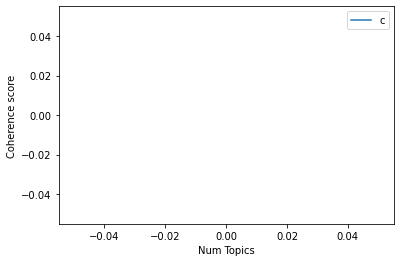

In [ ]:
# Show graph
limit=4000; start=200; step=600;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

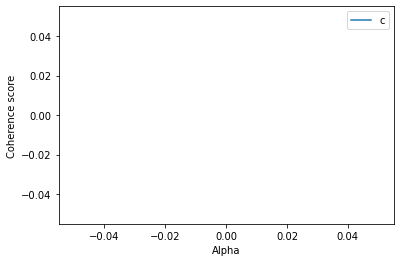

In [ ]:
# Coherence values for varying alpha
def compute_coherence_values_ALPHA(corpus, dictionary, num_topics, texts, start, limit, step):
    coherence_values = []
    model_list = []
    for alpha in range(start, limit, step):
        model = gensim.models.LdaMulticore(corpus=corpus, id2word=dictionary, num_topics=num_topics, random_state=100, alpha=alpha/10, passes=100)
        model_list.append(model)
        coherencemodel = gensim.models.CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())
    return model_list, coherence_values

model_list, coherence_values = compute_coherence_values_ALPHA(dictionary=id2word, corpus=corpus, num_topics=20, texts=list_word_topic, start=1, limit=10, step=1)

# Plot graph of coherence values by varying alpha
limit=10; start=1; step=1;
x_axis = []
for x in range(start, limit, step):
    x_axis.append(x/10)
plt.plot(x_axis, coherence_values)
plt.xlabel("Alpha")
plt.ylabel("Coherence score")
plt.legend(("coherence"), loc='best')
plt.show()